# Dataset Split and Data Loader

There are 2 split way, the first method only split dataset into train and test set as 4:1. In the second way, data was divided into train valid and test as 16:4:5.

Valid set should only be used to compare experiments with or without focal loss at the same time, because an epoch greater than 30 is prone to overfitting.

In [1]:
#First method, only split train and test 

import os
import shutil
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader

torch.cuda.reset_max_memory_cached()
torch.cuda.empty_cache()

# Set dataset and target paths
data_dir = 'data-polyvore'
output_dir = 'data2'
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Check if the dataset has already been split
if not os.path.exists(train_dir) or not os.path.exists(test_dir):
    print("Performing a new dataset split...")
    # Create folders for training and testing datasets
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    # Get all category folders
    categories = os.listdir(data_dir)

    # Split each category
    for category in categories:
        category_path = os.path.join(data_dir, category)

        if os.path.isdir(category_path):
            images = os.listdir(category_path)
            train_images, test_images = train_test_split(images, train_size=0.8, test_size=0.2, random_state=42)

            # Create training and testing subfolders for each category
            train_category_dir = os.path.join(train_dir, category)
            test_category_dir = os.path.join(test_dir, category)
            os.makedirs(train_category_dir, exist_ok=True)
            os.makedirs(test_category_dir, exist_ok=True)

            # Copy images to training and testing folders
            for img in train_images:
                src_path = os.path.join(category_path, img)
                dst_path = os.path.join(train_category_dir, img)
                try:
                    shutil.copy(src_path, dst_path)
                except Exception as e:
                    print(f"Error copying file {src_path}: {e}")

            for img in test_images:
                src_path = os.path.join(category_path, img)
                dst_path = os.path.join(test_category_dir, img)
                try:
                    shutil.copy(src_path, dst_path)
                except Exception as e:
                    print(f"Error copying file {src_path}: {e}")

    print("Initial split completed and saved to folders!")
else:
    print("Dataset already exists, skipping split.")

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224 to fit the ViT model
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Mean of ImageNet
                         std=[0.229, 0.224, 0.225])   # Std dev of ImageNet
])

# Load the split training and testing datasets
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

print("Data loading completed!")
print(f"Class indices: {train_dataset.class_to_idx}")


C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\cuda\memory.py:356: FutureWarning: torch.cuda.reset_max_memory_cached now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(


Performing a new dataset split...
Initial split completed and saved to folders!
Data loading completed!
Class indices: {'bag': 0, 'bracelet': 1, 'brooch': 2, 'dress': 3, 'earrings': 4, 'eyewear': 5, 'gloves': 6, 'hairwear': 7, 'hats': 8, 'jumpsuit': 9, 'legwear': 10, 'necklace': 11, 'neckwear': 12, 'outwear': 13, 'pants': 14, 'rings': 15, 'shoes': 16, 'skirt': 17, 'top': 18, 'watches': 19}


In [1]:
#Second method, split train valid and test

import os
import shutil
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader

torch.cuda.reset_max_memory_cached()
torch.cuda.empty_cache()

# Set dataset and target paths
data_dir = 'data-polyvore'
output_dir = 'data_val'
train_dir = os.path.join(output_dir, 'train')
val_dir = os.path.join(output_dir, 'val')  # 
test_dir = os.path.join(output_dir, 'test')

# Check if the dataset has already been split
if not os.path.exists(train_dir) or not os.path.exists(test_dir) or not os.path.exists(val_dir):
    print("Performing a new dataset split...")
    # Create folders for training, validation, and testing datasets
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    # Get all category folders
    categories = os.listdir(data_dir)

    # Split each category
    for category in categories:
        category_path = os.path.join(data_dir, category)

        if os.path.isdir(category_path):
            images = os.listdir(category_path)
            
            train_val_images, test_images = train_test_split(images, train_size=0.8, test_size=0.2, random_state=42)
            
            train_images, val_images = train_test_split(train_val_images, test_size=0.2, random_state=42)

            # Create training, validation, and testing subfolders for each category
            train_category_dir = os.path.join(train_dir, category)
            val_category_dir = os.path.join(val_dir, category)
            test_category_dir = os.path.join(test_dir, category)
            os.makedirs(train_category_dir, exist_ok=True)
            os.makedirs(val_category_dir, exist_ok=True)
            os.makedirs(test_category_dir, exist_ok=True)

            # Copy images to training, validation, and testing folders
            for img in train_images:
                src_path = os.path.join(category_path, img)
                dst_path = os.path.join(train_category_dir, img)
                try:
                    shutil.copy(src_path, dst_path)
                except Exception as e:
                    print(f"Error copying file {src_path}: {e}")

            for img in val_images:
                src_path = os.path.join(category_path, img)
                dst_path = os.path.join(val_category_dir, img)
                try:
                    shutil.copy(src_path, dst_path)
                except Exception as e:
                    print(f"Error copying file {src_path}: {e}")

            for img in test_images:
                src_path = os.path.join(category_path, img)
                dst_path = os.path.join(test_category_dir, img)
                try:
                    shutil.copy(src_path, dst_path)
                except Exception as e:
                    print(f"Error copying file {src_path}: {e}")

    print("Initial split completed and saved to folders!")
else:
    print("Dataset already exists, skipping split.")

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224 to fit the ViT model
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Mean of ImageNet
                         std=[0.229, 0.224, 0.225])   # Std dev of ImageNet
])

# Load the split training, validation, and testing datasets
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=200, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=100, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

print("Data loading completed!")
print(f"Class indices: {train_dataset.class_to_idx}")


C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\cuda\memory.py:356: FutureWarning: torch.cuda.reset_max_memory_cached now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(


Performing a new dataset split...
Initial split completed and saved to folders!
Data loading completed!
Class indices: {'bag': 0, 'bracelet': 1, 'brooch': 2, 'dress': 3, 'earrings': 4, 'eyewear': 5, 'gloves': 6, 'hairwear': 7, 'hats': 8, 'jumpsuit': 9, 'legwear': 10, 'necklace': 11, 'neckwear': 12, 'outwear': 13, 'pants': 14, 'rings': 15, 'shoes': 16, 'skirt': 17, 'top': 18, 'watches': 19}


# Model Training and Evaulate

As the torchvision has combined the vit-b-16 model, so here I just need to modify it hyperparameter.

## Basic Model

First I just train the basic model and only use train and test dataset.

In [2]:
# There are a basic model training 50 epoch to check the result.

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader, random_split
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import warnings
import os

# 1. Ignore specific warnings (optional)
warnings.filterwarnings("ignore", message="The parameter 'pretrained' is deprecated")
warnings.filterwarnings("ignore", message="Torch was not compiled with flash attention")

# 2. Define the ViT model
def get_vit_model(num_classes=20):
    model = models.vit_b_16(weights=None)  # weights=None means random initialization
    num_features = model.heads.head.in_features
    model.heads.head = nn.Linear(num_features, num_classes)
    return model

# 3. Initialize the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# 4. Data preprocessing
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# 5. Initialize model, loss function, optimizer, and scheduler
num_classes = 20  # Adjust the number of classes based on your task
model = get_vit_model(num_classes=num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# Mixed precision training initialization
scaler = GradScaler()

# 6. Set checkpoint save path
checkpoint_dir = 'checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint.pth')
best_model_path = os.path.join(checkpoint_dir, 'best_vit_model.pth')

# 7. Define training parameters
num_epochs = 50
start_epoch = 0
best_train_acc = 0.0  # To save the best model (based on training accuracy)

# 8. Check for saved checkpoint to resume training
if os.path.exists(checkpoint_path):
    print("Checkpoint found, resuming training...")
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    scaler.load_state_dict(checkpoint['scaler_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_train_acc = checkpoint['best_train_acc']
    print(f"Resuming training from epoch {start_epoch}")
else:
    print("No checkpoint found, starting new training")

# 9. Training loop
for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0
    running_corrects = 0

    # Display training progress with tqdm
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]", leave=False)
    
    for images, labels in train_bar:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data).item()

        # Calculate the accuracy of the current batch
        batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

        # Update the description in tqdm
        train_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects / len(train_loader.dataset)

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}')

    # Save the best model
    if epoch_acc > best_train_acc:
        best_train_acc = epoch_acc
        torch.save(model.state_dict(), best_model_path)
        print(f'Best model saved, Training Accuracy: {best_train_acc:.4f}')

    # Save checkpoint
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'best_train_acc': best_train_acc,
    }, checkpoint_path)
    print(f'Checkpoint saved at {checkpoint_path}')

    # Adjust learning rate
    scheduler.step()

print("Training completed!")


使用设备: cuda
找到检查点，正在恢复训练...
从 epoch 35 开始继续训练


Epoch 36/50 [训练]:   0%|                                                                                                                                                                                  | 0/397 [00:00<?, ?it/s]C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\nn\functional.py:5504: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = scaled_dot_product_attention(q, k, v, attn_mask, dropout_p, is_causal)


Epoch 36/50, Train Loss: 0.0143, Train Acc: 0.9957
最佳模型已保存，训练准确率: 0.9957
检查点已保存至 checkpoints\checkpoint.pth


Epoch 37/50, Train Loss: 0.0126, Train Acc: 0.9963
最佳模型已保存，训练准确率: 0.9963
检查点已保存至 checkpoints\checkpoint.pth


Epoch 38/50, Train Loss: 0.0121, Train Acc: 0.9963
检查点已保存至 checkpoints\checkpoint.pth


Epoch 39/50, Train Loss: 0.0101, Train Acc: 0.9967
最佳模型已保存，训练准确率: 0.9967
检查点已保存至 checkpoints\checkpoint.pth


Epoch 40/50, Train Loss: 0.0087, Train Acc: 0.9970
最佳模型已保存，训练准确率: 0.9970
检查点已保存至 checkpoints\checkpoint.pth


Epoch 41/50, Train Loss: 0.0084, Train Acc: 0.9968
检查点已保存至 checkpoints\checkpoint.pth


Epoch 42/50, Train Loss: 0.0071, Train Acc: 0.9970
最佳模型已保存，训练准确率: 0.9970
检查点已保存至 checkpoints\checkpoint.pth


Epoch 43/50, Train Loss: 0.0065, Train Acc: 0.9970
最佳模型已保存，训练准确率: 0.9970
检查点已保存至 checkpoints\checkpoint.pth


Epoch 44/50, Train Loss: 0.0063, Train Acc: 0.9971
最佳模型已保存，训练准确率: 0.9971
检查点已保存至 checkpoints\checkpoint.pth


Epoch 45/50, Train Loss: 0.0058, Train Acc: 0.9971
最佳模型已保存，训练准确率: 0.9971
检查点已保存至 checkpoints\checkpoint.pth


Epoch 46/50, Train Loss: 0.0055, Train Acc: 0.9971
检查点已保存至 checkpoints\checkpoint.pth


Epoch 47/50, Train Loss: 0.0048, Train Acc: 0.9974
最佳模型已保存，训练准确率: 0.9974
检查点已保存至 checkpoints\checkpoint.pth


Epoch 48/50, Train Loss: 0.0045, Train Acc: 0.9974
检查点已保存至 checkpoints\checkpoint.pth


Epoch 49/50, Train Loss: 0.0041, Train Acc: 0.9976
最佳模型已保存，训练准确率: 0.9976
检查点已保存至 checkpoints\checkpoint.pth


Epoch 50/50, Train Loss: 0.0041, Train Acc: 0.9977
最佳模型已保存，训练准确率: 0.9977
检查点已保存至 checkpoints\checkpoint.pth
训练完成！


F1 Score (Macro): 0.8276
F1 Score (Weighted): 0.9065
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      4254
           1       0.77      0.78      0.77      1035
           2       0.66      0.59      0.62       200
           3       0.84      0.78      0.81      1496
           4       0.95      0.94      0.95      1102
           5       0.98      0.99      0.99      1337
           6       0.75      0.65      0.70        78
           7       0.69      0.54      0.61       139
           8       0.91      0.92      0.91       583
           9       0.71      0.48      0.57        60
          10       0.89      0.59      0.71        41
          11       0.88      0.90      0.89       932
          12       0.85      0.75      0.79       237
          13       0.85      0.86      0.85      2034
          14       0.96      0.97      0.97      1791
          15       0.74      0.75      0.74       646
          16       0.97     

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x00000184EF0BE8E0>
Traceback (most recent call last):
  File "C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\utils\data\dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\utils\data\dataloader.py", line 1437, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
                                   ^^^^^^^^^^^^^^^^^^^^
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x00000184EF0BE8E0>
Traceback (most recent call last):
  File "C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\utils\data\dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\utils\da

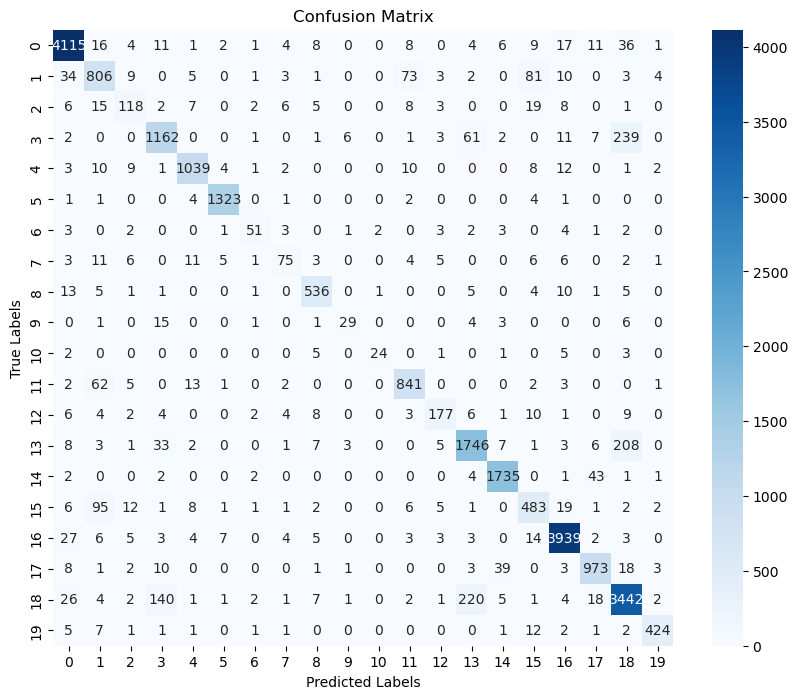

test result - Loss: 1.0332, Acc: 0.9072


In [20]:
### basic model eval

from sklearn.metrics import f1_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from tqdm import tqdm
model.load_state_dict(torch.load('checkpoints/best_vit_model.pth'))
model.to(device)
model.eval()

def evaluate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    all_labels = []
    all_preds = []

    test_bar = tqdm(dataloader, desc="test", leave=False)

    with torch.no_grad():
        for images, labels in test_bar:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            with torch.cuda.amp.autocast():  # Assuming autocast is used with mixed precision
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data).item()

            # Collect all labels and predictions for F1 score and confusion matrix
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

            # Display per-batch accuracy in the progress bar
            batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)
            test_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    avg_loss = running_loss / len(dataloader.dataset)
    avg_acc = running_corrects / len(dataloader.dataset)

    # Calculate F1 Score (macro and weighted)
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    print(f"F1 Score (Macro): {f1_macro:.4f}")
    print(f"F1 Score (Weighted): {f1_weighted:.4f}")

    # Print classification report
    print(classification_report(all_labels, all_preds))

    # Generate and plot confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

    return avg_loss, avg_acc

# eval
test_loss, test_acc = evaluate(model, test_loader, criterion, device)
print(f'test result - Loss: {test_loss:.4f}, Acc: {test_acc:.4f}')


Here I noticed a huge difference in the accuracy of the training set and the test set, so I introduced validation sets in all subsequent training. At the same time, through the analysis of confusion matrix, I had an intuitive observation of the unbalanced number of categories, and tried to solve this problem with a new method, such as focal loss

## FROM CE LOSS TO FOCAL LOSS 

In order the challenge the long tail problem, I introduce the focal loss.

### Default Focal (best model)

Here we choose Focal parameter as 
criterion_Focal = CrossEntropyFocalLoss(gamma=2.0, reduction='mean')

Using device: cuda
Data loading completed!
Class indices: {'bag': 0, 'bracelet': 1, 'brooch': 2, 'dress': 3, 'earrings': 4, 'eyewear': 5, 'gloves': 6, 'hairwear': 7, 'hats': 8, 'jumpsuit': 9, 'legwear': 10, 'necklace': 11, 'neckwear': 12, 'outwear': 13, 'pants': 14, 'rings': 15, 'shoes': 16, 'skirt': 17, 'top': 18, 'watches': 19}


<ipython-input-11-4f41e0171898>:78: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Main checkpoint found, resuming training...
No checkpoint found for epoch 0.


Epoch 1/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50, Train Loss: 1.9424, Train Acc: 0.2641
Epoch 1/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is 

F1 Score (Macro): 0.1466
F1 Score (Weighted): 0.2916
              precision    recall  f1-score   support

           0       0.31      0.50      0.38      3404
           1       0.00      0.00      0.00       828
           2       0.00      0.00      0.00       159
           3       0.18      0.02      0.03      1197
           4       0.61      0.02      0.05       881
           5       0.43      0.38      0.40      1069
           6       0.00      0.00      0.00        62
           7       0.00      0.00      0.00       111
           8       0.00      0.00      0.00       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        33
          11       0.39      0.32      0.35       747
          12       0.00      0.00      0.00       191
          13       0.32      0.17      0.22      1628
          14       0.58      0.49      0.53      1434
          15       0.00      0.00      0.00       517
          16       0.33     

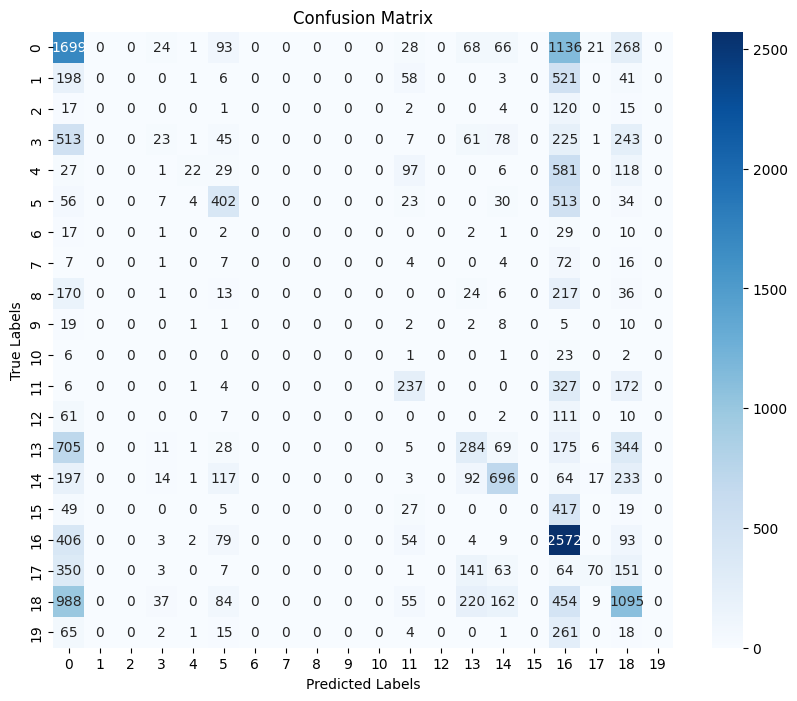

Epoch 1/50, Val Loss: 1.5373, Val Acc: 0.3494
Best model saved, Validation Accuracy: 0.3494
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_1.pth


Epoch 2/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 2/50, Train Loss: 1.2714, Train Acc: 0.4412
Epoch 2/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is 

F1 Score (Macro): 0.2853
F1 Score (Weighted): 0.4595
              precision    recall  f1-score   support

           0       0.63      0.63      0.63      3404
           1       0.45      0.18      0.26       828
           2       0.00      0.00      0.00       159
           3       0.37      0.09      0.14      1197
           4       0.57      0.39      0.46       881
           5       0.98      0.43      0.60      1069
           6       0.00      0.00      0.00        62
           7       0.00      0.00      0.00       111
           8       0.34      0.14      0.20       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        33
          11       0.34      0.72      0.46       747
          12       0.00      0.00      0.00       191
          13       0.58      0.13      0.21      1628
          14       0.78      0.63      0.70      1434
          15       0.27      0.19      0.23       517
          16       0.42     

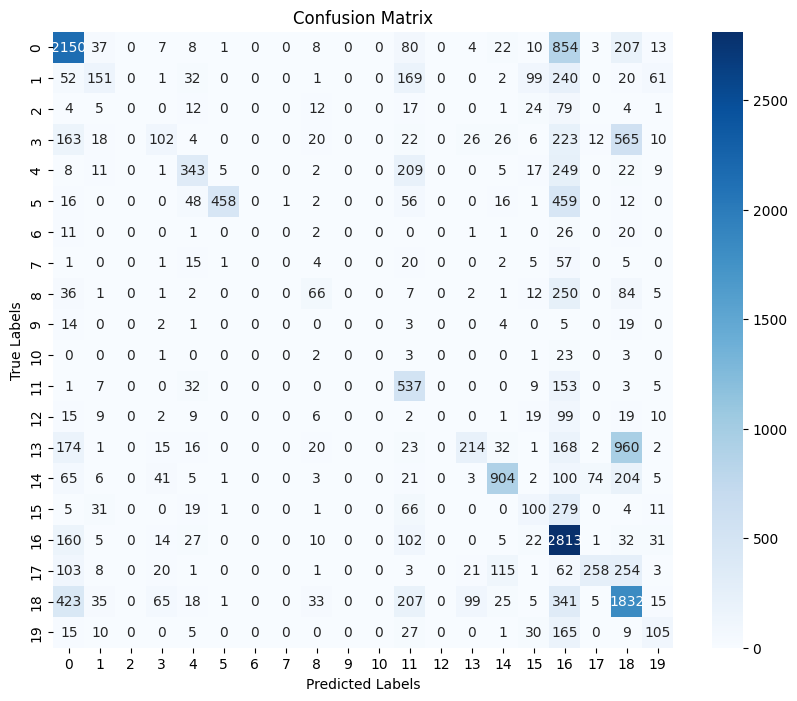

Epoch 2/50, Val Loss: 1.0805, Val Acc: 0.4938
Best model saved, Validation Accuracy: 0.4938
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_2.pth


Epoch 3/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 3/50, Train Loss: 0.8863, Train Acc: 0.5671
Epoch 3/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is 

F1 Score (Macro): 0.3935
F1 Score (Weighted): 0.5928
              precision    recall  f1-score   support

           0       0.77      0.72      0.75      3404
           1       0.47      0.38      0.42       828
           2       0.67      0.01      0.02       159
           3       0.46      0.27      0.34      1197
           4       0.52      0.56      0.54       881
           5       0.75      0.87      0.81      1069
           6       0.00      0.00      0.00        62
           7       0.00      0.00      0.00       111
           8       0.40      0.57      0.47       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        33
          11       0.49      0.80      0.61       747
          12       0.37      0.04      0.07       191
          13       0.51      0.54      0.52      1628
          14       0.76      0.78      0.77      1434
          15       0.46      0.17      0.25       517
          16       0.67     

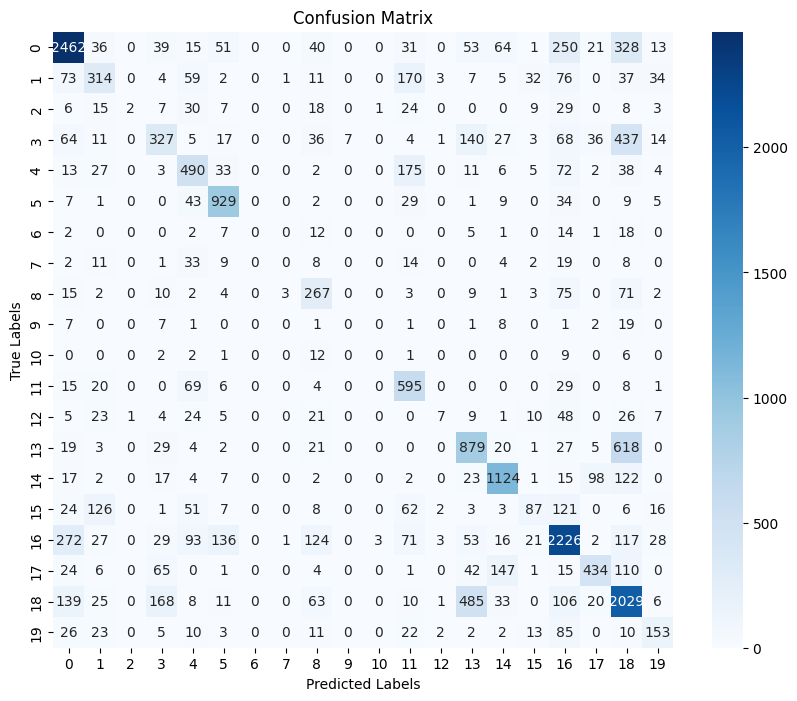

Epoch 3/50, Val Loss: 0.7788, Val Acc: 0.6066
Best model saved, Validation Accuracy: 0.6066
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_3.pth


Epoch 4/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 4/50, Train Loss: 0.7137, Train Acc: 0.6297
Epoch 4/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is 

F1 Score (Macro): 0.4470
F1 Score (Weighted): 0.6332
              precision    recall  f1-score   support

           0       0.80      0.79      0.80      3404
           1       0.55      0.39      0.45       828
           2       0.29      0.25      0.27       159
           3       0.44      0.31      0.36      1197
           4       0.73      0.45      0.56       881
           5       0.81      0.92      0.86      1069
           6       0.00      0.00      0.00        62
           7       0.33      0.05      0.08       111
           8       0.64      0.49      0.55       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        33
          11       0.69      0.60      0.64       747
          12       0.24      0.26      0.25       191
          13       0.56      0.53      0.54      1628
          14       0.67      0.87      0.76      1434
          15       0.44      0.35      0.39       517
          16       0.67     

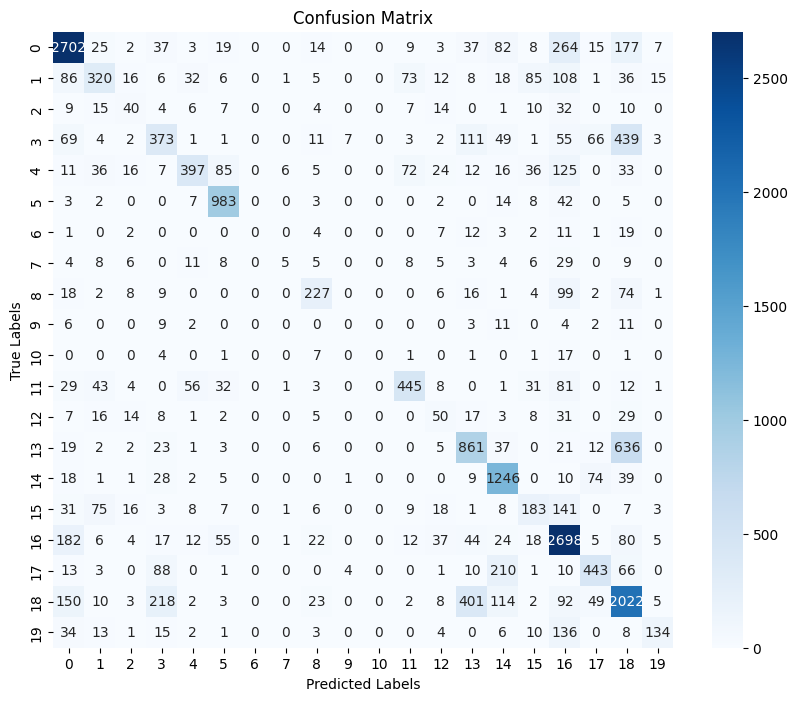

Epoch 4/50, Val Loss: 0.6952, Val Acc: 0.6461
Best model saved, Validation Accuracy: 0.6461
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_4.pth


Epoch 5/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 5/50, Train Loss: 0.6266, Train Acc: 0.6661
Epoch 5/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.4819
F1 Score (Weighted): 0.6618
              precision    recall  f1-score   support

           0       0.77      0.85      0.81      3404
           1       0.54      0.42      0.48       828
           2       0.33      0.18      0.23       159
           3       0.44      0.37      0.40      1197
           4       0.54      0.78      0.64       881
           5       0.91      0.81      0.86      1069
           6       0.40      0.03      0.06        62
           7       0.21      0.11      0.14       111
           8       0.57      0.58      0.58       467
           9       0.03      0.08      0.05        48
          10       0.00      0.00      0.00        33
          11       0.78      0.49      0.60       747
          12       0.33      0.28      0.30       191
          13       0.53      0.64      0.58      1628
          14       0.89      0.76      0.82      1434
          15       0.41      0.50      0.45       517
          16       0.80     

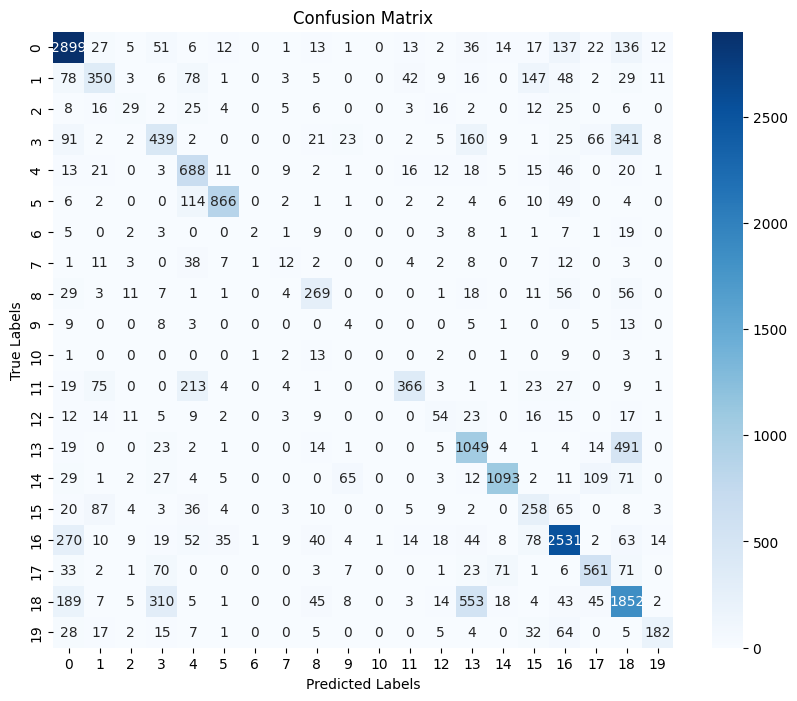

Epoch 5/50, Val Loss: 0.6246, Val Acc: 0.6646
Best model saved, Validation Accuracy: 0.6646
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_5.pth


Epoch 6/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 6/50, Train Loss: 0.5703, Train Acc: 0.6908
Epoch 6/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is 

F1 Score (Macro): 0.5028
F1 Score (Weighted): 0.6861
              precision    recall  f1-score   support

           0       0.81      0.85      0.83      3404
           1       0.48      0.52      0.50       828
           2       0.51      0.28      0.36       159
           3       0.47      0.42      0.44      1197
           4       0.62      0.75      0.68       881
           5       0.95      0.85      0.89      1069
           6       0.75      0.10      0.17        62
           7       0.57      0.04      0.07       111
           8       0.76      0.47      0.58       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        33
          11       0.73      0.60      0.66       747
          12       0.53      0.21      0.30       191
          13       0.65      0.52      0.57      1628
          14       0.88      0.80      0.84      1434
          15       0.42      0.51      0.46       517
          16       0.78     

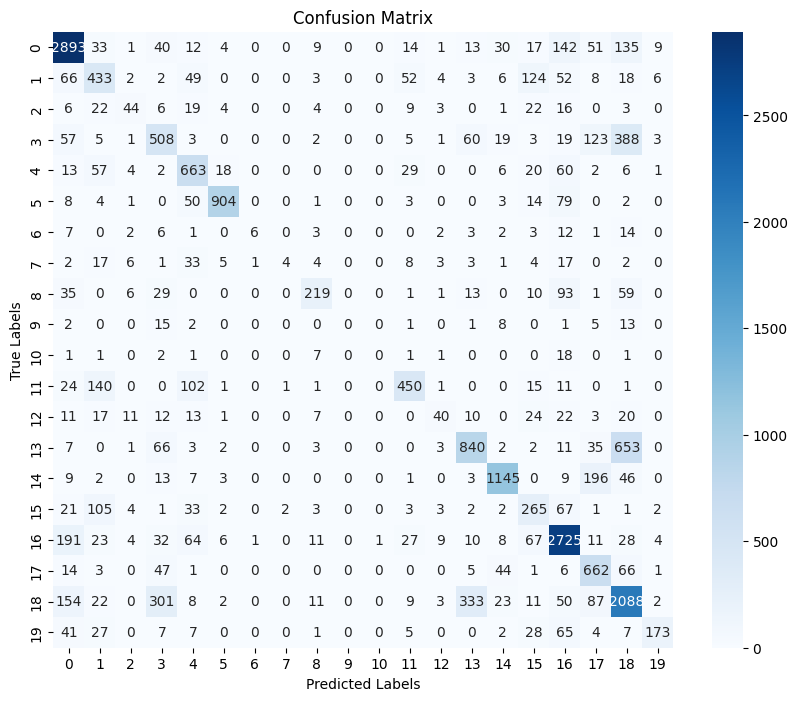

Epoch 6/50, Val Loss: 0.5501, Val Acc: 0.6921
Best model saved, Validation Accuracy: 0.6921
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_6.pth


Epoch 7/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 7/50, Train Loss: 0.5169, Train Acc: 0.7108
Epoch 7/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.5166
F1 Score (Weighted): 0.6828
              precision    recall  f1-score   support

           0       0.86      0.80      0.83      3404
           1       0.47      0.56      0.51       828
           2       0.41      0.19      0.26       159
           3       0.52      0.38      0.44      1197
           4       0.69      0.69      0.69       881
           5       0.89      0.91      0.90      1069
           6       0.50      0.11      0.18        62
           7       0.16      0.20      0.18       111
           8       0.56      0.49      0.52       467
           9       0.05      0.10      0.07        48
          10       0.22      0.15      0.18        33
          11       0.75      0.63      0.69       747
          12       0.41      0.25      0.31       191
          13       0.70      0.43      0.53      1628
          14       0.86      0.82      0.84      1434
          15       0.45      0.53      0.49       517
          16       0.74     

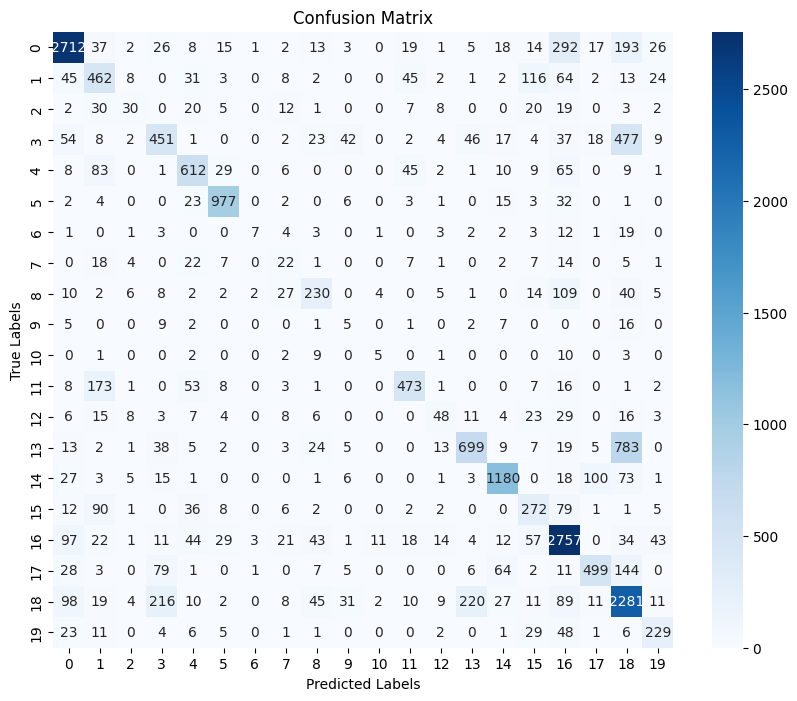

Epoch 7/50, Val Loss: 0.5658, Val Acc: 0.6866
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_7.pth


Epoch 8/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 8/50, Train Loss: 0.4659, Train Acc: 0.7333
Epoch 8/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.5034
F1 Score (Weighted): 0.6597
              precision    recall  f1-score   support

           0       0.88      0.80      0.84      3404
           1       0.70      0.29      0.41       828
           2       0.23      0.39      0.29       159
           3       0.35      0.56      0.43      1197
           4       0.67      0.75      0.71       881
           5       0.88      0.93      0.90      1069
           6       0.70      0.11      0.19        62
           7       0.24      0.09      0.13       111
           8       0.69      0.55      0.61       467
           9       0.50      0.02      0.04        48
          10       0.40      0.06      0.11        33
          11       0.73      0.74      0.73       747
          12       0.21      0.52      0.30       191
          13       0.48      0.83      0.61      1628
          14       0.83      0.91      0.87      1434
          15       0.38      0.65      0.48       517
          16       0.92     

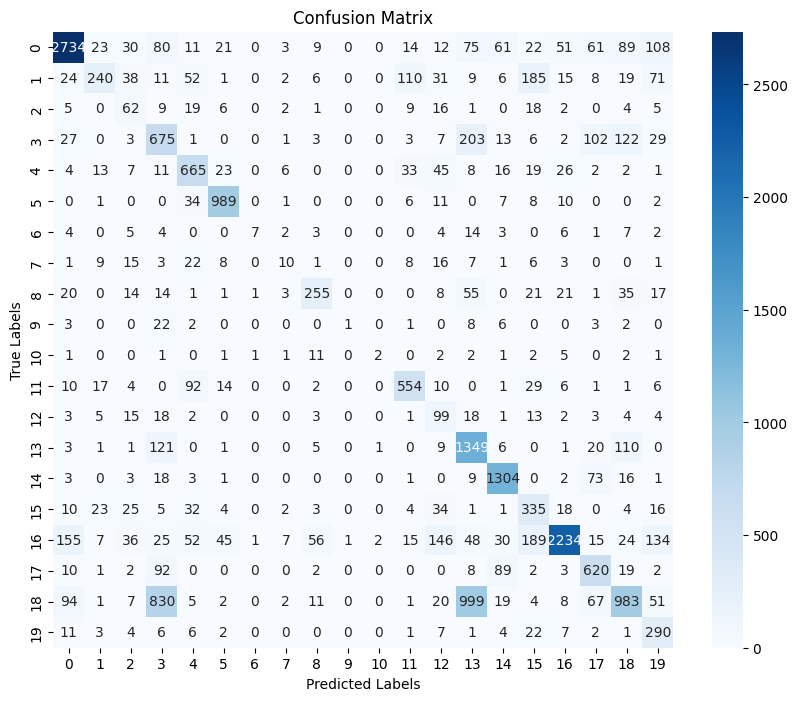

Epoch 8/50, Val Loss: 0.5758, Val Acc: 0.6599
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_8.pth


Epoch 9/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 9/50, Train Loss: 0.4403, Train Acc: 0.7447
Epoch 9/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is 

F1 Score (Macro): 0.5214
F1 Score (Weighted): 0.6990
              precision    recall  f1-score   support

           0       0.84      0.87      0.86      3404
           1       0.59      0.37      0.46       828
           2       0.39      0.28      0.32       159
           3       0.45      0.49      0.47      1197
           4       0.92      0.39      0.55       881
           5       0.98      0.78      0.87      1069
           6       0.55      0.18      0.27        62
           7       0.38      0.09      0.15       111
           8       0.62      0.67      0.65       467
           9       0.00      0.00      0.00        48
          10       0.15      0.09      0.11        33
          11       0.69      0.75      0.72       747
          12       0.51      0.20      0.29       191
          13       0.64      0.60      0.62      1628
          14       0.87      0.86      0.86      1434
          15       0.46      0.55      0.50       517
          16       0.77     

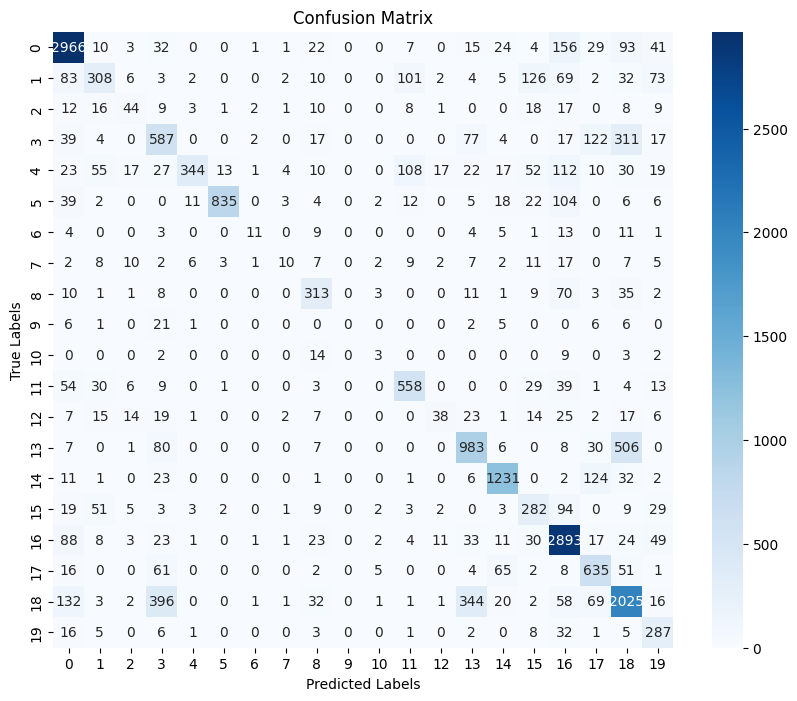

Epoch 9/50, Val Loss: 0.5380, Val Acc: 0.7064
Best model saved, Validation Accuracy: 0.7064
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_9.pth


Epoch 10/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 10/50, Train Loss: 0.4184, Train Acc: 0.7574
Epoch 10/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.5627
F1 Score (Weighted): 0.7319
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      3404
           1       0.63      0.38      0.47       828
           2       0.45      0.40      0.42       159
           3       0.51      0.55      0.53      1197
           4       0.92      0.47      0.62       881
           5       0.96      0.88      0.92      1069
           6       0.59      0.16      0.25        62
           7       0.39      0.08      0.13       111
           8       0.56      0.82      0.67       467
           9       0.50      0.02      0.04        48
          10       0.56      0.15      0.24        33
          11       0.75      0.75      0.75       747
          12       0.36      0.37      0.37       191
          13       0.68      0.66      0.67      1628
          14       0.96      0.83      0.89      1434
          15       0.46      0.62      0.53       517
          16       0.83     

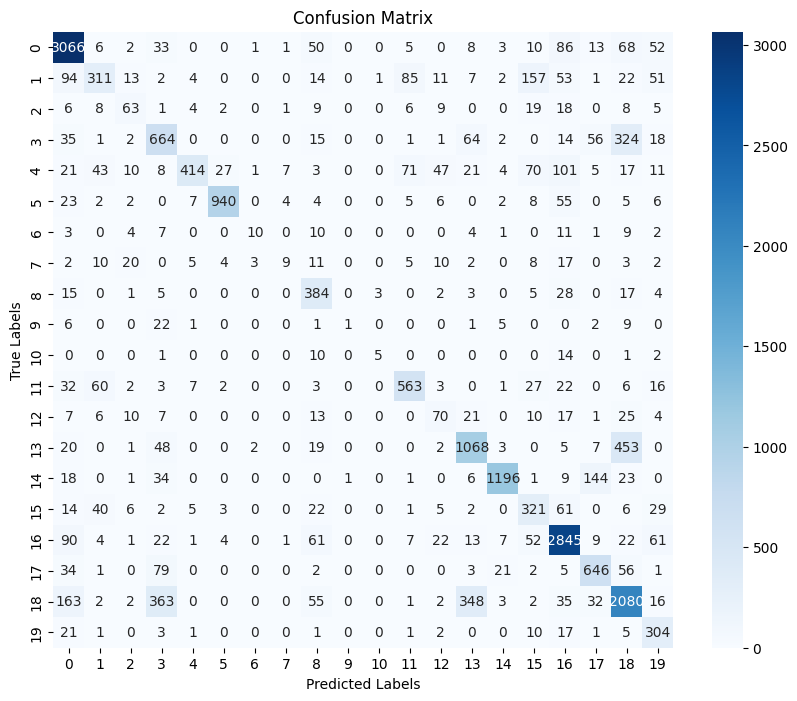

Epoch 10/50, Val Loss: 0.4570, Val Acc: 0.7363
Best model saved, Validation Accuracy: 0.7363
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_10.pth


Epoch 11/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 11/50, Train Loss: 0.3815, Train Acc: 0.7715
Epoch 11/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.5847
F1 Score (Weighted): 0.7500
              precision    recall  f1-score   support

           0       0.91      0.86      0.89      3404
           1       0.59      0.61      0.60       828
           2       0.57      0.25      0.34       159
           3       0.49      0.59      0.54      1197
           4       0.71      0.87      0.78       881
           5       0.95      0.89      0.92      1069
           6       0.37      0.40      0.38        62
           7       0.48      0.09      0.15       111
           8       0.92      0.46      0.62       467
           9       0.04      0.04      0.04        48
          10       0.29      0.06      0.10        33
          11       0.82      0.72      0.77       747
          12       0.38      0.52      0.44       191
          13       0.67      0.69      0.68      1628
          14       0.83      0.93      0.88      1434
          15       0.57      0.53      0.55       517
          16       0.81     

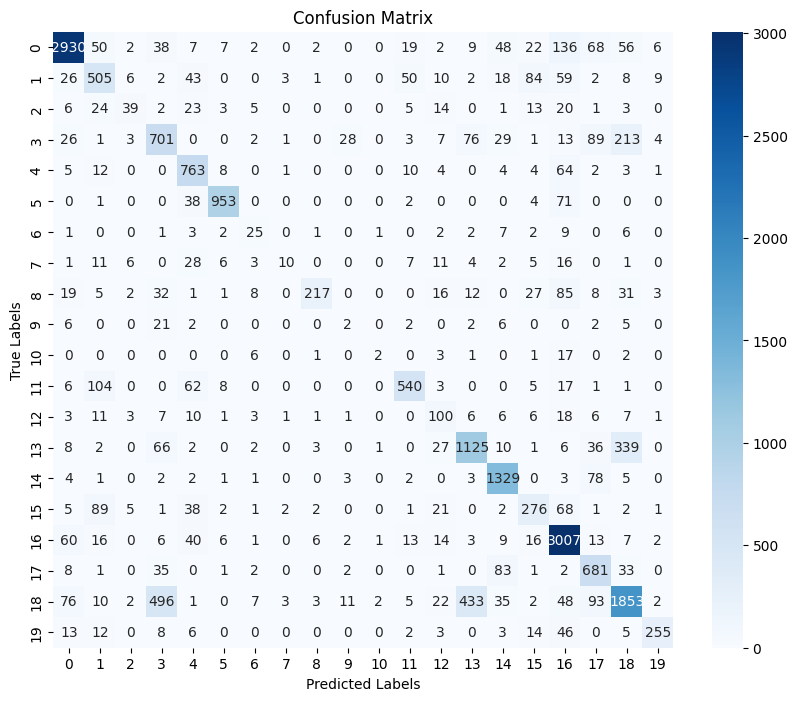

Epoch 11/50, Val Loss: 0.4161, Val Acc: 0.7536
Best model saved, Validation Accuracy: 0.7536
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_11.pth


Epoch 12/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 12/50, Train Loss: 0.3595, Train Acc: 0.7836
Epoch 12/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.5808
F1 Score (Weighted): 0.7451
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      3404
           1       0.57      0.37      0.45       828
           2       0.51      0.29      0.37       159
           3       0.60      0.50      0.54      1197
           4       0.88      0.60      0.71       881
           5       0.95      0.92      0.93      1069
           6       0.33      0.40      0.36        62
           7       0.65      0.12      0.20       111
           8       0.79      0.69      0.73       467
           9       0.33      0.02      0.04        48
          10       0.29      0.06      0.10        33
          11       0.78      0.77      0.77       747
          12       0.62      0.37      0.46       191
          13       0.59      0.83      0.69      1628
          14       0.93      0.88      0.90      1434
          15       0.36      0.79      0.50       517
          16       0.87     

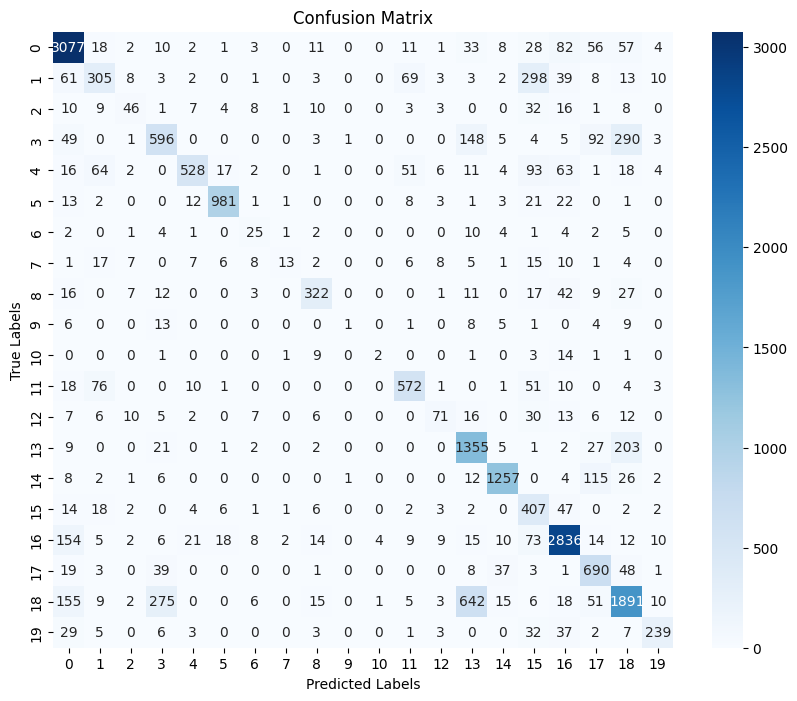

Epoch 12/50, Val Loss: 0.4218, Val Acc: 0.7488
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_12.pth


Epoch 13/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 13/50, Train Loss: 0.3353, Train Acc: 0.7952
Epoch 13/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6182
F1 Score (Weighted): 0.7637
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      3404
           1       0.68      0.50      0.57       828
           2       0.41      0.44      0.43       159
           3       0.56      0.62      0.59      1197
           4       0.74      0.84      0.78       881
           5       0.95      0.93      0.94      1069
           6       0.74      0.32      0.45        62
           7       0.60      0.14      0.22       111
           8       0.79      0.74      0.76       467
           9       0.15      0.17      0.16        48
          10       0.56      0.15      0.24        33
          11       0.85      0.68      0.76       747
          12       0.77      0.33      0.46       191
          13       0.71      0.72      0.71      1628
          14       0.83      0.93      0.88      1434
          15       0.55      0.52      0.54       517
          16       0.77     

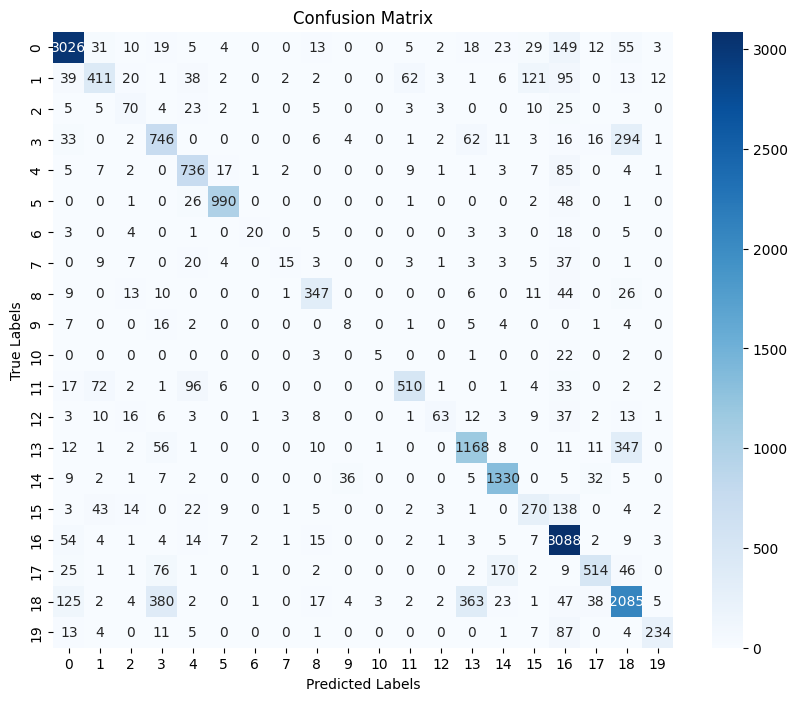

Epoch 13/50, Val Loss: 0.3718, Val Acc: 0.7695
Best model saved, Validation Accuracy: 0.7695
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_13.pth


Epoch 14/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 14/50, Train Loss: 0.3136, Train Acc: 0.8035
Epoch 14/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6319
F1 Score (Weighted): 0.7645
              precision    recall  f1-score   support

           0       0.84      0.93      0.89      3404
           1       0.61      0.60      0.61       828
           2       0.54      0.35      0.42       159
           3       0.76      0.35      0.48      1197
           4       0.82      0.80      0.81       881
           5       0.98      0.94      0.96      1069
           6       0.81      0.27      0.41        62
           7       0.31      0.30      0.31       111
           8       0.80      0.80      0.80       467
           9       0.60      0.12      0.21        48
          10       0.44      0.24      0.31        33
          11       0.88      0.66      0.75       747
          12       0.30      0.72      0.42       191
          13       0.54      0.90      0.67      1628
          14       0.89      0.94      0.91      1434
          15       0.53      0.63      0.58       517
          16       0.87     

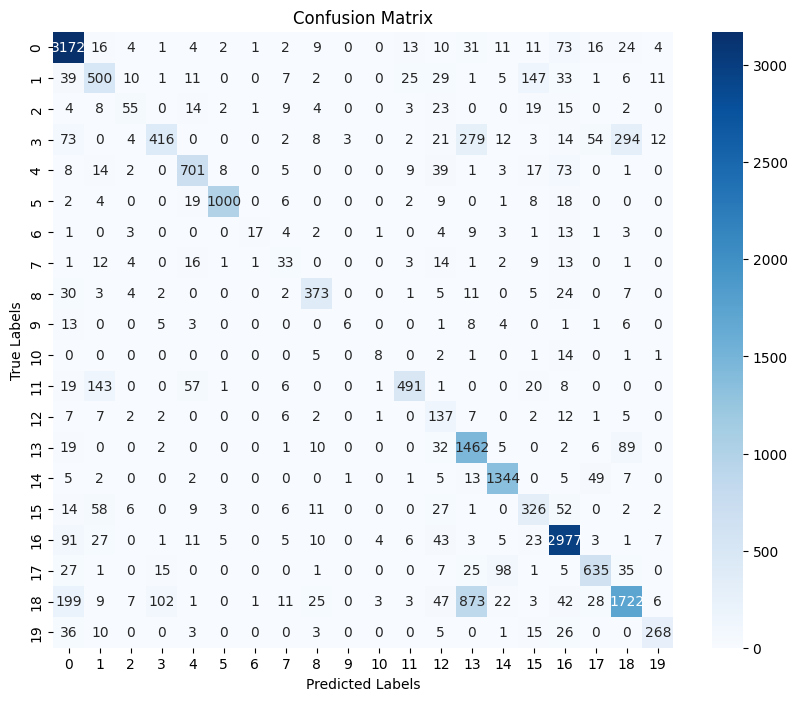

Epoch 14/50, Val Loss: 0.3860, Val Acc: 0.7699
Best model saved, Validation Accuracy: 0.7699
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_14.pth


Epoch 15/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 15/50, Train Loss: 0.2949, Train Acc: 0.8147
Epoch 15/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6589
F1 Score (Weighted): 0.7872
              precision    recall  f1-score   support

           0       0.93      0.89      0.91      3404
           1       0.71      0.52      0.60       828
           2       0.57      0.42      0.48       159
           3       0.47      0.78      0.59      1197
           4       0.82      0.81      0.82       881
           5       0.96      0.94      0.95      1069
           6       0.72      0.37      0.49        62
           7       0.46      0.32      0.38       111
           8       0.73      0.87      0.79       467
           9       0.21      0.17      0.19        48
          10       0.56      0.15      0.24        33
          11       0.65      0.93      0.76       747
          12       0.74      0.47      0.57       191
          13       0.70      0.80      0.75      1628
          14       0.94      0.91      0.92      1434
          15       0.61      0.64      0.63       517
          16       0.90     

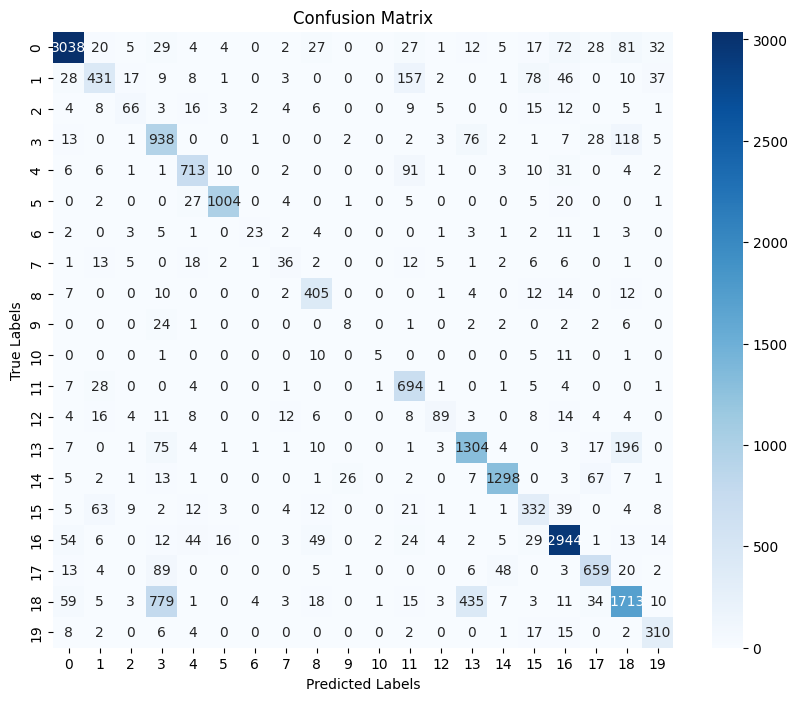

Epoch 15/50, Val Loss: 0.3190, Val Acc: 0.7879
Best model saved, Validation Accuracy: 0.7879
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_15.pth


Epoch 16/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 16/50, Train Loss: 0.2775, Train Acc: 0.8208
Epoch 16/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6720
F1 Score (Weighted): 0.8024
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      3404
           1       0.68      0.62      0.65       828
           2       0.87      0.17      0.28       159
           3       0.52      0.75      0.62      1197
           4       0.89      0.81      0.84       881
           5       0.95      0.94      0.95      1069
           6       0.62      0.45      0.52        62
           7       0.50      0.35      0.41       111
           8       0.82      0.79      0.80       467
           9       0.67      0.04      0.08        48
          10       0.50      0.36      0.42        33
          11       0.75      0.85      0.80       747
          12       0.59      0.65      0.62       191
          13       0.73      0.80      0.76      1628
          14       0.94      0.91      0.92      1434
          15       0.68      0.58      0.62       517
          16       0.88     

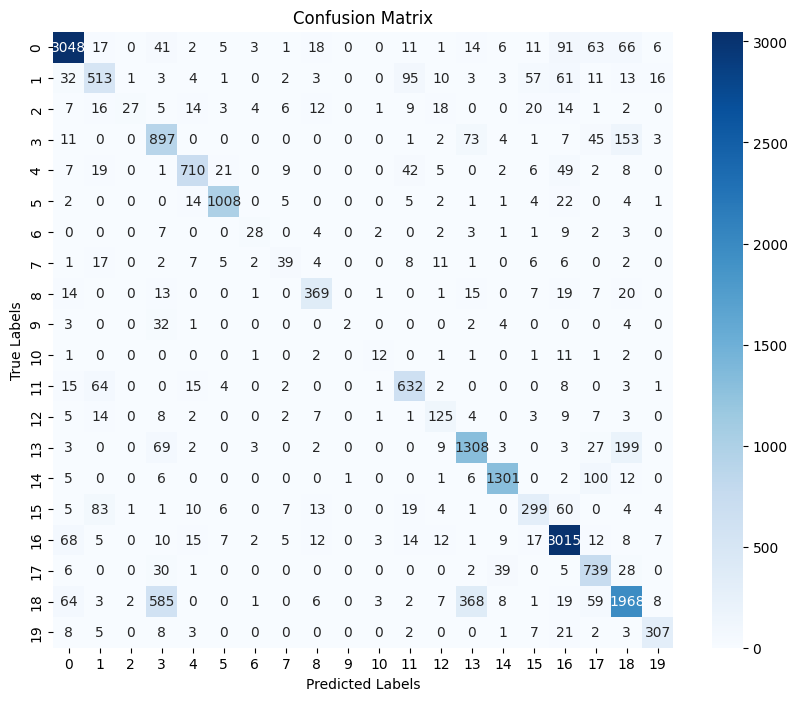

Epoch 16/50, Val Loss: 0.3135, Val Acc: 0.8045
Best model saved, Validation Accuracy: 0.8045
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_16.pth


Epoch 17/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 17/50, Train Loss: 0.2611, Train Acc: 0.8305
Epoch 17/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6335
F1 Score (Weighted): 0.7849
              precision    recall  f1-score   support

           0       0.90      0.91      0.90      3404
           1       0.62      0.60      0.61       828
           2       0.66      0.40      0.50       159
           3       0.65      0.52      0.58      1197
           4       0.91      0.76      0.83       881
           5       0.93      0.96      0.94      1069
           6       0.86      0.19      0.32        62
           7       0.37      0.30      0.33       111
           8       0.51      0.92      0.66       467
           9       0.70      0.15      0.24        48
          10       0.11      0.03      0.05        33
          11       0.85      0.73      0.79       747
          12       0.46      0.61      0.53       191
          13       0.61      0.87      0.72      1628
          14       0.91      0.92      0.92      1434
          15       0.52      0.69      0.59       517
          16       0.93     

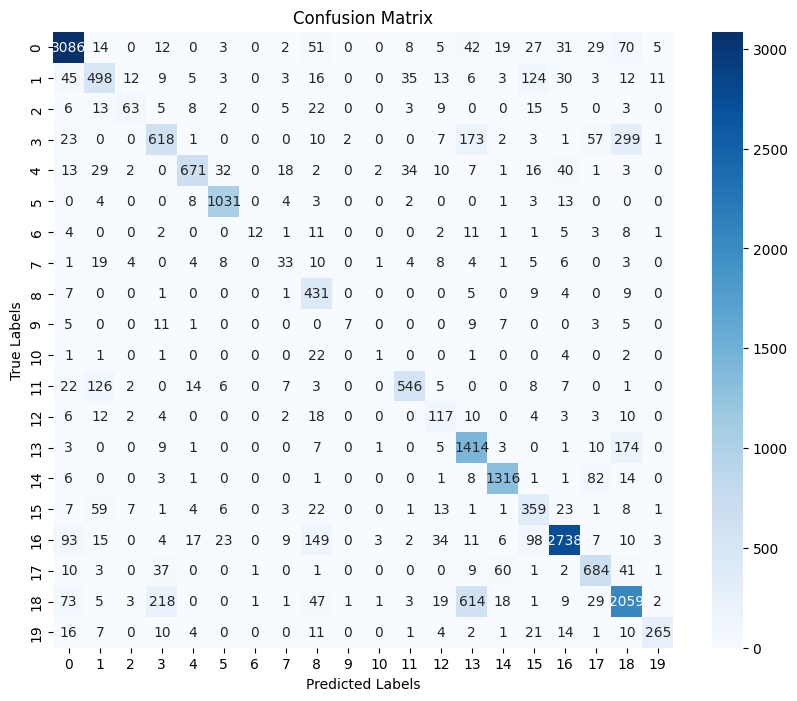

Epoch 17/50, Val Loss: 0.3574, Val Acc: 0.7849
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_17.pth


Epoch 18/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 18/50, Train Loss: 0.2464, Train Acc: 0.8367
Epoch 18/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6925
F1 Score (Weighted): 0.8198
              precision    recall  f1-score   support

           0       0.95      0.89      0.92      3404
           1       0.60      0.74      0.66       828
           2       0.65      0.45      0.54       159
           3       0.59      0.71      0.65      1197
           4       0.95      0.76      0.84       881
           5       0.94      0.97      0.95      1069
           6       0.80      0.45      0.58        62
           7       0.44      0.44      0.44       111
           8       0.86      0.78      0.82       467
           9       0.17      0.38      0.23        48
          10       1.00      0.12      0.22        33
          11       0.86      0.77      0.81       747
          12       0.52      0.71      0.60       191
          13       0.81      0.68      0.74      1628
          14       0.96      0.87      0.91      1434
          15       0.61      0.61      0.61       517
          16       0.91     

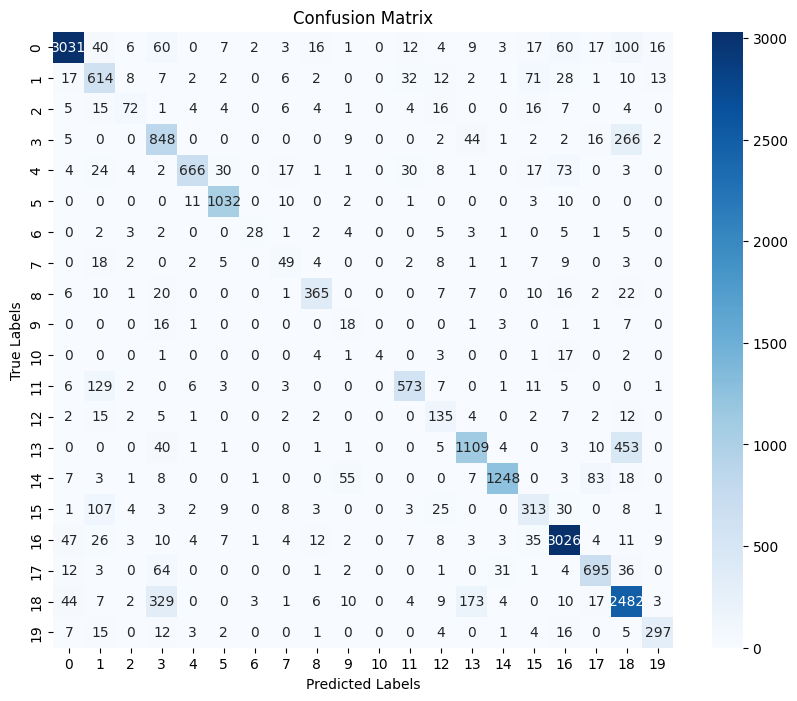

Epoch 18/50, Val Loss: 0.2894, Val Acc: 0.8172
Best model saved, Validation Accuracy: 0.8172
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_18.pth


Epoch 19/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 19/50, Train Loss: 0.2309, Train Acc: 0.8461
Epoch 19/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.6857
F1 Score (Weighted): 0.8179
              precision    recall  f1-score   support

           0       0.90      0.93      0.92      3404
           1       0.65      0.74      0.69       828
           2       0.79      0.39      0.52       159
           3       0.66      0.62      0.64      1197
           4       0.85      0.87      0.86       881
           5       0.97      0.95      0.96      1069
           6       0.57      0.39      0.46        62
           7       0.47      0.28      0.35       111
           8       0.73      0.88      0.80       467
           9       0.59      0.21      0.31        48
          10       0.50      0.18      0.27        33
          11       0.84      0.84      0.84       747
          12       0.51      0.69      0.58       191
          13       0.67      0.87      0.76      1628
          14       0.97      0.88      0.92      1434
          15       0.72      0.51      0.60       517
          16       0.90     

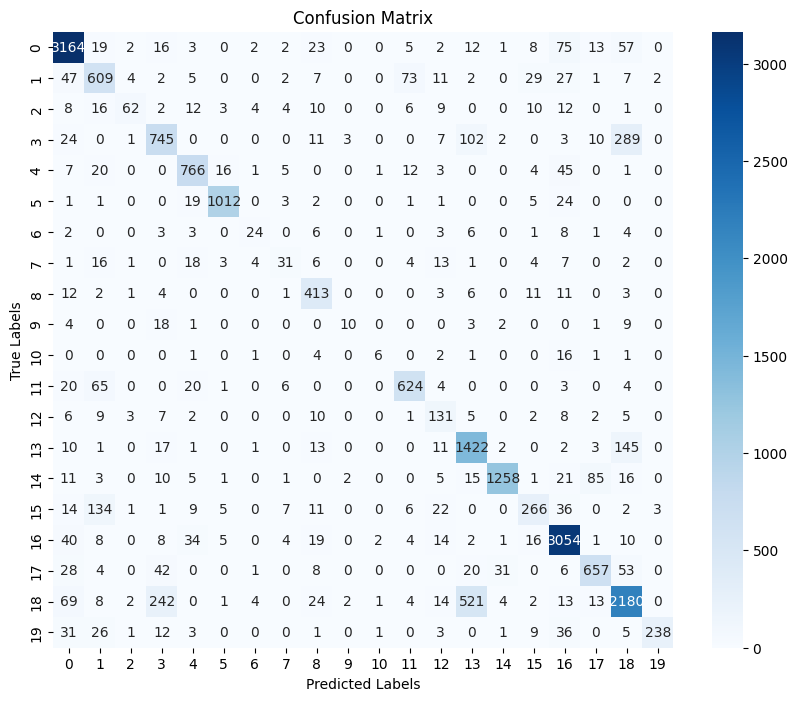

Epoch 19/50, Val Loss: 0.2877, Val Acc: 0.8205
Best model saved, Validation Accuracy: 0.8205
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_19.pth


Epoch 20/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 20/50, Train Loss: 0.2201, Train Acc: 0.8511
Epoch 20/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7232
F1 Score (Weighted): 0.8356
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      3404
           1       0.68      0.72      0.70       828
           2       0.76      0.40      0.52       159
           3       0.82      0.49      0.62      1197
           4       0.91      0.86      0.89       881
           5       0.94      0.98      0.96      1069
           6       0.76      0.45      0.57        62
           7       0.46      0.50      0.48       111
           8       0.83      0.89      0.86       467
           9       0.62      0.21      0.31        48
          10       0.44      0.42      0.43        33
          11       0.84      0.80      0.82       747
          12       0.70      0.61      0.66       191
          13       0.81      0.72      0.76      1628
          14       0.93      0.95      0.94      1434
          15       0.69      0.66      0.67       517
          16       0.91     

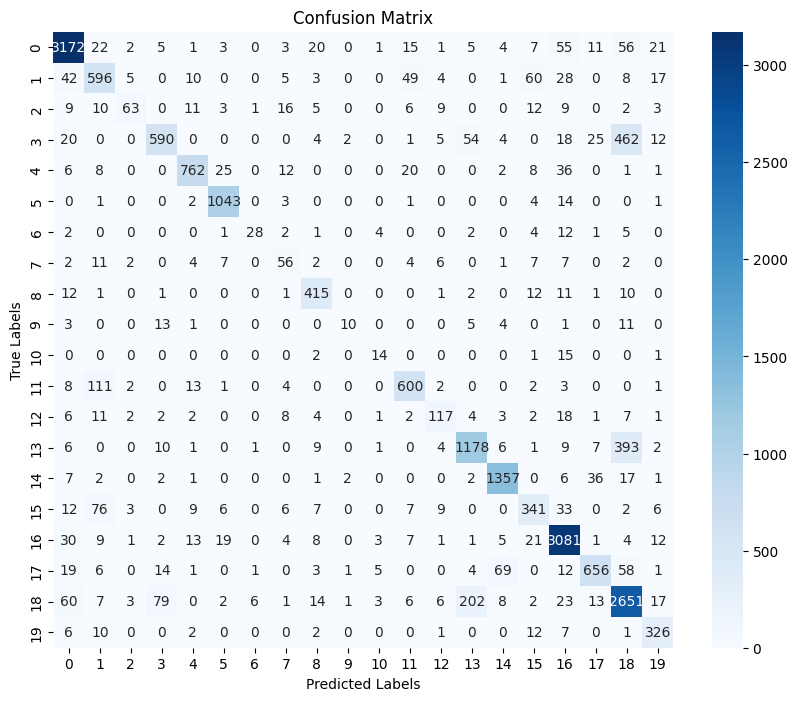

Epoch 20/50, Val Loss: 0.2540, Val Acc: 0.8394
Best model saved, Validation Accuracy: 0.8394
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_20.pth


Epoch 21/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 21/50, Train Loss: 0.2102, Train Acc: 0.8568
Epoch 21/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7226
F1 Score (Weighted): 0.8370
              precision    recall  f1-score   support

           0       0.92      0.95      0.93      3404
           1       0.83      0.50      0.63       828
           2       0.64      0.52      0.57       159
           3       0.69      0.72      0.70      1197
           4       0.73      0.94      0.83       881
           5       0.94      0.96      0.95      1069
           6       0.69      0.50      0.58        62
           7       0.70      0.33      0.45       111
           8       0.81      0.91      0.86       467
           9       0.41      0.27      0.33        48
          10       0.41      0.39      0.40        33
          11       0.86      0.81      0.84       747
          12       0.57      0.65      0.61       191
          13       0.80      0.74      0.77      1628
          14       0.95      0.92      0.94      1434
          15       0.64      0.68      0.66       517
          16       0.92     

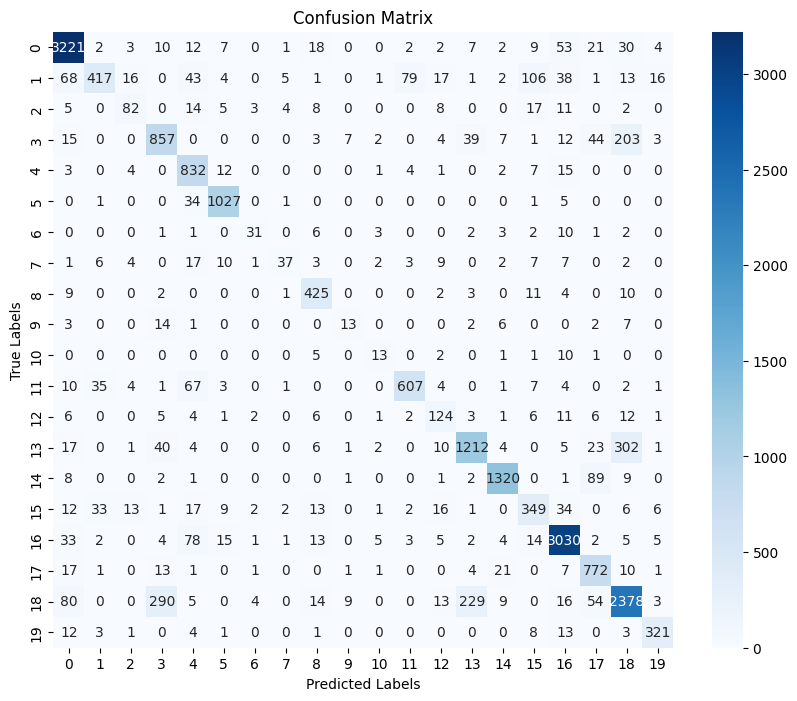

Epoch 21/50, Val Loss: 0.2501, Val Acc: 0.8400
Best model saved, Validation Accuracy: 0.8400
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_21.pth


Epoch 22/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 22/50, Train Loss: 0.1968, Train Acc: 0.8637
Epoch 22/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7211
F1 Score (Weighted): 0.8419
              precision    recall  f1-score   support

           0       0.93      0.94      0.93      3404
           1       0.72      0.68      0.70       828
           2       0.64      0.47      0.54       159
           3       0.79      0.57      0.66      1197
           4       0.87      0.88      0.88       881
           5       0.96      0.96      0.96      1069
           6       0.65      0.39      0.48        62
           7       0.74      0.36      0.48       111
           8       0.73      0.90      0.80       467
           9       0.88      0.15      0.25        48
          10       0.32      0.70      0.44        33
          11       0.81      0.84      0.83       747
          12       0.70      0.62      0.66       191
          13       0.80      0.73      0.76      1628
          14       0.94      0.94      0.94      1434
          15       0.64      0.72      0.68       517
          16       0.94     

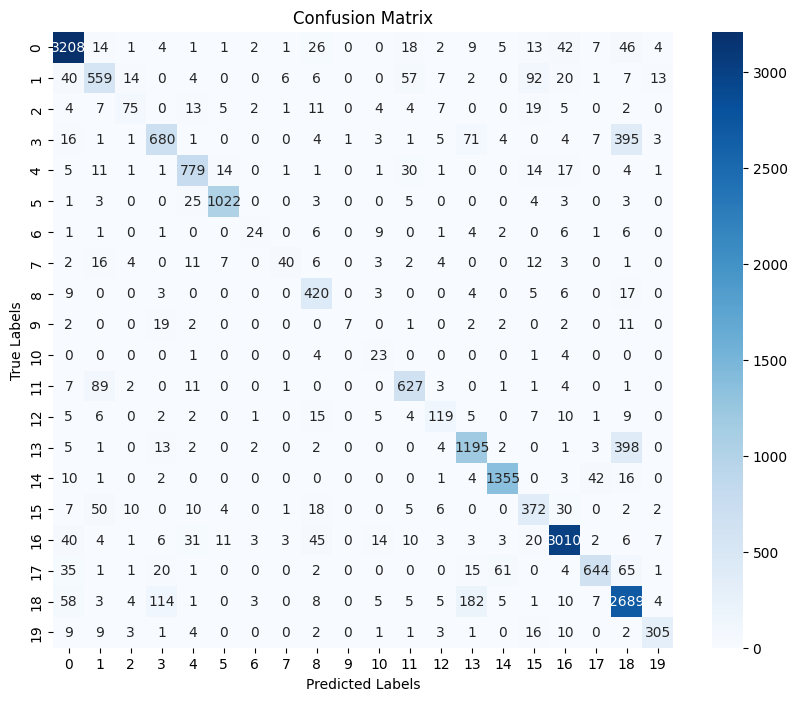

Epoch 22/50, Val Loss: 0.2407, Val Acc: 0.8442
Best model saved, Validation Accuracy: 0.8442
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_22.pth


Epoch 23/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 23/50, Train Loss: 0.1850, Train Acc: 0.8694
Epoch 23/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7470
F1 Score (Weighted): 0.8484
              precision    recall  f1-score   support

           0       0.92      0.95      0.93      3404
           1       0.69      0.70      0.70       828
           2       0.73      0.41      0.52       159
           3       0.64      0.79      0.71      1197
           4       0.90      0.89      0.89       881
           5       0.95      0.97      0.96      1069
           6       0.73      0.60      0.65        62
           7       0.49      0.50      0.50       111
           8       0.85      0.87      0.86       467
           9       0.92      0.23      0.37        48
          10       0.56      0.55      0.55        33
          11       0.91      0.72      0.81       747
          12       0.88      0.50      0.64       191
          13       0.83      0.73      0.77      1628
          14       0.95      0.95      0.95      1434
          15       0.58      0.79      0.67       517
          16       0.94     

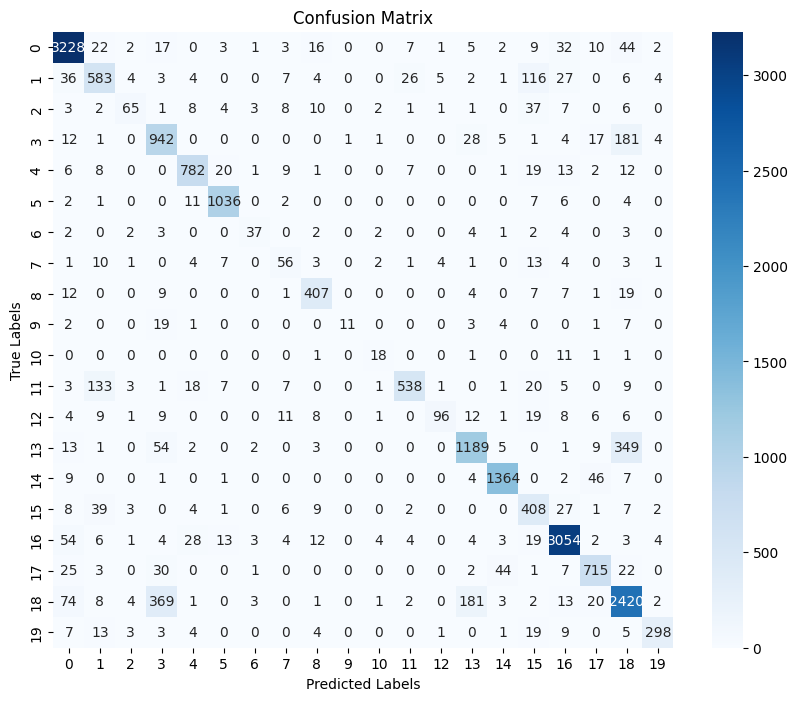

Epoch 23/50, Val Loss: 0.2365, Val Acc: 0.8488
Best model saved, Validation Accuracy: 0.8488
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_23.pth


Epoch 24/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 24/50, Train Loss: 0.1764, Train Acc: 0.8739
Epoch 24/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7338
F1 Score (Weighted): 0.8521
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      3404
           1       0.70      0.77      0.73       828
           2       0.83      0.45      0.58       159
           3       0.70      0.73      0.71      1197
           4       0.79      0.93      0.85       881
           5       0.92      0.99      0.95      1069
           6       0.75      0.48      0.59        62
           7       0.76      0.33      0.46       111
           8       0.79      0.83      0.81       467
           9       0.50      0.31      0.38        48
          10       0.64      0.21      0.32        33
          11       0.91      0.73      0.81       747
          12       0.86      0.49      0.63       191
          13       0.80      0.78      0.79      1628
          14       0.92      0.95      0.94      1434
          15       0.68      0.69      0.69       517
          16       0.95     

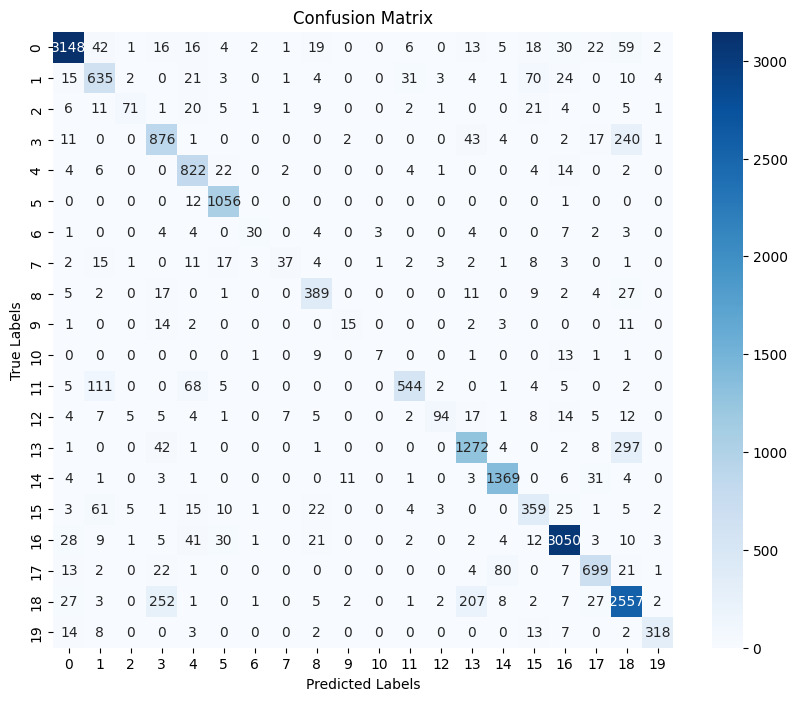

Epoch 24/50, Val Loss: 0.2310, Val Acc: 0.8538
Best model saved, Validation Accuracy: 0.8538
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_24.pth


Epoch 25/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 25/50, Train Loss: 0.1618, Train Acc: 0.8842
Epoch 25/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7561
F1 Score (Weighted): 0.8567
              precision    recall  f1-score   support

           0       0.93      0.96      0.94      3404
           1       0.65      0.82      0.72       828
           2       0.65      0.52      0.58       159
           3       0.78      0.63      0.70      1197
           4       0.94      0.88      0.91       881
           5       0.98      0.95      0.97      1069
           6       0.66      0.63      0.64        62
           7       0.53      0.48      0.50       111
           8       0.90      0.86      0.88       467
           9       0.82      0.19      0.31        48
          10       0.47      0.55      0.51        33
          11       0.87      0.80      0.83       747
          12       0.79      0.69      0.74       191
          13       0.66      0.93      0.77      1628
          14       0.97      0.94      0.95      1434
          15       0.80      0.59      0.68       517
          16       0.94     

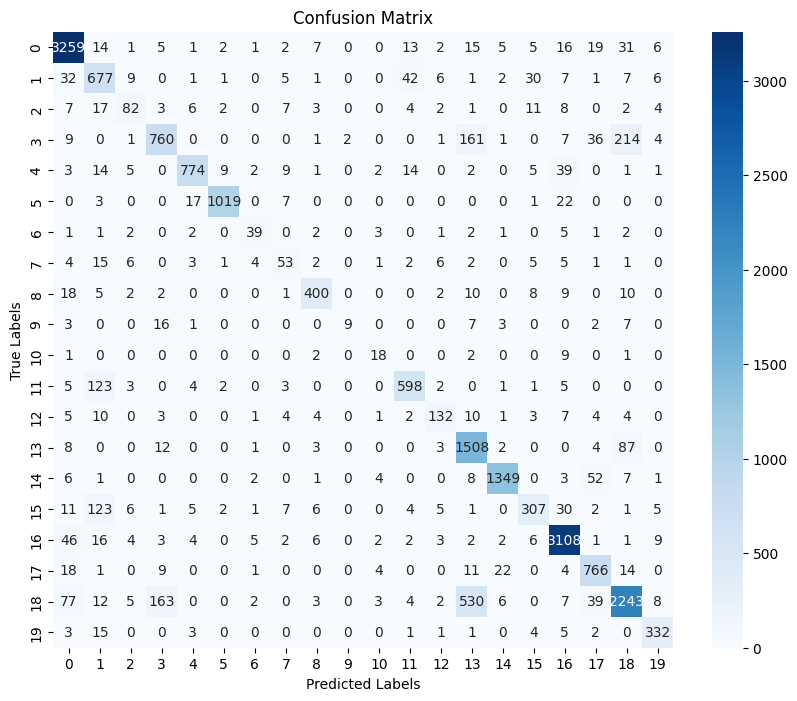

Epoch 25/50, Val Loss: 0.2101, Val Acc: 0.8580
Best model saved, Validation Accuracy: 0.8580
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_25.pth


Epoch 26/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 26/50, Train Loss: 0.1509, Train Acc: 0.8892
Epoch 26/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7675
F1 Score (Weighted): 0.8629
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3404
           1       0.71      0.71      0.71       828
           2       0.82      0.47      0.60       159
           3       0.73      0.72      0.73      1197
           4       0.85      0.94      0.89       881
           5       0.96      0.97      0.97      1069
           6       0.66      0.65      0.65        62
           7       0.77      0.45      0.57       111
           8       0.92      0.85      0.88       467
           9       0.67      0.33      0.44        48
          10       0.52      0.45      0.48        33
          11       0.86      0.87      0.87       747
          12       0.70      0.70      0.70       191
          13       0.78      0.84      0.81      1628
          14       0.97      0.94      0.95      1434
          15       0.61      0.75      0.67       517
          16       0.95     

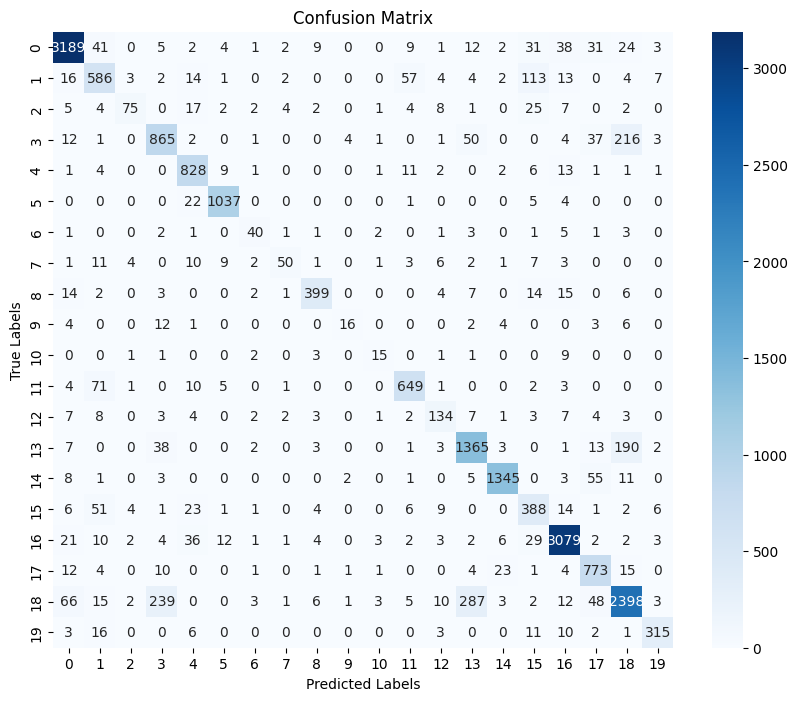

Epoch 26/50, Val Loss: 0.2142, Val Acc: 0.8635
Best model saved, Validation Accuracy: 0.8635
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_26.pth


Epoch 27/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 27/50, Train Loss: 0.1401, Train Acc: 0.8948
Epoch 27/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7573
F1 Score (Weighted): 0.8620
              precision    recall  f1-score   support

           0       0.97      0.90      0.93      3404
           1       0.69      0.72      0.71       828
           2       0.71      0.50      0.58       159
           3       0.68      0.77      0.72      1197
           4       0.94      0.86      0.90       881
           5       0.97      0.97      0.97      1069
           6       0.66      0.56      0.61        62
           7       0.54      0.59      0.56       111
           8       0.90      0.88      0.89       467
           9       0.88      0.15      0.25        48
          10       0.54      0.58      0.56        33
          11       0.87      0.83      0.85       747
          12       0.71      0.65      0.68       191
          13       0.78      0.86      0.82      1628
          14       0.97      0.93      0.95      1434
          15       0.63      0.76      0.69       517
          16       0.96     

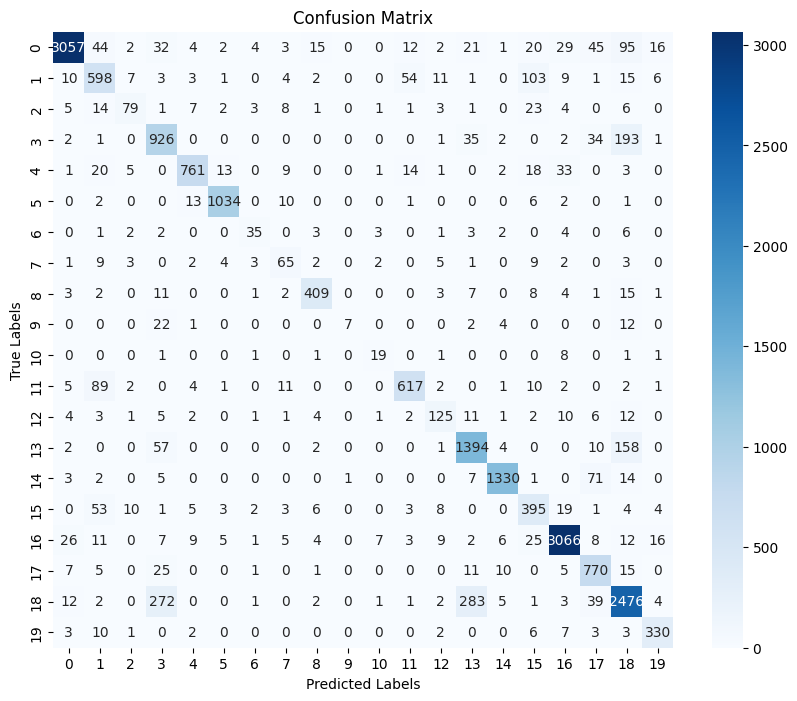

Epoch 27/50, Val Loss: 0.2181, Val Acc: 0.8609
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_27.pth


Epoch 28/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 28/50, Train Loss: 0.1319, Train Acc: 0.9002
Epoch 28/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7621
F1 Score (Weighted): 0.8659
              precision    recall  f1-score   support

           0       0.94      0.95      0.95      3404
           1       0.69      0.79      0.73       828
           2       0.81      0.42      0.55       159
           3       0.78      0.65      0.71      1197
           4       0.93      0.92      0.92       881
           5       0.96      0.99      0.97      1069
           6       0.64      0.55      0.59        62
           7       0.70      0.45      0.55       111
           8       0.90      0.89      0.90       467
           9       0.92      0.25      0.39        48
          10       0.62      0.39      0.48        33
          11       0.91      0.79      0.84       747
          12       0.80      0.62      0.70       191
          13       0.72      0.89      0.80      1628
          14       0.96      0.94      0.95      1434
          15       0.63      0.75      0.68       517
          16       0.95     

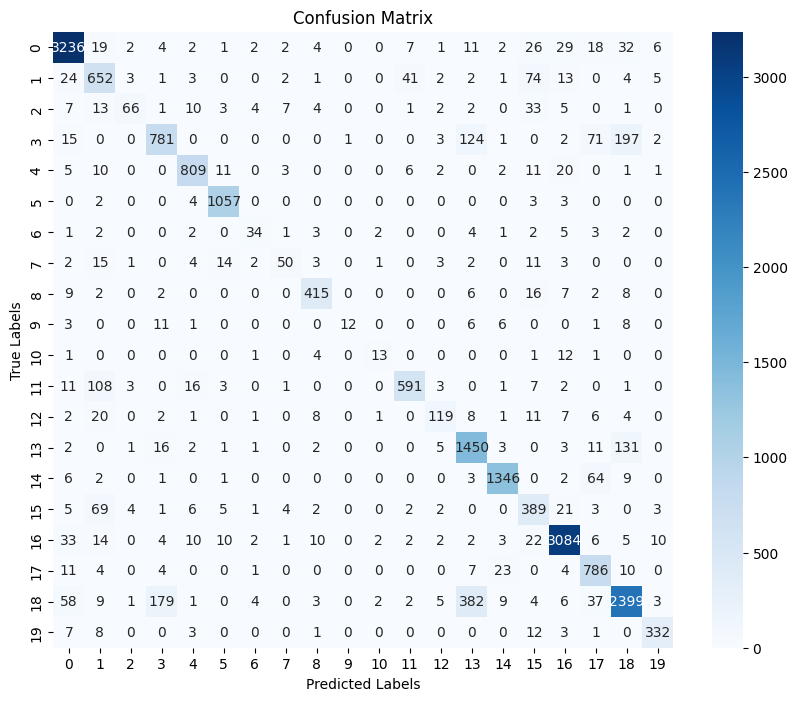

Epoch 28/50, Val Loss: 0.2047, Val Acc: 0.8672
Best model saved, Validation Accuracy: 0.8672
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_28.pth


Epoch 29/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 29/50, Train Loss: 0.1238, Train Acc: 0.9040
Epoch 29/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7691
F1 Score (Weighted): 0.8676
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      3404
           1       0.76      0.66      0.71       828
           2       0.66      0.56      0.61       159
           3       0.70      0.77      0.73      1197
           4       0.89      0.92      0.90       881
           5       0.94      0.98      0.96      1069
           6       0.83      0.48      0.61        62
           7       0.72      0.43      0.54       111
           8       0.94      0.86      0.90       467
           9       0.78      0.29      0.42        48
          10       0.52      0.45      0.48        33
          11       0.90      0.81      0.85       747
          12       0.83      0.65      0.73       191
          13       0.76      0.90      0.83      1628
          14       0.96      0.94      0.95      1434
          15       0.64      0.74      0.69       517
          16       0.94     

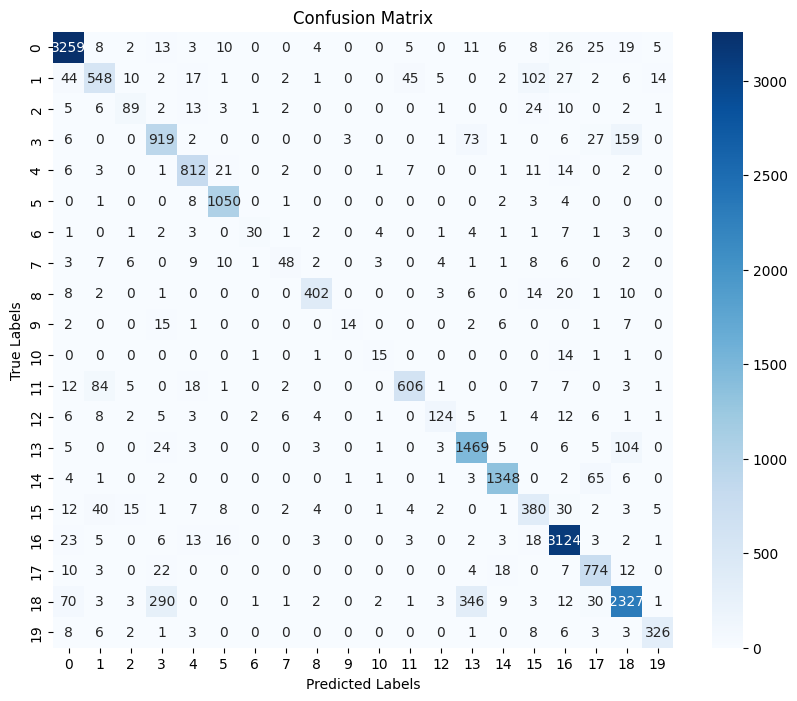

Epoch 29/50, Val Loss: 0.2047, Val Acc: 0.8693
Best model saved, Validation Accuracy: 0.8693
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_29.pth


Epoch 30/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 30/50, Train Loss: 0.1137, Train Acc: 0.9095
Epoch 30/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7893
F1 Score (Weighted): 0.8791
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3404
           1       0.75      0.76      0.76       828
           2       0.48      0.70      0.57       159
           3       0.71      0.77      0.74      1197
           4       0.91      0.95      0.93       881
           5       0.98      0.98      0.98      1069
           6       0.69      0.79      0.74        62
           7       0.64      0.62      0.63       111
           8       0.91      0.91      0.91       467
           9       0.79      0.46      0.58        48
          10       0.73      0.24      0.36        33
          11       0.90      0.83      0.86       747
          12       0.84      0.69      0.76       191
          13       0.78      0.89      0.83      1628
          14       0.93      0.97      0.95      1434
          15       0.73      0.69      0.71       517
          16       0.96     

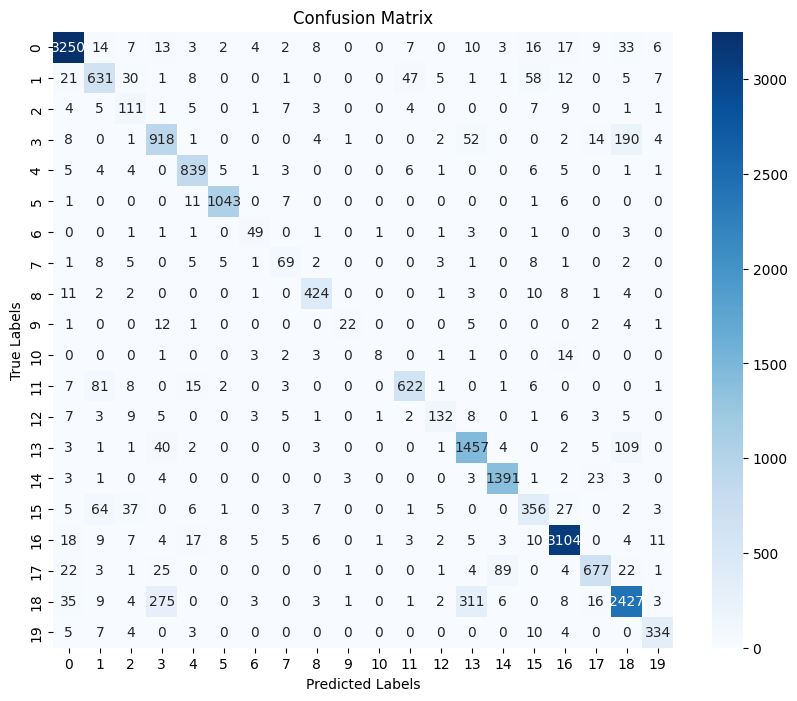

Epoch 30/50, Val Loss: 0.1844, Val Acc: 0.8792
Best model saved, Validation Accuracy: 0.8792
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_30.pth


Epoch 31/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 31/50, Train Loss: 0.1053, Train Acc: 0.9148
Epoch 31/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7890
F1 Score (Weighted): 0.8832
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      3404
           1       0.68      0.82      0.74       828
           2       0.83      0.49      0.62       159
           3       0.73      0.78      0.75      1197
           4       0.95      0.91      0.93       881
           5       0.96      0.99      0.97      1069
           6       0.78      0.61      0.68        62
           7       0.66      0.55      0.60       111
           8       0.92      0.89      0.91       467
           9       0.88      0.31      0.46        48
          10       0.65      0.39      0.49        33
          11       0.91      0.80      0.85       747
          12       0.84      0.62      0.71       191
          13       0.83      0.86      0.84      1628
          14       0.98      0.93      0.96      1434
          15       0.73      0.68      0.71       517
          16       0.95     

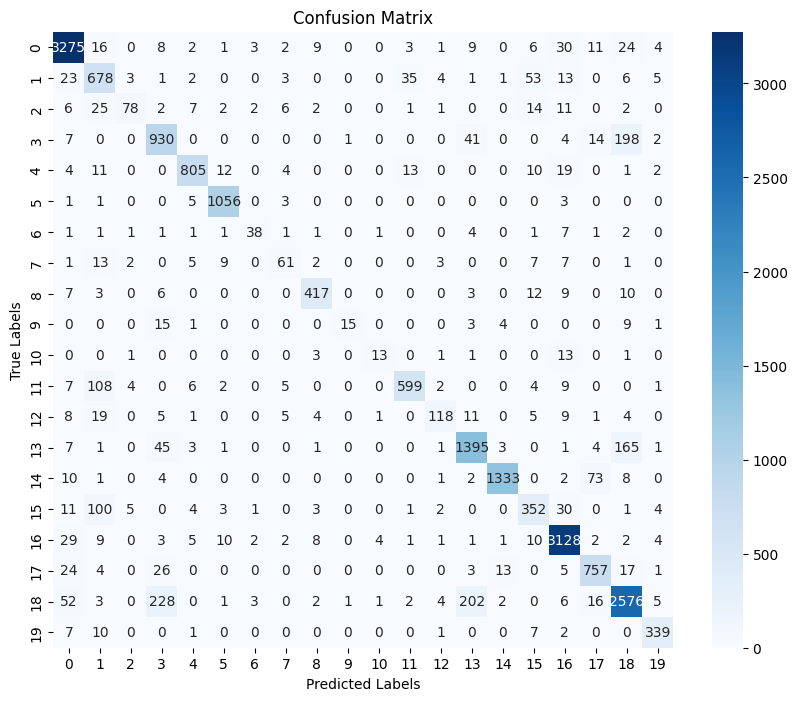

Epoch 31/50, Val Loss: 0.1810, Val Acc: 0.8840
Best model saved, Validation Accuracy: 0.8840
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_31.pth


Epoch 32/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 32/50, Train Loss: 0.0925, Train Acc: 0.9224
Epoch 32/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8227
F1 Score (Weighted): 0.8909
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      3404
           1       0.75      0.76      0.75       828
           2       0.69      0.68      0.68       159
           3       0.73      0.80      0.76      1197
           4       0.92      0.92      0.92       881
           5       0.98      0.98      0.98      1069
           6       0.95      0.65      0.77        62
           7       0.65      0.59      0.62       111
           8       0.90      0.92      0.91       467
           9       0.83      0.52      0.64        48
          10       0.62      0.79      0.69        33
          11       0.89      0.86      0.87       747
          12       0.85      0.71      0.77       191
          13       0.86      0.85      0.85      1628
          14       0.96      0.97      0.97      1434
          15       0.70      0.73      0.72       517
          16       0.96     

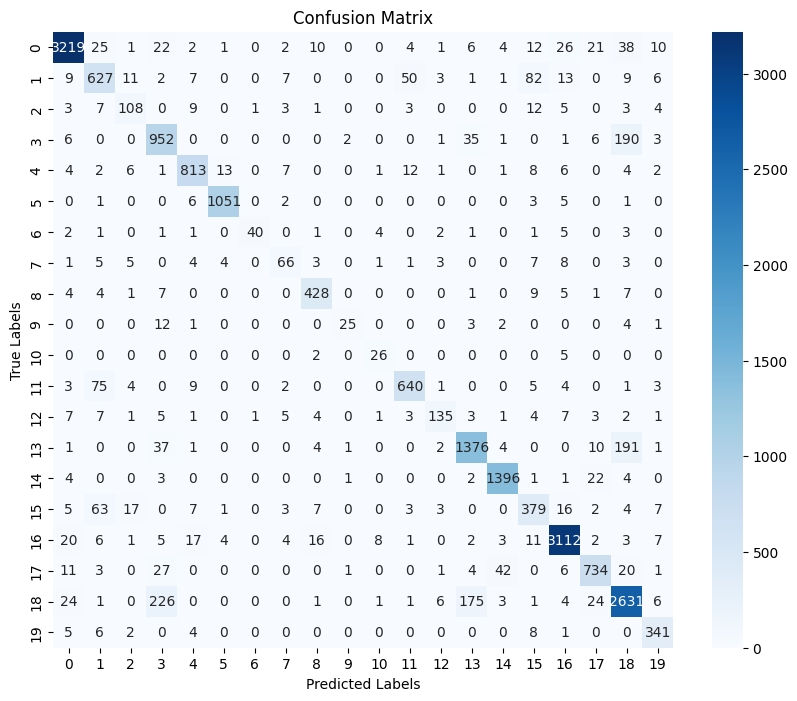

Epoch 32/50, Val Loss: 0.1721, Val Acc: 0.8907
Best model saved, Validation Accuracy: 0.8907
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_32.pth


Epoch 33/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 33/50, Train Loss: 0.0853, Train Acc: 0.9267
Epoch 33/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7994
F1 Score (Weighted): 0.8884
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      3404
           1       0.80      0.73      0.76       828
           2       0.70      0.60      0.65       159
           3       0.78      0.72      0.75      1197
           4       0.93      0.93      0.93       881
           5       0.96      0.99      0.98      1069
           6       0.67      0.73      0.70        62
           7       0.71      0.56      0.63       111
           8       0.92      0.90      0.91       467
           9       0.77      0.35      0.49        48
          10       0.48      0.45      0.47        33
          11       0.88      0.88      0.88       747
          12       0.72      0.79      0.76       191
          13       0.82      0.87      0.85      1628
          14       0.98      0.94      0.96      1434
          15       0.72      0.73      0.73       517
          16       0.96     

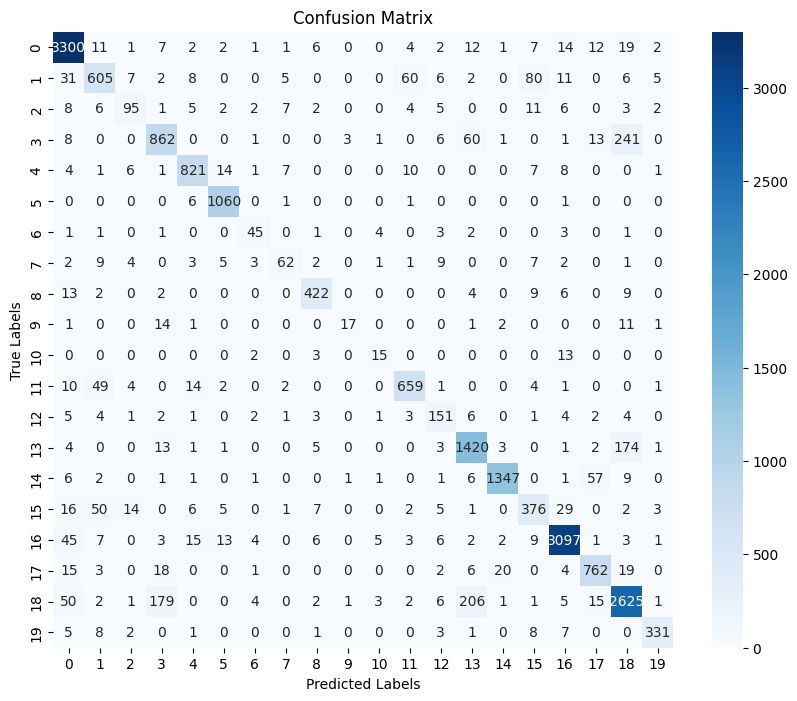

Epoch 33/50, Val Loss: 0.1801, Val Acc: 0.8894
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_33.pth


Epoch 34/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 34/50, Train Loss: 0.0786, Train Acc: 0.9316
Epoch 34/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.7945
F1 Score (Weighted): 0.8860
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      3404
           1       0.71      0.81      0.75       828
           2       0.72      0.61      0.66       159
           3       0.77      0.71      0.73      1197
           4       0.92      0.95      0.93       881
           5       0.96      0.99      0.98      1069
           6       0.80      0.60      0.69        62
           7       0.71      0.50      0.59       111
           8       0.93      0.88      0.90       467
           9       0.94      0.31      0.47        48
          10       0.56      0.42      0.48        33
          11       0.89      0.87      0.88       747
          12       0.80      0.71      0.75       191
          13       0.89      0.78      0.83      1628
          14       0.97      0.95      0.96      1434
          15       0.68      0.77      0.72       517
          16       0.96     

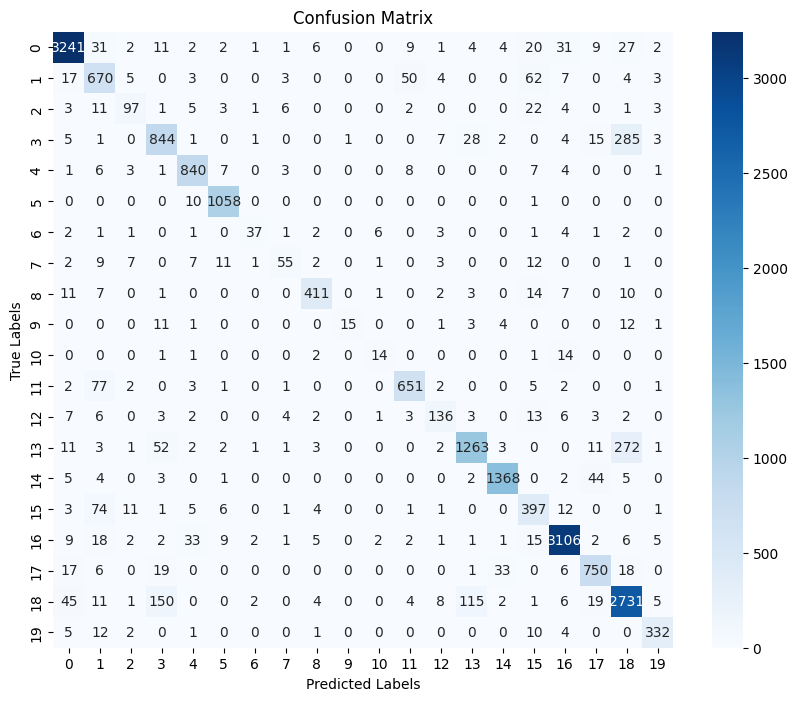

Epoch 34/50, Val Loss: 0.1815, Val Acc: 0.8867
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_34.pth


Epoch 35/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 35/50, Train Loss: 0.0712, Train Acc: 0.9366
Epoch 35/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8048
F1 Score (Weighted): 0.8912
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3404
           1       0.80      0.72      0.76       828
           2       0.71      0.65      0.68       159
           3       0.73      0.78      0.76      1197
           4       0.94      0.94      0.94       881
           5       0.98      0.98      0.98      1069
           6       0.73      0.73      0.73        62
           7       0.68      0.54      0.60       111
           8       0.87      0.94      0.90       467
           9       0.94      0.33      0.49        48
          10       0.75      0.36      0.49        33
          11       0.88      0.89      0.89       747
          12       0.90      0.68      0.77       191
          13       0.80      0.88      0.84      1628
          14       0.96      0.96      0.96      1434
          15       0.70      0.76      0.73       517
          16       0.96     

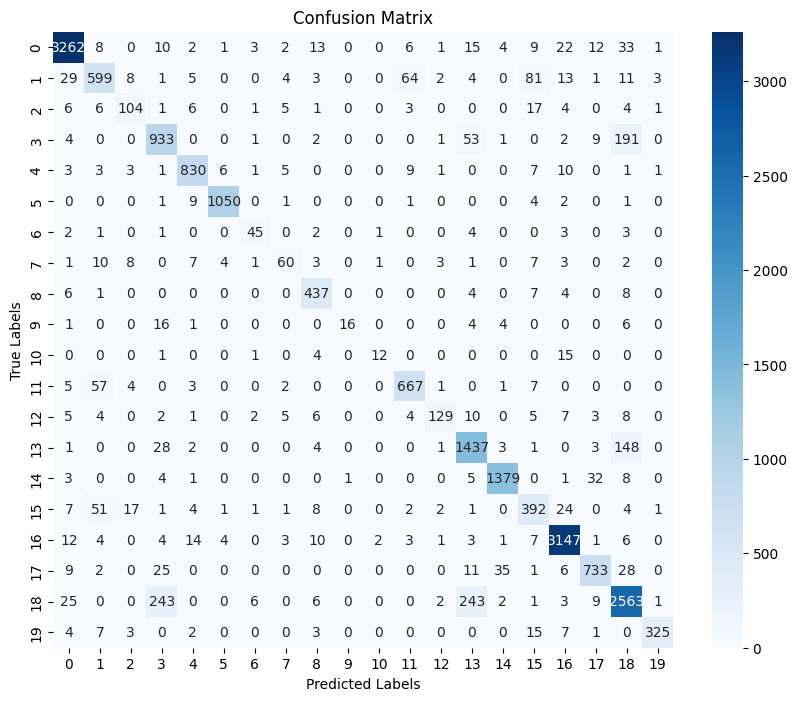

Epoch 35/50, Val Loss: 0.1723, Val Acc: 0.8918
Best model saved, Validation Accuracy: 0.8918
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_35.pth


Epoch 36/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 36/50, Train Loss: 0.0655, Train Acc: 0.9401
Epoch 36/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8132
F1 Score (Weighted): 0.8944
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3404
           1       0.77      0.69      0.73       828
           2       0.64      0.62      0.63       159
           3       0.75      0.78      0.77      1197
           4       0.95      0.93      0.94       881
           5       0.99      0.98      0.99      1069
           6       0.72      0.71      0.72        62
           7       0.56      0.59      0.58       111
           8       0.92      0.93      0.92       467
           9       0.95      0.38      0.54        48
          10       0.70      0.64      0.67        33
          11       0.89      0.87      0.88       747
          12       0.85      0.73      0.79       191
          13       0.85      0.85      0.85      1628
          14       0.99      0.94      0.96      1434
          15       0.62      0.81      0.70       517
          16       0.97     

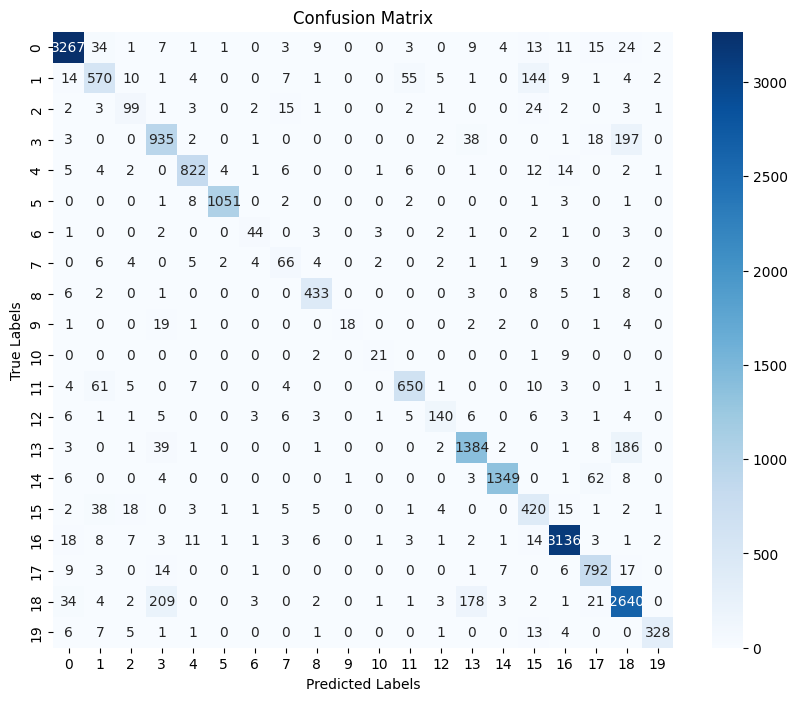

Epoch 36/50, Val Loss: 0.1711, Val Acc: 0.8940
Best model saved, Validation Accuracy: 0.8940
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_36.pth


Epoch 37/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 37/50, Train Loss: 0.0584, Train Acc: 0.9456
Epoch 37/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8140
F1 Score (Weighted): 0.8964
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3404
           1       0.79      0.75      0.77       828
           2       0.67      0.65      0.66       159
           3       0.76      0.79      0.77      1197
           4       0.94      0.95      0.94       881
           5       0.99      0.97      0.98      1069
           6       0.82      0.74      0.78        62
           7       0.73      0.54      0.62       111
           8       0.91      0.93      0.92       467
           9       0.83      0.42      0.56        48
          10       0.59      0.39      0.47        33
          11       0.88      0.89      0.89       747
          12       0.89      0.66      0.76       191
          13       0.83      0.89      0.86      1628
          14       0.99      0.94      0.96      1434
          15       0.70      0.76      0.73       517
          16       0.96     

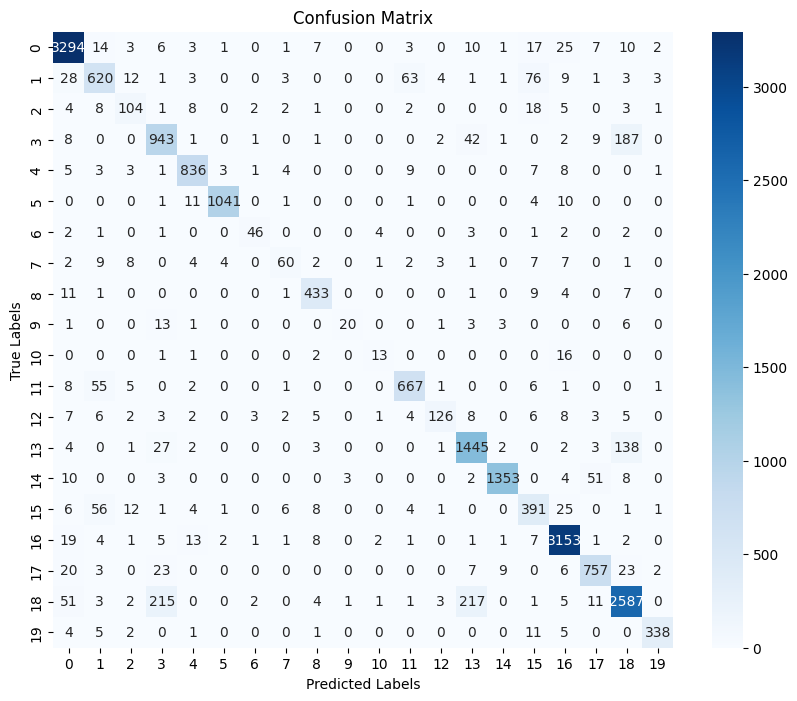

Epoch 37/50, Val Loss: 0.1664, Val Acc: 0.8970
Best model saved, Validation Accuracy: 0.8970
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_37.pth


Epoch 38/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 38/50, Train Loss: 0.0514, Train Acc: 0.9504
Epoch 38/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8213
F1 Score (Weighted): 0.8979
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3404
           1       0.79      0.75      0.77       828
           2       0.76      0.58      0.66       159
           3       0.80      0.75      0.77      1197
           4       0.97      0.89      0.93       881
           5       0.97      0.99      0.98      1069
           6       0.79      0.73      0.76        62
           7       0.65      0.56      0.60       111
           8       0.92      0.92      0.92       467
           9       0.91      0.44      0.59        48
          10       0.76      0.48      0.59        33
          11       0.89      0.87      0.88       747
          12       0.82      0.76      0.79       191
          13       0.80      0.91      0.85      1628
          14       0.97      0.96      0.97      1434
          15       0.73      0.76      0.74       517
          16       0.96     

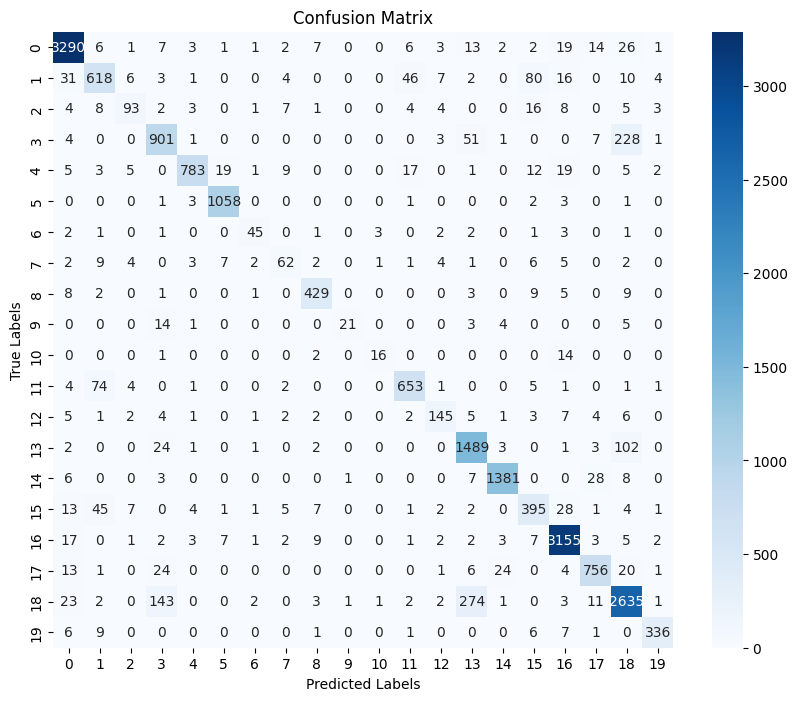

Epoch 38/50, Val Loss: 0.1739, Val Acc: 0.8987
Best model saved, Validation Accuracy: 0.8987
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_38.pth


Epoch 39/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 39/50, Train Loss: 0.0478, Train Acc: 0.9535
Epoch 39/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8288
F1 Score (Weighted): 0.8995
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3404
           1       0.75      0.80      0.77       828
           2       0.77      0.58      0.66       159
           3       0.77      0.78      0.77      1197
           4       0.95      0.92      0.94       881
           5       0.99      0.98      0.98      1069
           6       0.86      0.71      0.78        62
           7       0.73      0.58      0.64       111
           8       0.91      0.92      0.91       467
           9       0.89      0.52      0.66        48
          10       0.77      0.52      0.62        33
          11       0.91      0.85      0.88       747
          12       0.83      0.72      0.77       191
          13       0.84      0.88      0.86      1628
          14       0.97      0.97      0.97      1434
          15       0.71      0.75      0.73       517
          16       0.96     

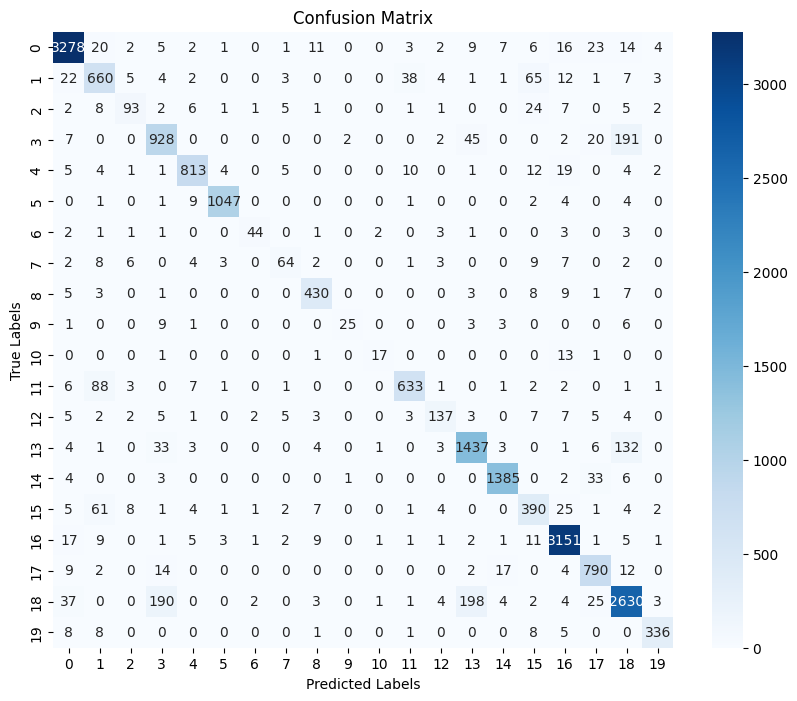

Epoch 39/50, Val Loss: 0.1678, Val Acc: 0.9000
Best model saved, Validation Accuracy: 0.9000
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_39.pth


Epoch 40/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 40/50, Train Loss: 0.0439, Train Acc: 0.9559
Epoch 40/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8315
F1 Score (Weighted): 0.8989
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3404
           1       0.74      0.79      0.77       828
           2       0.68      0.64      0.66       159
           3       0.76      0.79      0.77      1197
           4       0.95      0.95      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.83      0.73      0.78        62
           7       0.70      0.56      0.62       111
           8       0.93      0.92      0.93       467
           9       0.87      0.54      0.67        48
          10       0.79      0.58      0.67        33
          11       0.91      0.87      0.89       747
          12       0.85      0.74      0.79       191
          13       0.81      0.91      0.85      1628
          14       0.97      0.96      0.97      1434
          15       0.72      0.74      0.73       517
          16       0.96     

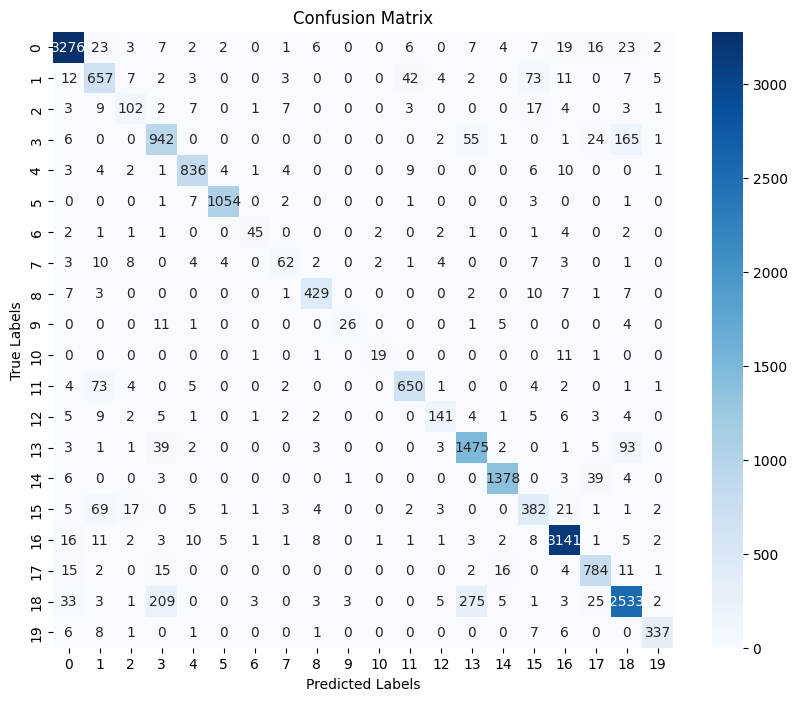

Epoch 40/50, Val Loss: 0.1682, Val Acc: 0.8991
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_40.pth


Epoch 41/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 41/50, Train Loss: 0.0411, Train Acc: 0.9594
Epoch 41/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8348
F1 Score (Weighted): 0.9037
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3404
           1       0.79      0.75      0.77       828
           2       0.75      0.61      0.67       159
           3       0.80      0.77      0.79      1197
           4       0.95      0.94      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.88      0.71      0.79        62
           7       0.70      0.57      0.63       111
           8       0.91      0.93      0.92       467
           9       0.90      0.54      0.68        48
          10       0.71      0.61      0.66        33
          11       0.86      0.91      0.88       747
          12       0.84      0.73      0.78       191
          13       0.83      0.90      0.86      1628
          14       0.97      0.96      0.96      1434
          15       0.75      0.73      0.74       517
          16       0.96     

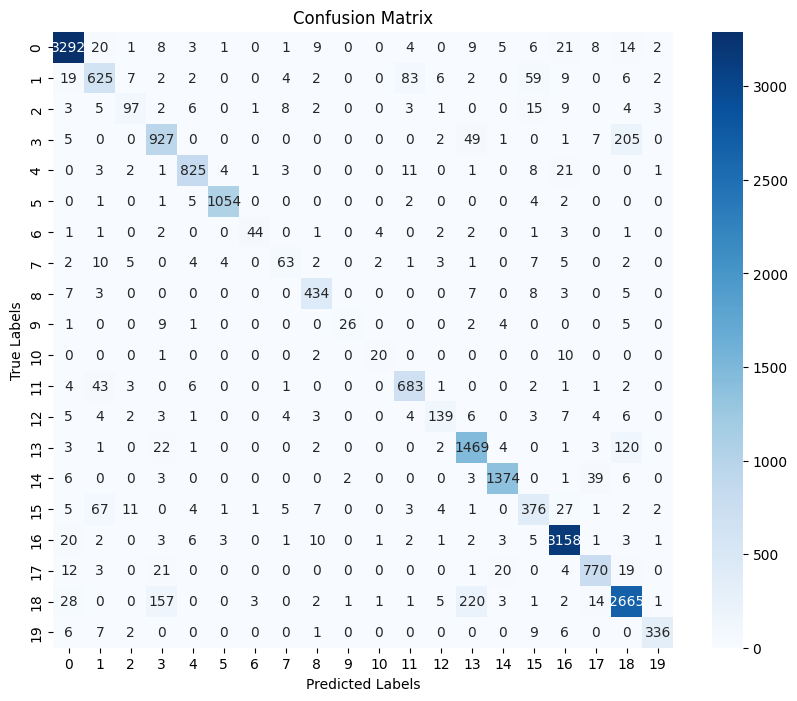

Epoch 41/50, Val Loss: 0.1660, Val Acc: 0.9044
Best model saved, Validation Accuracy: 0.9044
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_41.pth


Epoch 42/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 42/50, Train Loss: 0.0369, Train Acc: 0.9634
Epoch 42/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8300
F1 Score (Weighted): 0.9040
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3404
           1       0.76      0.81      0.78       828
           2       0.71      0.62      0.66       159
           3       0.78      0.79      0.78      1197
           4       0.95      0.95      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.88      0.74      0.81        62
           7       0.68      0.59      0.63       111
           8       0.92      0.93      0.92       467
           9       0.89      0.50      0.64        48
          10       0.71      0.45      0.56        33
          11       0.90      0.89      0.90       747
          12       0.82      0.73      0.77       191
          13       0.83      0.89      0.86      1628
          14       0.97      0.96      0.97      1434
          15       0.74      0.73      0.74       517
          16       0.96     

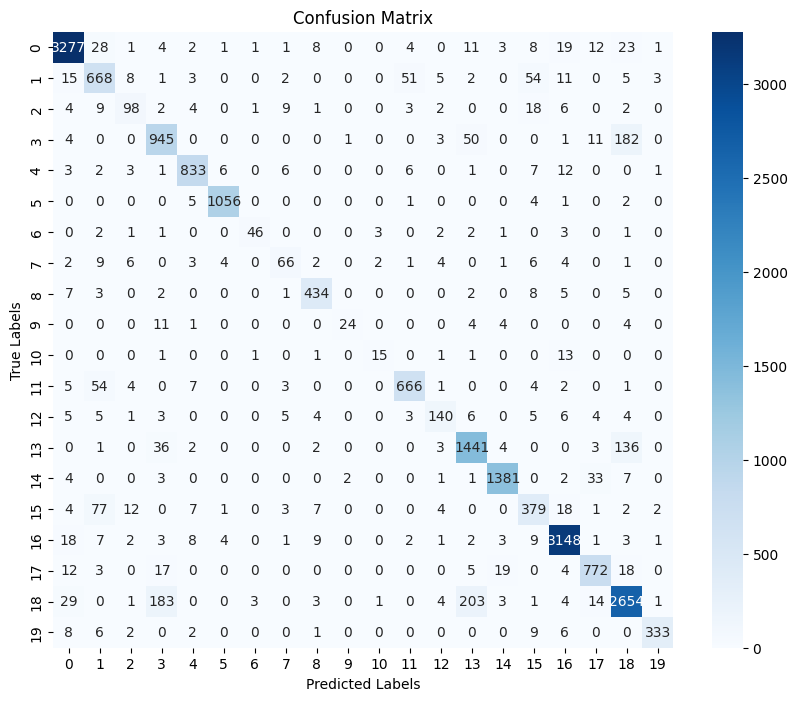

Epoch 42/50, Val Loss: 0.1648, Val Acc: 0.9044
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_42.pth


Epoch 43/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 43/50, Train Loss: 0.0341, Train Acc: 0.9647
Epoch 43/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8274
F1 Score (Weighted): 0.9035
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3404
           1       0.80      0.76      0.78       828
           2       0.74      0.60      0.66       159
           3       0.81      0.76      0.78      1197
           4       0.95      0.95      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.90      0.71      0.79        62
           7       0.66      0.57      0.61       111
           8       0.94      0.92      0.93       467
           9       0.92      0.46      0.61        48
          10       0.78      0.42      0.55        33
          11       0.89      0.88      0.89       747
          12       0.82      0.76      0.79       191
          13       0.82      0.91      0.86      1628
          14       0.98      0.96      0.97      1434
          15       0.73      0.76      0.75       517
          16       0.96     

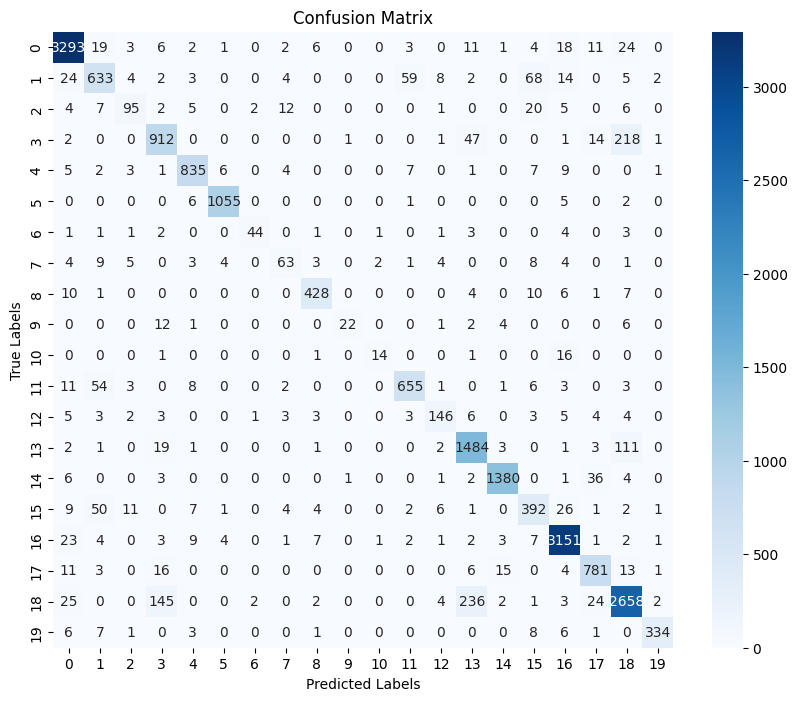

Epoch 43/50, Val Loss: 0.1695, Val Acc: 0.9043
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_43.pth


Epoch 44/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 44/50, Train Loss: 0.0314, Train Acc: 0.9677
Epoch 44/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8356
F1 Score (Weighted): 0.9059
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3404
           1       0.76      0.80      0.78       828
           2       0.77      0.60      0.68       159
           3       0.78      0.79      0.78      1197
           4       0.95      0.94      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.88      0.73      0.80        62
           7       0.66      0.61      0.64       111
           8       0.93      0.93      0.93       467
           9       0.92      0.48      0.63        48
          10       0.76      0.58      0.66        33
          11       0.90      0.87      0.88       747
          12       0.81      0.74      0.77       191
          13       0.84      0.90      0.87      1628
          14       0.98      0.96      0.97      1434
          15       0.76      0.74      0.75       517
          16       0.96     

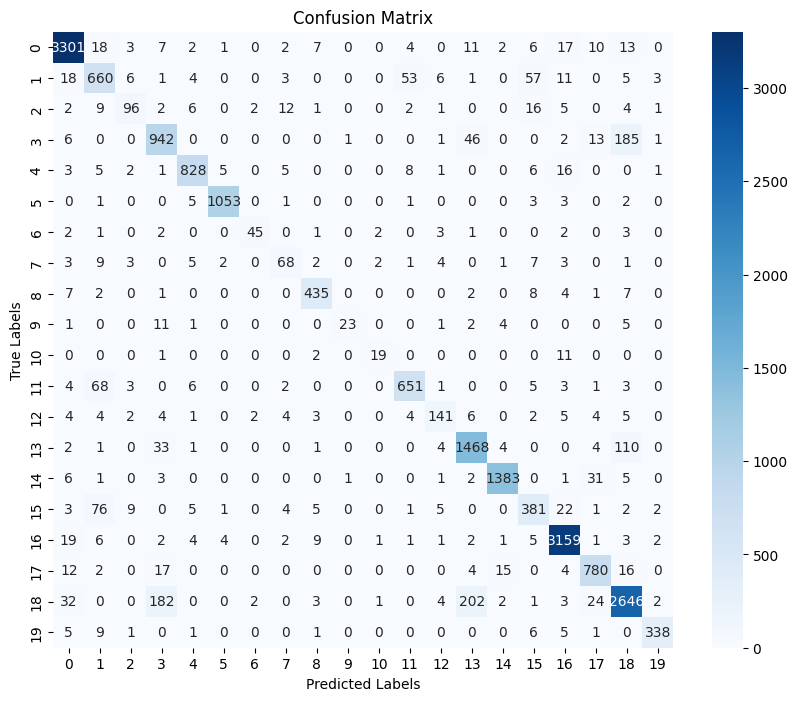

Epoch 44/50, Val Loss: 0.1657, Val Acc: 0.9064
Best model saved, Validation Accuracy: 0.9064
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_44.pth


Epoch 45/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 45/50, Train Loss: 0.0300, Train Acc: 0.9684
Epoch 45/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8312
F1 Score (Weighted): 0.9048
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3404
           1       0.78      0.76      0.77       828
           2       0.72      0.64      0.68       159
           3       0.76      0.80      0.78      1197
           4       0.95      0.94      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.85      0.66      0.75        62
           7       0.70      0.56      0.62       111
           8       0.92      0.93      0.92       467
           9       0.93      0.54      0.68        48
          10       0.71      0.52      0.60        33
          11       0.89      0.88      0.89       747
          12       0.83      0.72      0.77       191
          13       0.85      0.89      0.87      1628
          14       0.98      0.96      0.97      1434
          15       0.74      0.74      0.74       517
          16       0.96     

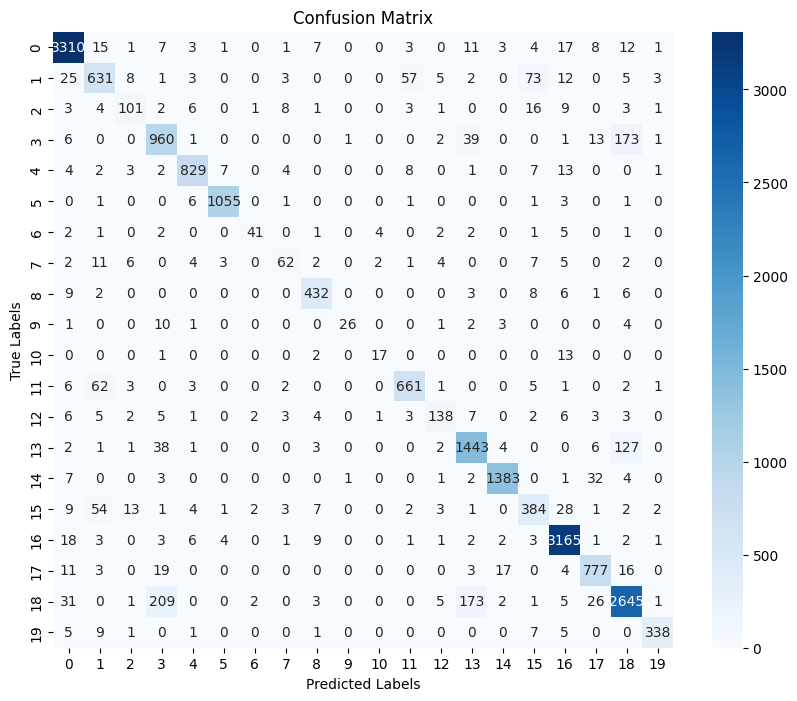

Epoch 45/50, Val Loss: 0.1677, Val Acc: 0.9055
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_45.pth


Epoch 46/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 46/50, Train Loss: 0.0277, Train Acc: 0.9710
Epoch 46/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8365
F1 Score (Weighted): 0.9051
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3404
           1       0.76      0.79      0.78       828
           2       0.75      0.67      0.71       159
           3       0.76      0.80      0.78      1197
           4       0.95      0.95      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.86      0.71      0.78        62
           7       0.71      0.58      0.64       111
           8       0.93      0.93      0.93       467
           9       0.93      0.56      0.70        48
          10       0.63      0.58      0.60        33
          11       0.91      0.86      0.88       747
          12       0.81      0.72      0.76       191
          13       0.87      0.85      0.86      1628
          14       0.98      0.96      0.97      1434
          15       0.74      0.76      0.75       517
          16       0.97     

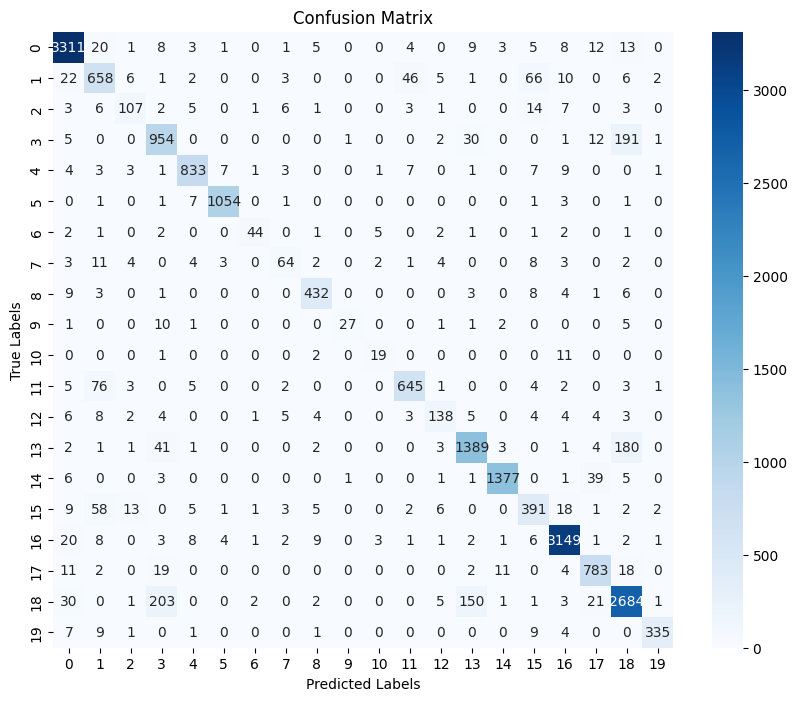

Epoch 46/50, Val Loss: 0.1678, Val Acc: 0.9053
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_46.pth


Epoch 47/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 47/50, Train Loss: 0.0267, Train Acc: 0.9709
Epoch 47/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8373
F1 Score (Weighted): 0.9056
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3404
           1       0.78      0.78      0.78       828
           2       0.74      0.65      0.70       159
           3       0.75      0.80      0.78      1197
           4       0.96      0.94      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.88      0.68      0.76        62
           7       0.71      0.58      0.64       111
           8       0.93      0.92      0.92       467
           9       0.93      0.56      0.70        48
          10       0.73      0.58      0.64        33
          11       0.89      0.89      0.89       747
          12       0.83      0.71      0.76       191
          13       0.86      0.88      0.87      1628
          14       0.98      0.96      0.97      1434
          15       0.73      0.75      0.74       517
          16       0.97     

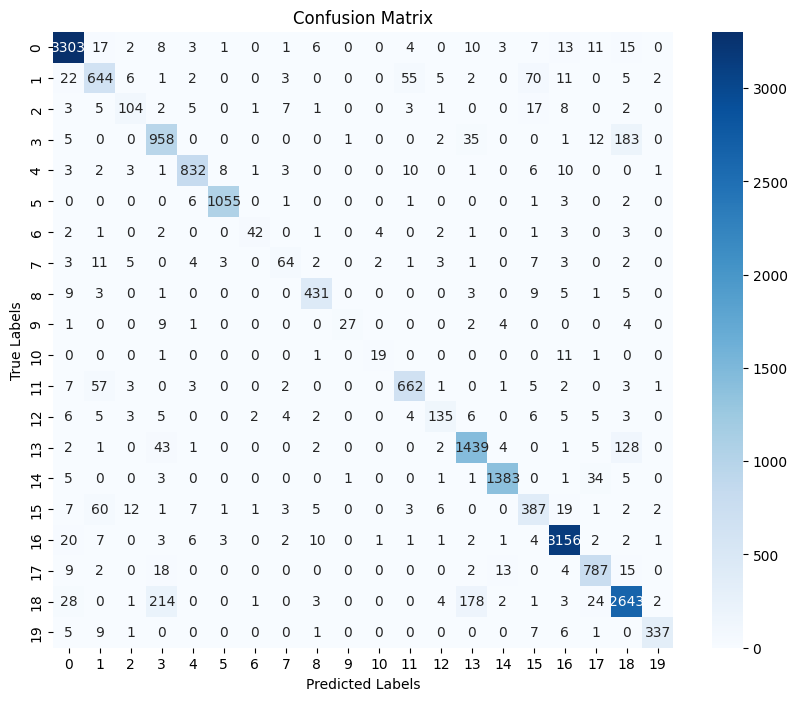

Epoch 47/50, Val Loss: 0.1673, Val Acc: 0.9060
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_47.pth


Epoch 48/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 48/50, Train Loss: 0.0260, Train Acc: 0.9722
Epoch 48/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8394
F1 Score (Weighted): 0.9066
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3404
           1       0.77      0.79      0.78       828
           2       0.74      0.64      0.69       159
           3       0.76      0.80      0.78      1197
           4       0.96      0.95      0.95       881
           5       0.99      0.99      0.99      1069
           6       0.85      0.73      0.78        62
           7       0.71      0.58      0.64       111
           8       0.93      0.93      0.93       467
           9       0.93      0.54      0.68        48
          10       0.71      0.61      0.66        33
          11       0.89      0.88      0.89       747
          12       0.82      0.74      0.78       191
          13       0.86      0.88      0.87      1628
          14       0.98      0.96      0.97      1434
          15       0.76      0.74      0.75       517
          16       0.97     

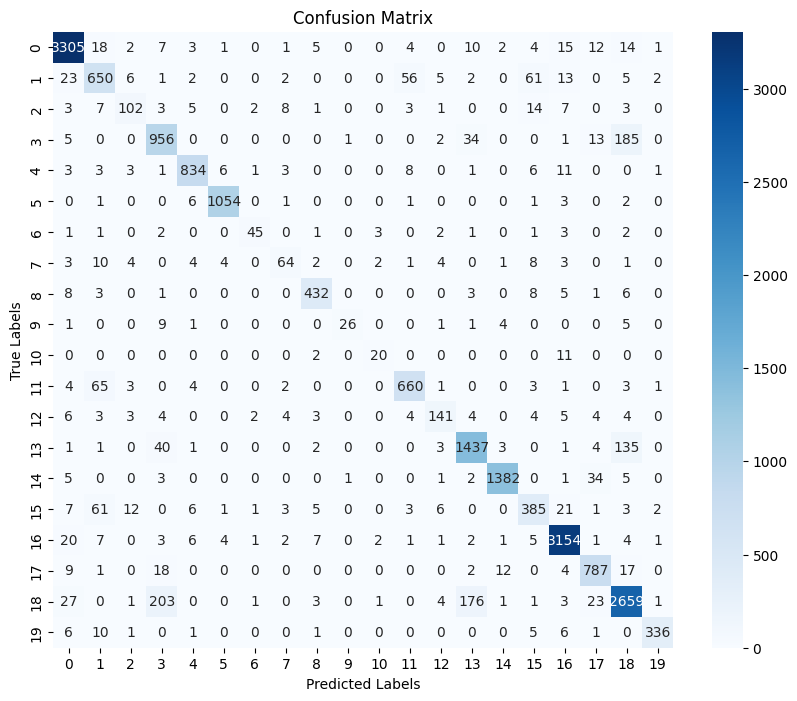

Epoch 48/50, Val Loss: 0.1669, Val Acc: 0.9070
Best model saved, Validation Accuracy: 0.9070
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_48.pth


Epoch 49/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 49/50, Train Loss: 0.0253, Train Acc: 0.9734
Epoch 49/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8370
F1 Score (Weighted): 0.9062
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3404
           1       0.78      0.78      0.78       828
           2       0.74      0.64      0.69       159
           3       0.77      0.79      0.78      1197
           4       0.95      0.95      0.95       881
           5       0.98      0.99      0.99      1069
           6       0.85      0.73      0.78        62
           7       0.70      0.56      0.62       111
           8       0.93      0.92      0.93       467
           9       0.93      0.54      0.68        48
          10       0.67      0.61      0.63        33
          11       0.90      0.88      0.89       747
          12       0.82      0.75      0.78       191
          13       0.85      0.89      0.87      1628
          14       0.98      0.96      0.97      1434
          15       0.72      0.77      0.74       517
          16       0.97     

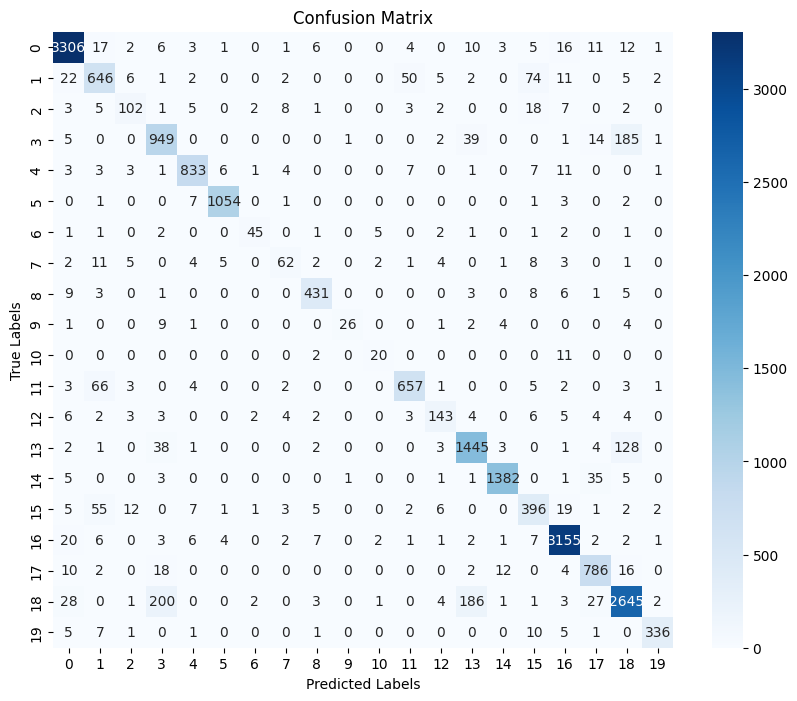

Epoch 49/50, Val Loss: 0.1668, Val Acc: 0.9065
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_49.pth


Epoch 50/50 [Training]:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:192: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 50/50, Train Loss: 0.0257, Train Acc: 0.9725
Epoch 50/50, Starting Validation...


Evaluation:   0%|          | 0/159 [00:00<?, ?it/s]<ipython-input-11-4f41e0171898>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # 保持与训练一致，使用混合精度


F1 Score (Macro): 0.8378
F1 Score (Weighted): 0.9063
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3404
           1       0.78      0.78      0.78       828
           2       0.74      0.65      0.69       159
           3       0.77      0.80      0.78      1197
           4       0.95      0.94      0.95       881
           5       0.98      0.99      0.99      1069
           6       0.86      0.71      0.78        62
           7       0.70      0.56      0.62       111
           8       0.93      0.92      0.93       467
           9       0.93      0.54      0.68        48
          10       0.69      0.61      0.65        33
          11       0.90      0.88      0.89       747
          12       0.82      0.75      0.78       191
          13       0.86      0.88      0.87      1628
          14       0.98      0.96      0.97      1434
          15       0.73      0.76      0.75       517
          16       0.96     

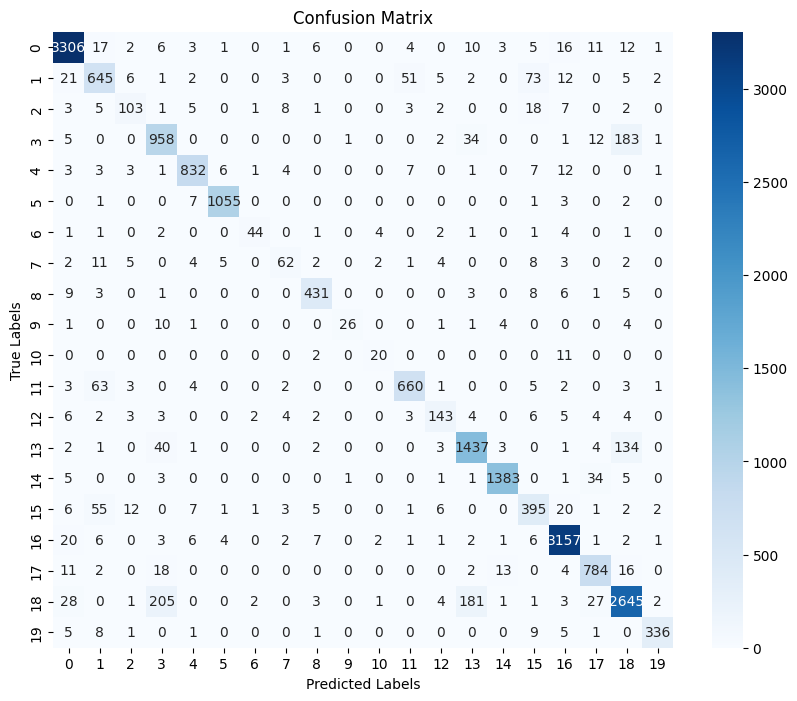

Epoch 50/50, Val Loss: 0.1668, Val Acc: 0.9066
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss/checkpoint_epoch_50.pth
Training completed!


<ipython-input-11-4f41e0171898>:249: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))


NameError: name 'alpha_tensor' is not defined

In [ ]:


from pytorch_toolbelt.losses import CrossEntropyFocalLoss  # Import the focal loss

# Define the importance of classes

warnings.filterwarnings("ignore", message="The parameter 'pretrained' is deprecated")
warnings.filterwarnings("ignore", message="Torch was not compiled with flash attention")

# 2. Define the ViT model
def get_vit_model(num_classes=20):
    model = models.vit_b_16(weights=None)  # weights=None means random initialization
    num_features = model.heads.head.in_features
    model.heads.head = nn.Linear(num_features, num_classes)
    return model

# 3. Initialize the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# 4. Data preprocessing
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# 5. Load the dataset
data_dir = '/content/data'  # Ensure this is the directory containing train, val, and test folders
train_dir = os.path.join(data_dir, 'train')
val_dir = os.path.join(data_dir, 'val')
test_dir = os.path.join(data_dir, 'test')

# Create datasets
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform_train)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform_val_test)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform_val_test)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

print("Data loading completed!")
print(f"Class indices: {train_dataset.class_to_idx}")

# 6. Initialize the model, loss function, optimizer, and learning rate scheduler
num_classes = len(train_dataset.classes)  # Dynamically retrieve the number of classes
model = get_vit_model(num_classes=num_classes).to(device)

criterion_Focal = CrossEntropyFocalLoss(gamma=2.0, reduction='mean')

optimizer = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# Initialize mixed precision training
scaler = GradScaler()

# 7. Set checkpoint saving path
checkpoint_dir = '/content/drive/MyDrive/comp9444/vit_flloss'
os.makedirs(checkpoint_dir, exist_ok=True)
best_model_path = os.path.join(checkpoint_dir, 'best_vit_model.pth')

# 8. Define training parameters
num_epochs = 50
start_epoch = 0
best_val_acc = 0.0  # To save the best model based on the validation set

# 9. Define a function to load checkpoints
def load_checkpoint(epoch_num):
    checkpoint_file = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch_num}.pth')
    if os.path.exists(checkpoint_file):
        print(f"Loading checkpoint from epoch {epoch_num}...")
        checkpoint = torch.load(checkpoint_file, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        scaler.load_state_dict(checkpoint['scaler_state_dict'])
        global start_epoch, best_val_acc
        start_epoch = checkpoint['epoch'] + 1
        best_val_acc = checkpoint['best_val_acc']
        print(f"Resumed training from epoch {start_epoch}")
    else:
        print(f"No checkpoint found for epoch {epoch_num}.")

# 10. Check for existing checkpoints to resume training
initial_checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint_epoch_1.pth')
if os.path.exists(initial_checkpoint_path):
    print("Main checkpoint found, resuming training...")
    load_checkpoint(start_epoch)
else:
    print("No main checkpoint found, starting new training")

# 11. Define the evaluation function (unchanged)
from sklearn.metrics import f1_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    all_labels = []
    all_preds = []

    test_bar = tqdm(dataloader, desc="Evaluation", leave=False)

    with torch.no_grad():
        for images, labels in test_bar:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            with autocast():  # Use mixed precision for consistency with training
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data).item()

            # Collect all labels and predictions for F1 score and confusion matrix
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

            # Calculate accuracy for the current batch
            batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

            # Update tqdm description
            test_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    avg_loss = running_loss / len(dataloader.dataset)
    avg_acc = running_corrects / len(dataloader.dataset)

    # Compute F1 scores (macro and weighted averages)
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    print(f"F1 Score (Macro): {f1_macro:.4f}")
    print(f"F1 Score (Weighted): {f1_weighted:.4f}")

    # Print classification report
    print(classification_report(all_labels, all_preds))

    # Generate and plot confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

    return avg_loss, avg_acc

# 12. Training loop
for epoch in range(start_epoch, num_epochs):
    ######################
    # Training phase
    ######################
    model.train()
    running_loss = 0.0
    running_corrects = 0

    # Use tqdm to display training progress
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]", leave=False)

    for images, labels in train_bar:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with autocast():
            outputs = model(images)
            loss = criterion_Focal(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data).item()

        # Calculate accuracy for the current batch
        batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

        # Update tqdm description
        train_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects / len(train_loader.dataset)

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}')

    ######################
    # Validation phase
    ######################
    print(f"Epoch {epoch+1}/{num_epochs}, Starting Validation...")
    val_loss, val_acc = evaluate(model, val_loader, criterion_Focal, device)
    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')

    # Save the best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        print(f'Best model saved, Validation Accuracy: {best_val_acc:.4f}')

    # Save the checkpoint
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pth')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'best_val_acc': best_val_acc,
    }, checkpoint_path)
    print(f'Checkpoint saved at {checkpoint_path}')

    # Adjust the learning rate
    scheduler.step()

print("Training completed!")


Training set class counts: {'bag': 17014, 'bracelet': 4139, 'brooch': 795, 'dress': 5983, 'earrings': 4406, 'eyewear': 5343, 'gloves': 308, 'hairwear': 553, 'hats': 2330, 'jumpsuit': 236, 'legwear': 161, 'necklace': 3732, 'neckwear': 952, 'outwear': 8135, 'pants': 7166, 'rings': 2581, 'shoes': 16107, 'skirt': 4245, 'top': 15517, 'watches': 1831}
Testing set class counts: {'bag': 4254, 'bracelet': 1035, 'brooch': 200, 'dress': 1496, 'earrings': 1102, 'eyewear': 1337, 'gloves': 78, 'hairwear': 139, 'hats': 583, 'jumpsuit': 60, 'legwear': 41, 'necklace': 932, 'neckwear': 237, 'outwear': 2034, 'pants': 1791, 'rings': 646, 'shoes': 4028, 'skirt': 1062, 'top': 3880, 'watches': 459}


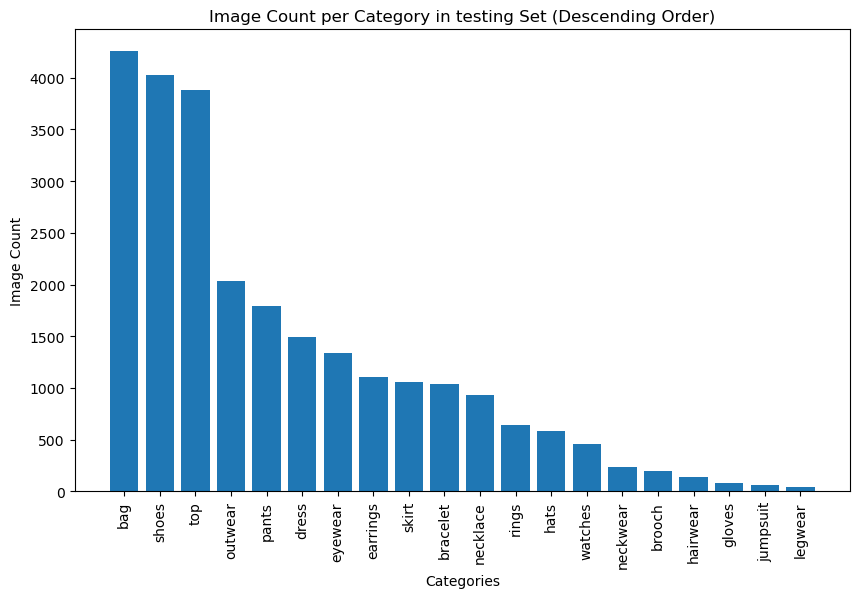

In [18]:
import matplotlib.pyplot as plt
from collections import Counter

# Count the number of images in each class within the training and testing datasets
train_class_counts = Counter([train_dataset.classes[label] for _, label in train_dataset.samples])
test_class_counts = Counter([test_dataset.classes[label] for _, label in test_dataset.samples])

# Print the counts for each category in both train and test datasets
print("Training set class counts:", dict(train_class_counts))
print("Testing set class counts:", dict(test_class_counts))

# Sort train class counts in descending order
sorted_train_class_counts = dict(sorted(test_class_counts.items(), key=lambda item: item[1], reverse=True))

# Plot a bar chart for the train dataset class counts
plt.figure(figsize=(10, 6))
plt.bar(sorted_train_class_counts.keys(), sorted_train_class_counts.values())
plt.xticks(rotation=90)
plt.xlabel('Categories')
plt.ylabel('Image Count')
plt.title('Image Count per Category in testing Set (Descending Order)')
plt.savefig('testingcout.png')
plt.show()



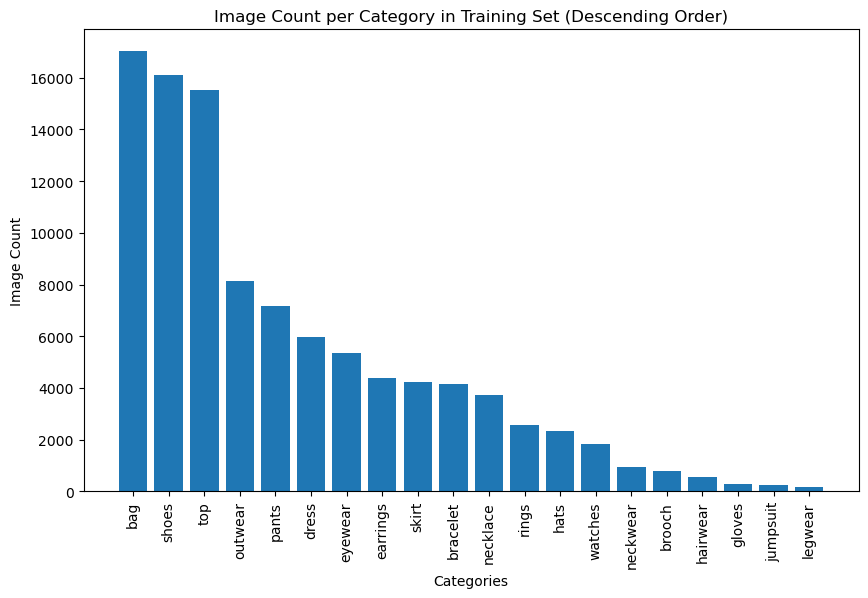

In [5]:
import matplotlib.pyplot as plt

# Sort train class counts in descending order
sorted_train_class_counts = dict(sorted(train_class_counts.items(), key=lambda item: item[1], reverse=True))

# Plot a bar chart for the train dataset class counts
plt.figure(figsize=(10, 6))
plt.bar(sorted_train_class_counts.keys(), sorted_train_class_counts.values())
plt.xticks(rotation=90)
plt.xlabel('Categories')
plt.ylabel('Image Count')
plt.title('Image Count per Category in Training Set (Descending Order)')
plt.savefig('traincout.png')
plt.show()



In [22]:
# Define the pre-set class order
class_order = {
    'bag': 0, 'bracelet': 1, 'brooch': 2, 'dress': 3, 'earrings': 4,
    'eyewear': 5, 'gloves': 6, 'hairwear': 7, 'hats': 8, 'jumpsuit': 9,
    'legwear': 10, 'necklace': 11, 'neckwear': 12, 'outwear': 13,
    'pants': 14, 'rings': 15, 'shoes': 16, 'skirt': 17, 'top': 18, 'watches': 19
}

# Sort train_class_counts by the pre-set class order
ordered_train_class_counts = {k: train_class_counts[k] for k in sorted(train_class_counts, key=lambda x: class_order.get(x, float('inf')))}

# Display the ordered dictionary
ordered_train_class_counts


{'bag': 17014,
 'bracelet': 4139,
 'brooch': 795,
 'dress': 5983,
 'earrings': 4406,
 'eyewear': 5343,
 'gloves': 308,
 'hairwear': 553,
 'hats': 2330,
 'jumpsuit': 236,
 'legwear': 161,
 'necklace': 3732,
 'neckwear': 952,
 'outwear': 8135,
 'pants': 7166,
 'rings': 2581,
 'shoes': 16107,
 'skirt': 4245,
 'top': 15517,
 'watches': 1831}

In [17]:
import matplotlib.pyplot as plt

# Sort train class counts in descending order
sorted_train_class_counts = dict(sorted(train_class_counts.items(), key=lambda item: item[1], reverse=True))

# Plot a bar chart for the train dataset class counts
plt.figure(figsize=(10, 6))
plt.bar(sorted_train_class_counts.keys(), sorted_train_class_counts.values())
plt.xticks(rotation=90)
plt.xlabel('Categories')
plt.ylabel('Image Count')
plt.title('Image Count per Category in Training Set (Descending Order)')
plt.savefig('traincout.png')
plt.show()



NameError: name 'train_class_counts' is not defined

### No Focal Loss (CE loss)
Here we use ce loss as the compared model.

Using device: cuda
Data loading completed!
Class indices: {'bag': 0, 'bracelet': 1, 'brooch': 2, 'dress': 3, 'earrings': 4, 'eyewear': 5, 'gloves': 6, 'hairwear': 7, 'hats': 8, 'jumpsuit': 9, 'legwear': 10, 'necklace': 11, 'neckwear': 12, 'outwear': 13, 'pants': 14, 'rings': 15, 'shoes': 16, 'skirt': 17, 'top': 18, 'watches': 19}
No main checkpoint found, starting new training


Epoch 1/50 [Training]:   0%|                                                                                                            | 0/407 [00:00<?, ?it/s]C:\Users\59698\AppData\Roaming\Python\Python311\site-packages\torch\nn\functional.py:5504: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = scaled_dot_product_attention(q, k, v, attn_mask, dropout_p, is_causal)


Epoch 1/50, Train Loss: 2.0371, Train Acc: 0.3519
Epoch 1/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.2086
F1 Score (Weighted): 0.3518
              precision    recall  f1-score   support

           0       0.94      0.24      0.38      3403
           1       0.44      0.16      0.24       828
           2       0.00      0.00      0.00       160
           3       0.21      0.02      0.03      1196
           4       0.23      0.62      0.33       882
           5       0.98      0.19      0.32      1069
           6       0.00      0.00      0.00        61
           7       0.00      0.00      0.00       111
           8       0.80      0.01      0.02       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        32
          11       0.36      0.48      0.41       747
          12       0.00      0.00      0.00       191
          13       0.22      0.78      0.34      1628
          14       0.57      0.69      0.62      1434
          15       0.50      0.00      0.01       517
          16       0.56     

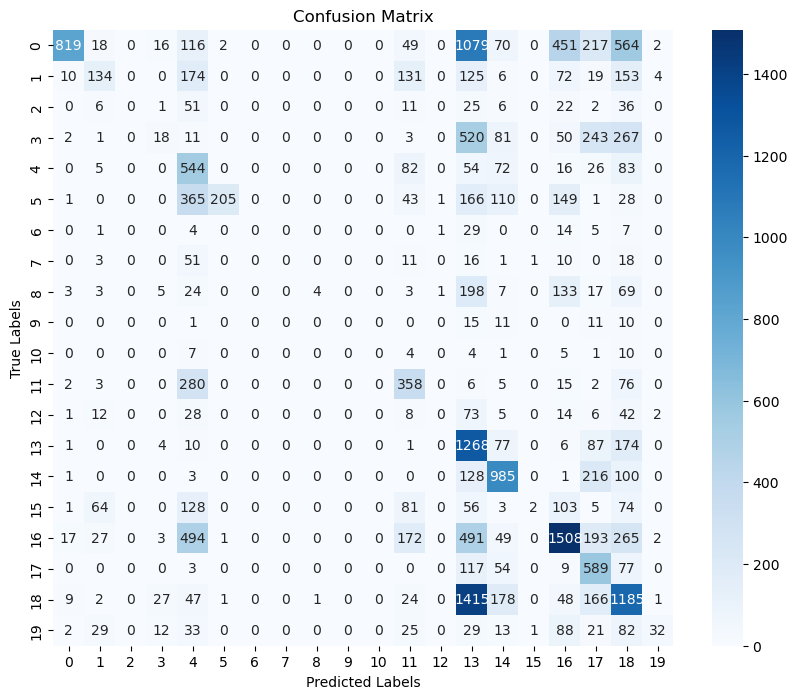

Epoch 1/50, Val Loss: 1.9840, Val Acc: 0.3766
Best model saved, Validation Accuracy: 0.3766
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_1.pth


Epoch 2/50, Train Loss: 1.3113, Train Acc: 0.5684
Epoch 2/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.3133
F1 Score (Weighted): 0.5042
              precision    recall  f1-score   support

           0       0.83      0.64      0.72      3403
           1       0.46      0.10      0.17       828
           2       0.00      0.00      0.00       160
           3       0.31      0.21      0.25      1196
           4       0.71      0.17      0.27       882
           5       0.94      0.40      0.57      1069
           6       0.00      0.00      0.00        61
           7       0.00      0.00      0.00       111
           8       0.54      0.27      0.36       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        32
          11       0.54      0.67      0.60       747
          12       0.00      0.00      0.00       191
          13       0.44      0.53      0.48      1628
          14       0.88      0.58      0.70      1434
          15       0.37      0.13      0.19       517
          16       0.44     

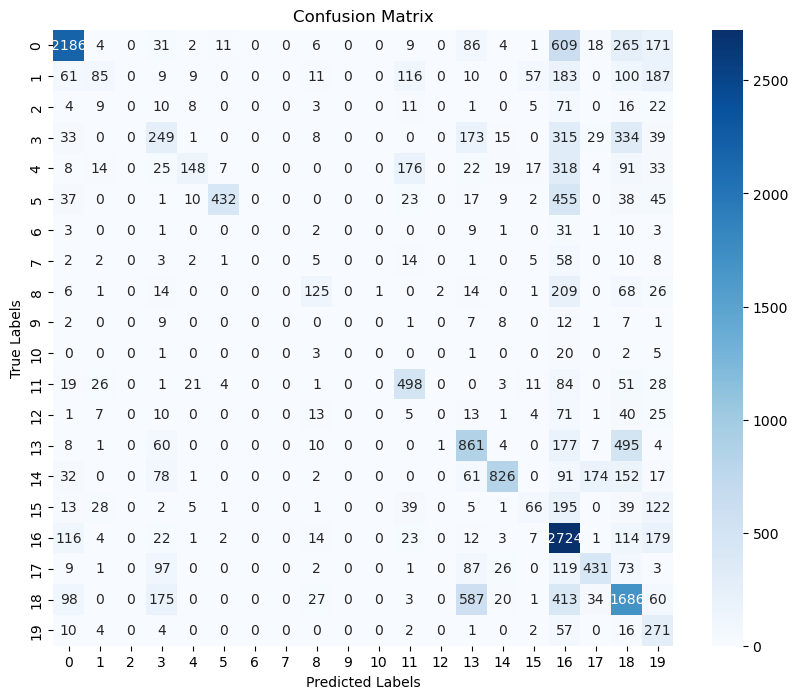

Epoch 2/50, Val Loss: 1.5284, Val Acc: 0.5212
Best model saved, Validation Accuracy: 0.5212
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_2.pth


Epoch 3/50, Train Loss: 1.0963, Train Acc: 0.6362
Epoch 3/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.3887
F1 Score (Weighted): 0.5678
              precision    recall  f1-score   support

           0       0.59      0.92      0.72      3403
           1       0.56      0.15      0.24       828
           2       0.22      0.09      0.12       160
           3       0.28      0.40      0.33      1196
           4       0.49      0.65      0.56       882
           5       0.95      0.71      0.81      1069
           6       0.25      0.03      0.06        61
           7       0.33      0.01      0.02       111
           8       0.48      0.58      0.53       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        32
          11       0.49      0.81      0.61       747
          12       0.27      0.02      0.04       191
          13       0.45      0.54      0.49      1628
          14       0.96      0.62      0.75      1434
          15       0.37      0.27      0.31       517
          16       0.70     

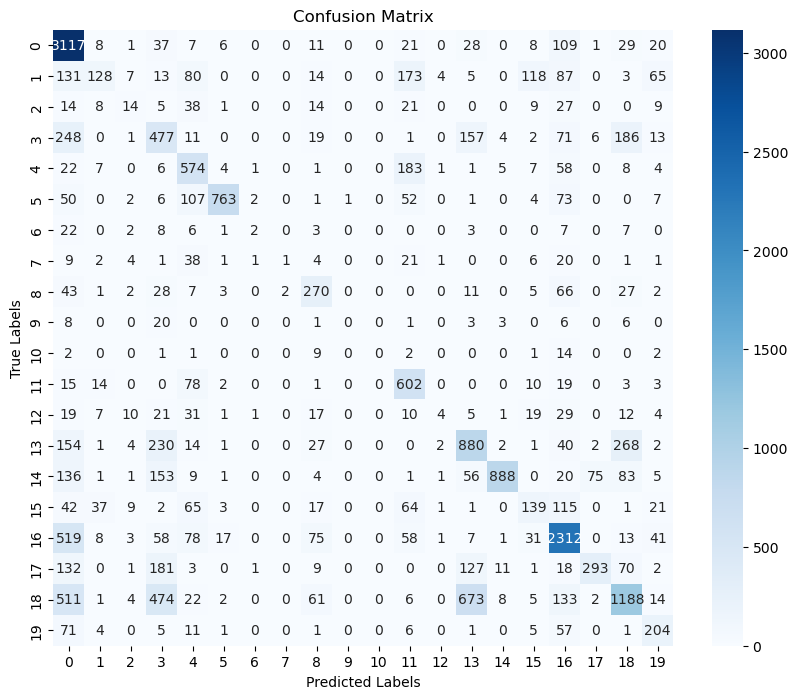

Epoch 3/50, Val Loss: 1.2423, Val Acc: 0.5836
Best model saved, Validation Accuracy: 0.5836
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_3.pth


Epoch 4/50, Train Loss: 0.9983, Train Acc: 0.6667
Epoch 4/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.4100
F1 Score (Weighted): 0.6126
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      3403
           1       0.42      0.44      0.43       828
           2       0.67      0.01      0.02       160
           3       0.47      0.28      0.35      1196
           4       0.61      0.54      0.57       882
           5       0.92      0.78      0.85      1069
           6       0.00      0.00      0.00        61
           7       0.00      0.00      0.00       111
           8       0.73      0.40      0.51       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        32
          11       0.46      0.81      0.59       747
          12       0.36      0.13      0.19       191
          13       0.64      0.25      0.36      1628
          14       0.91      0.71      0.80      1434
          15       0.40      0.13      0.20       517
          16       0.80     

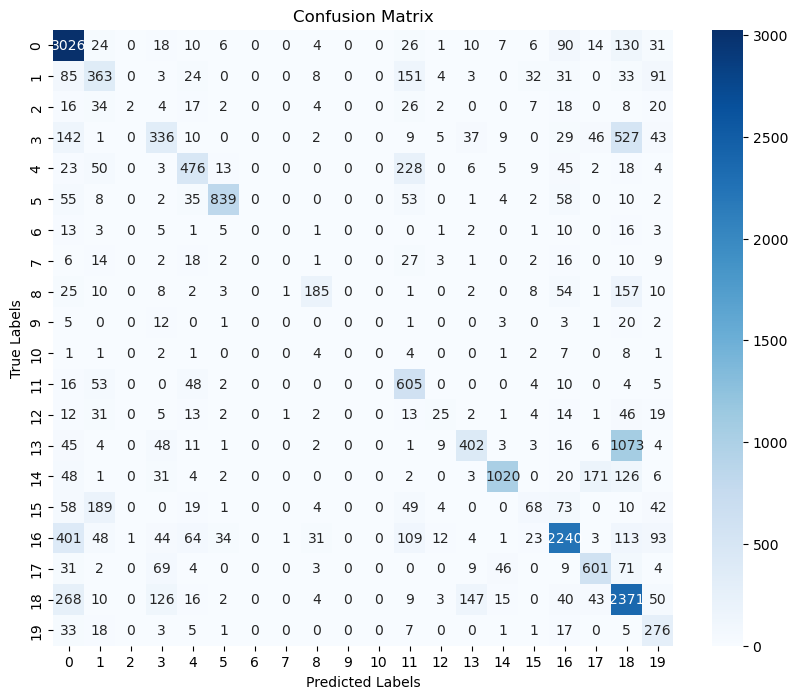

Epoch 4/50, Val Loss: 1.0710, Val Acc: 0.6318
Best model saved, Validation Accuracy: 0.6318
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_4.pth


Epoch 5/50, Train Loss: 0.9257, Train Acc: 0.6892
Epoch 5/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.4448
F1 Score (Weighted): 0.6331
              precision    recall  f1-score   support

           0       0.78      0.87      0.82      3403
           1       0.60      0.19      0.29       828
           2       0.15      0.34      0.21       160
           3       0.49      0.26      0.34      1196
           4       0.40      0.82      0.54       882
           5       0.65      0.94      0.77      1069
           6       0.18      0.11      0.14        61
           7       0.40      0.02      0.03       111
           8       0.51      0.61      0.56       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        32
          11       0.65      0.58      0.61       747
          12       0.27      0.18      0.21       191
          13       0.54      0.65      0.59      1628
          14       0.81      0.84      0.82      1434
          15       0.39      0.35      0.37       517
          16       0.77     

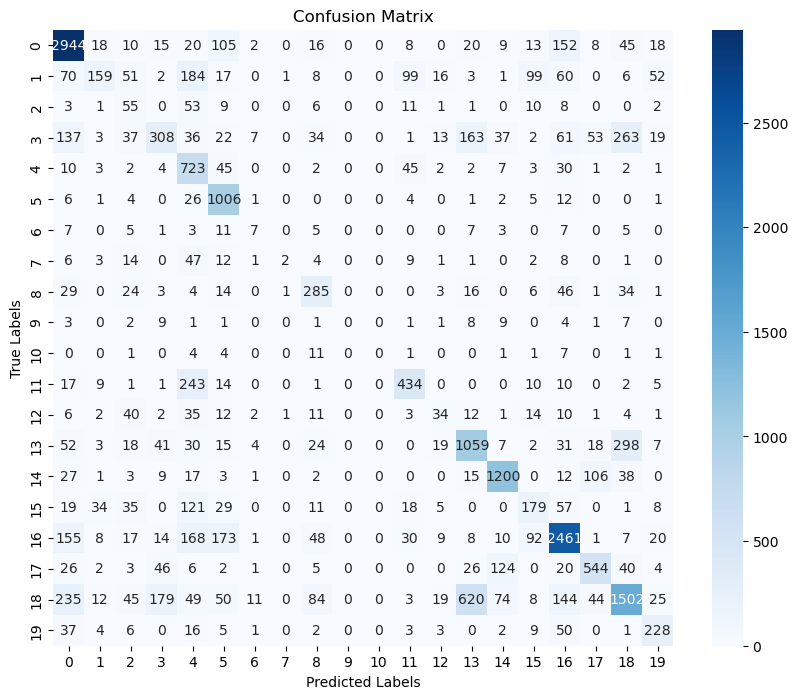

Epoch 5/50, Val Loss: 1.0695, Val Acc: 0.6463
Best model saved, Validation Accuracy: 0.6463
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_5.pth


Epoch 6/50, Train Loss: 0.8807, Train Acc: 0.7053
Epoch 6/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.4464
F1 Score (Weighted): 0.6349
              precision    recall  f1-score   support

           0       0.95      0.65      0.77      3403
           1       0.40      0.51      0.45       828
           2       0.33      0.06      0.10       160
           3       0.52      0.32      0.40      1196
           4       0.47      0.72      0.57       882
           5       0.93      0.81      0.87      1069
           6       0.00      0.00      0.00        61
           7       0.30      0.15      0.20       111
           8       0.56      0.58      0.57       467
           9       0.00      0.00      0.00        48
          10       0.00      0.00      0.00        32
          11       0.53      0.67      0.59       747
          12       0.21      0.24      0.22       191
          13       0.54      0.53      0.53      1628
          14       0.70      0.86      0.77      1434
          15       0.43      0.30      0.35       517
          16       0.81     

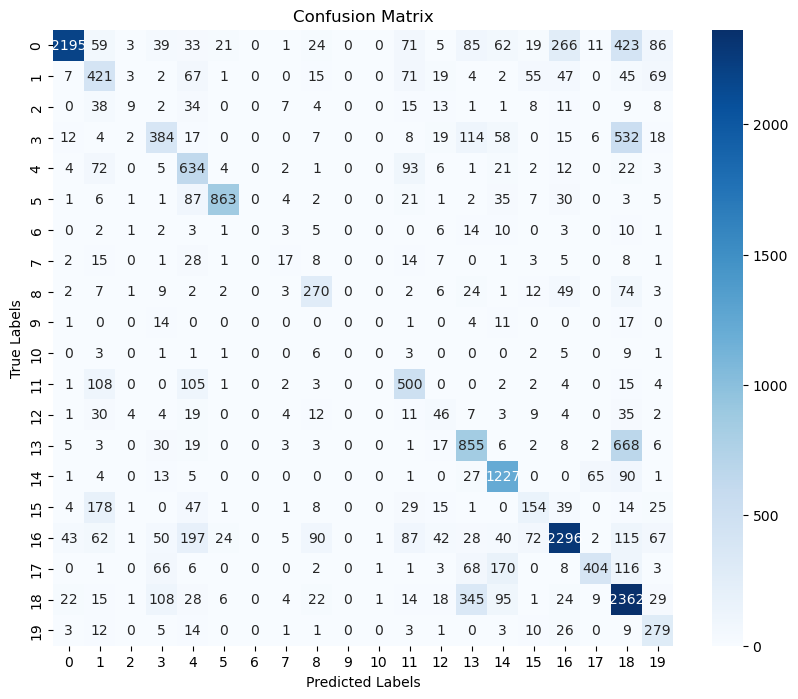

Epoch 6/50, Val Loss: 1.1042, Val Acc: 0.6358
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_6.pth


Epoch 7/50, Train Loss: 0.8264, Train Acc: 0.7234
Epoch 7/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.4887
F1 Score (Weighted): 0.6790
              precision    recall  f1-score   support

           0       0.81      0.88      0.85      3403
           1       0.48      0.44      0.46       828
           2       0.21      0.40      0.28       160
           3       0.60      0.36      0.45      1196
           4       0.79      0.44      0.56       882
           5       0.78      0.94      0.85      1069
           6       0.44      0.11      0.18        61
           7       0.45      0.08      0.14       111
           8       0.42      0.74      0.54       467
           9       1.00      0.02      0.04        48
          10       0.00      0.00      0.00        32
          11       0.79      0.52      0.62       747
          12       0.39      0.06      0.10       191
          13       0.51      0.77      0.61      1628
          14       0.86      0.86      0.86      1434
          15       0.41      0.49      0.45       517
          16       0.80     

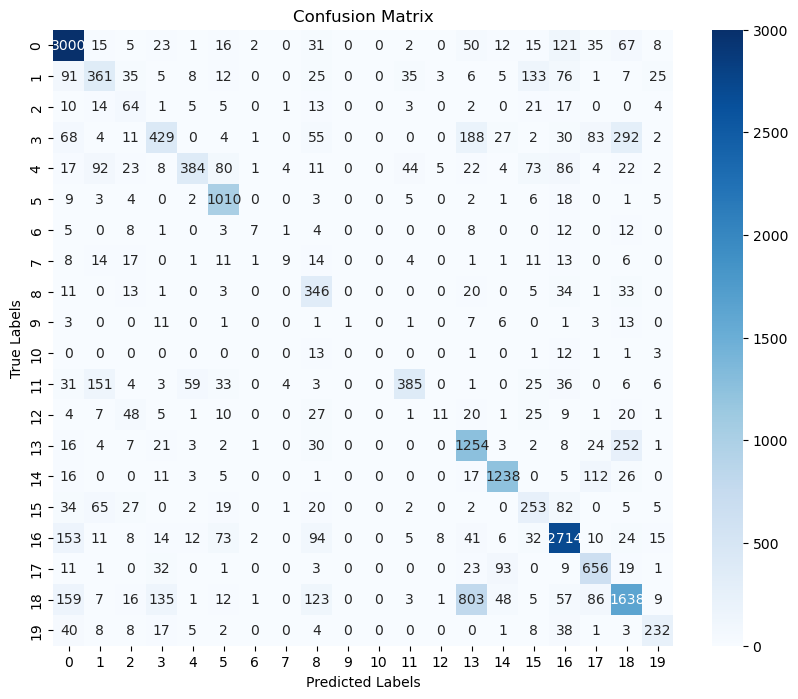

Epoch 7/50, Val Loss: 0.9197, Val Acc: 0.6887
Best model saved, Validation Accuracy: 0.6887
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_7.pth


Epoch 8/50, Train Loss: 0.7853, Train Acc: 0.7368
Epoch 8/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.4842
F1 Score (Weighted): 0.6685
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      3403
           1       0.64      0.28      0.39       828
           2       0.58      0.04      0.08       160
           3       0.59      0.26      0.36      1196
           4       0.80      0.46      0.59       882
           5       0.95      0.81      0.88      1069
           6       0.56      0.08      0.14        61
           7       0.00      0.00      0.00       111
           8       0.74      0.49      0.59       467
           9       0.60      0.06      0.11        48
          10       1.00      0.06      0.12        32
          11       0.52      0.85      0.64       747
          12       0.25      0.50      0.33       191
          13       0.45      0.79      0.58      1628
          14       0.89      0.80      0.84      1434
          15       0.44      0.47      0.45       517
          16       0.74     

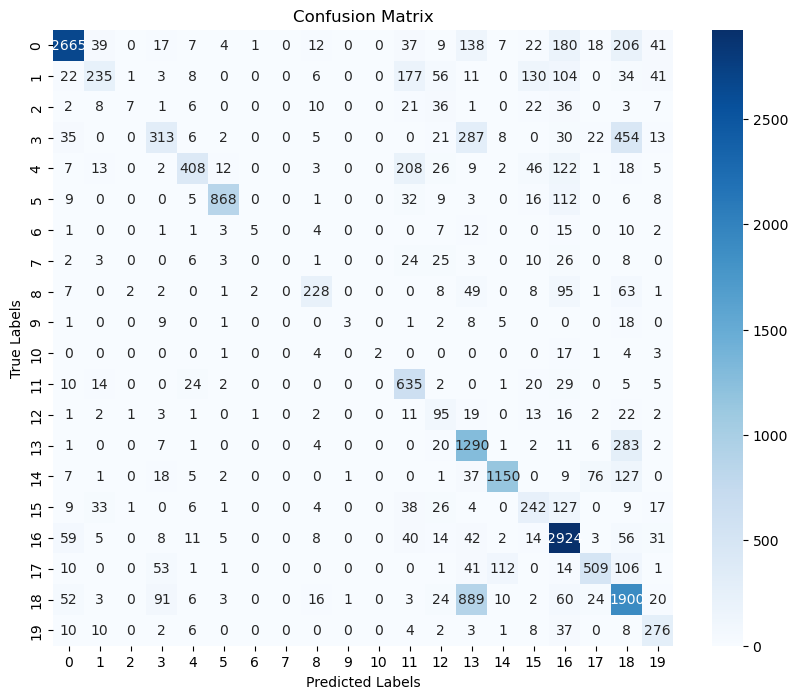

Epoch 8/50, Val Loss: 0.9488, Val Acc: 0.6771
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_8.pth


Epoch 9/50, Train Loss: 0.7590, Train Acc: 0.7455
Epoch 9/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.5255
F1 Score (Weighted): 0.7104
              precision    recall  f1-score   support

           0       0.87      0.86      0.86      3403
           1       0.52      0.52      0.52       828
           2       0.22      0.31      0.26       160
           3       0.49      0.51      0.50      1196
           4       0.75      0.66      0.70       882
           5       0.97      0.83      0.89      1069
           6       0.53      0.28      0.37        61
           7       0.27      0.03      0.05       111
           8       0.73      0.54      0.62       467
           9       0.00      0.00      0.00        48
          10       1.00      0.06      0.12        32
          11       0.67      0.78      0.72       747
          12       0.52      0.06      0.11       191
          13       0.75      0.43      0.55      1628
          14       0.84      0.87      0.86      1434
          15       0.41      0.56      0.47       517
          16       0.77     

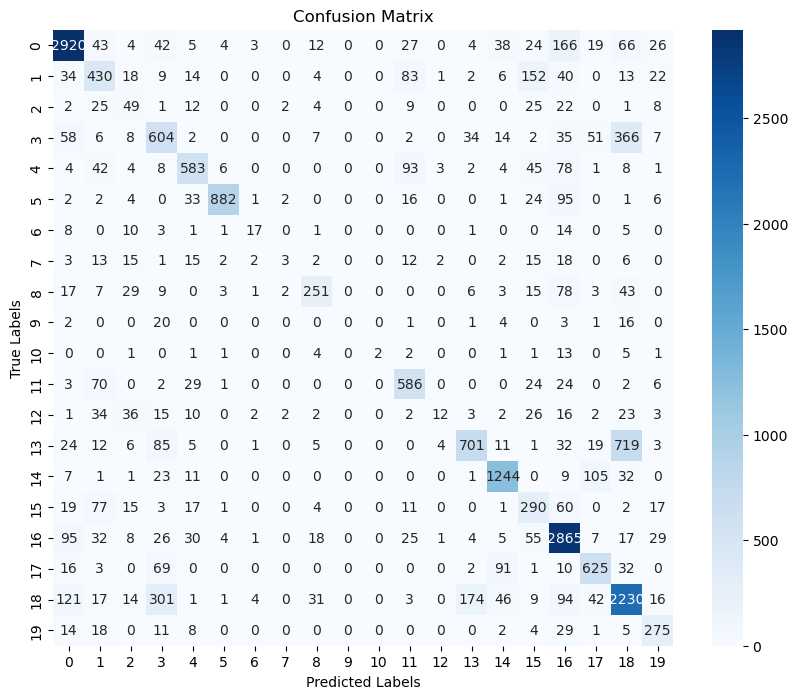

Epoch 9/50, Val Loss: 0.8282, Val Acc: 0.7171
Best model saved, Validation Accuracy: 0.7171
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_9.pth


Epoch 10/50, Train Loss: 0.7041, Train Acc: 0.7626
Epoch 10/50, Starting Validation...


F1 Score (Macro): 0.5451
F1 Score (Weighted): 0.7069
              precision    recall  f1-score   support

           0       0.73      0.95      0.82      3403
           1       0.51      0.52      0.52       828
           2       0.52      0.11      0.18       160
           3       0.69      0.29      0.41      1196
           4       0.80      0.55      0.65       882
           5       0.94      0.92      0.93      1069
           6       0.55      0.36      0.44        61
           7       0.39      0.14      0.21       111
           8       0.51      0.77      0.62       467
           9       0.62      0.10      0.18        48
          10       1.00      0.03      0.06        32
          11       0.77      0.69      0.72       747
          12       0.56      0.21      0.30       191
          13       0.63      0.62      0.62      1628
          14       0.94      0.80      0.86      1434
          15       0.59      0.32      0.41       517
          16       0.79     

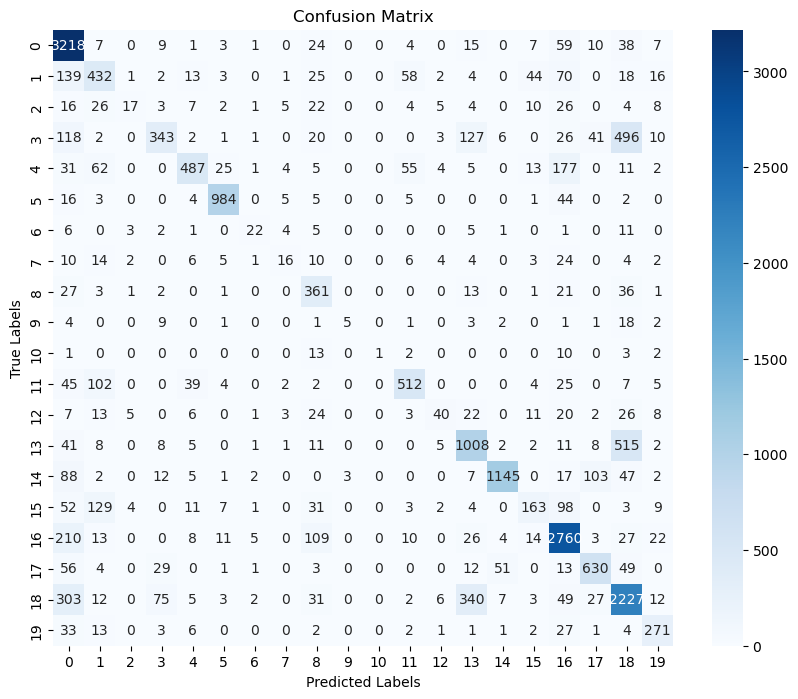

Epoch 10/50, Val Loss: 0.8215, Val Acc: 0.7207
Best model saved, Validation Accuracy: 0.7207
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_10.pth


Epoch 11/50, Train Loss: 0.6709, Train Acc: 0.7728
Epoch 11/50, Starting Validation...


F1 Score (Macro): 0.5944
F1 Score (Weighted): 0.7552
              precision    recall  f1-score   support

           0       0.89      0.90      0.89      3403
           1       0.54      0.52      0.53       828
           2       0.42      0.34      0.37       160
           3       0.54      0.57      0.55      1196
           4       0.87      0.65      0.74       882
           5       0.93      0.92      0.93      1069
           6       0.85      0.28      0.42        61
           7       0.60      0.14      0.22       111
           8       0.78      0.69      0.73       467
           9       0.50      0.02      0.04        48
          10       0.50      0.09      0.16        32
          11       0.77      0.72      0.74       747
          12       0.40      0.46      0.42       191
          13       0.61      0.75      0.67      1628
          14       0.91      0.86      0.89      1434
          15       0.45      0.64      0.53       517
          16       0.83     

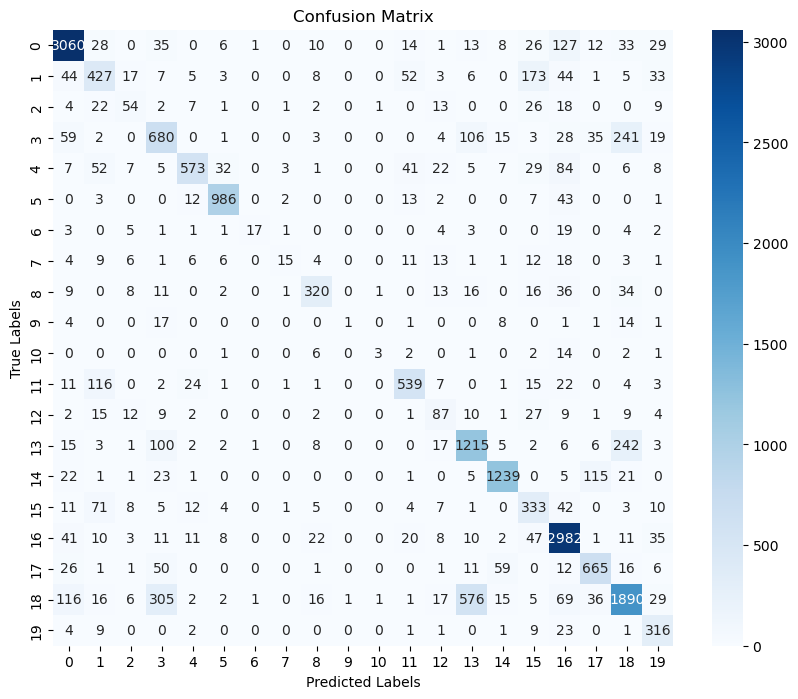

Epoch 11/50, Val Loss: 0.7082, Val Acc: 0.7581
Best model saved, Validation Accuracy: 0.7581
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_11.pth


Epoch 12/50, Train Loss: 0.6359, Train Acc: 0.7840
Epoch 12/50, Starting Validation...


F1 Score (Macro): 0.5942
F1 Score (Weighted): 0.7617
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      3403
           1       0.52      0.68      0.59       828
           2       0.50      0.29      0.37       160
           3       0.60      0.49      0.54      1196
           4       0.89      0.64      0.74       882
           5       0.85      0.97      0.91      1069
           6       0.67      0.33      0.44        61
           7       0.90      0.08      0.15       111
           8       0.64      0.84      0.73       467
           9       0.44      0.08      0.14        48
          10       0.00      0.00      0.00        32
          11       0.75      0.76      0.75       747
          12       0.52      0.41      0.46       191
          13       0.61      0.76      0.67      1628
          14       0.90      0.90      0.90      1434
          15       0.53      0.48      0.50       517
          16       0.90     

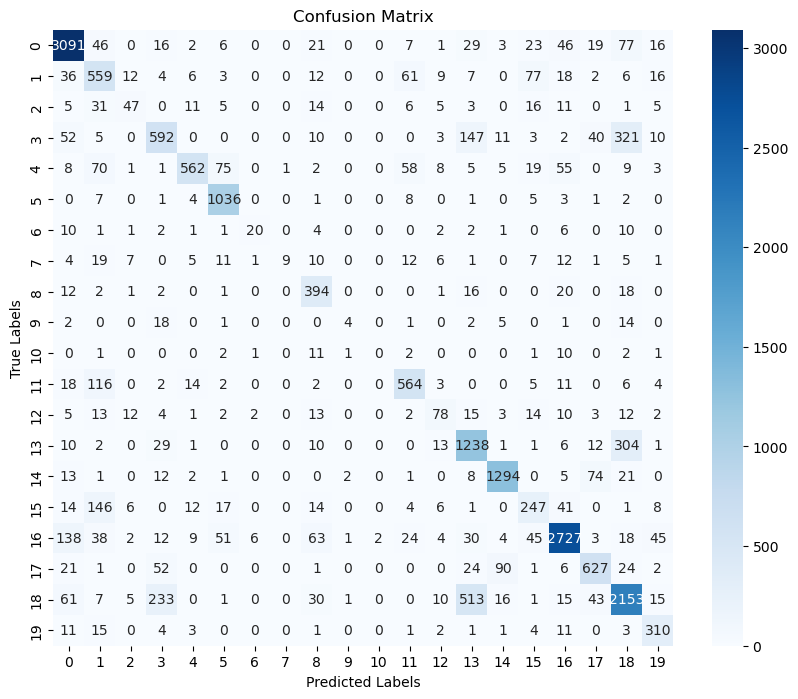

Epoch 12/50, Val Loss: 0.6785, Val Acc: 0.7655
Best model saved, Validation Accuracy: 0.7655
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_12.pth


Epoch 13/50, Train Loss: 0.6079, Train Acc: 0.7955
Epoch 13/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.6051
F1 Score (Weighted): 0.7521
              precision    recall  f1-score   support

           0       0.91      0.87      0.89      3403
           1       0.63      0.51      0.56       828
           2       0.54      0.22      0.31       160
           3       0.44      0.73      0.55      1196
           4       0.89      0.64      0.74       882
           5       0.93      0.94      0.93      1069
           6       0.60      0.48      0.53        61
           7       0.46      0.14      0.22       111
           8       0.70      0.75      0.72       467
           9       0.00      0.00      0.00        48
          10       0.40      0.12      0.19        32
          11       0.82      0.69      0.75       747
          12       0.60      0.49      0.54       191
          13       0.71      0.68      0.69      1628
          14       0.85      0.89      0.87      1434
          15       0.57      0.50      0.53       517
          16       0.76     

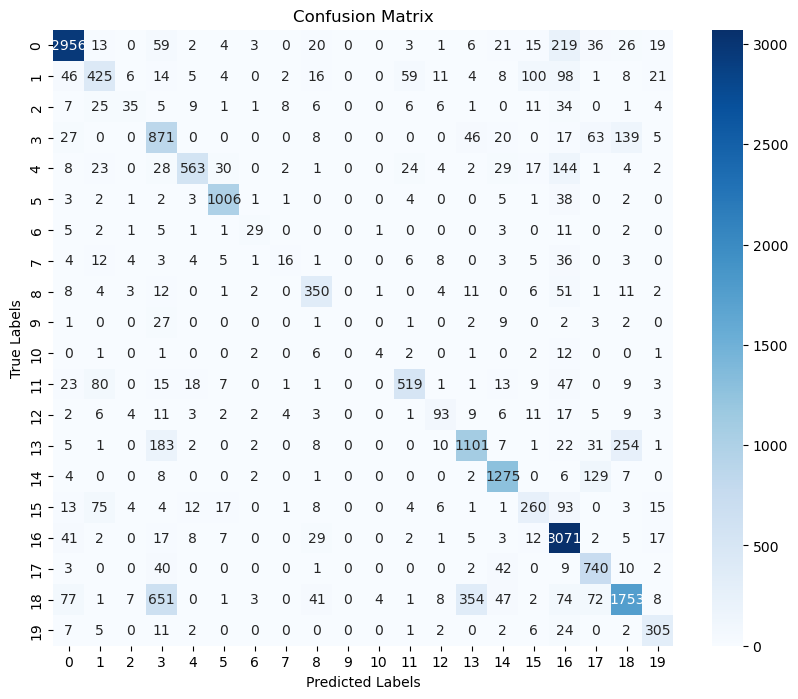

Epoch 13/50, Val Loss: 0.7174, Val Acc: 0.7566
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_13.pth


Epoch 14/50, Train Loss: 0.5775, Train Acc: 0.8030
Epoch 14/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.6326
F1 Score (Weighted): 0.7900
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      3403
           1       0.57      0.63      0.60       828
           2       0.62      0.30      0.40       160
           3       0.58      0.64      0.61      1196
           4       0.77      0.81      0.79       882
           5       0.98      0.92      0.95      1069
           6       0.91      0.34      0.50        61
           7       0.41      0.32      0.36       111
           8       0.81      0.74      0.77       467
           9       1.00      0.08      0.15        48
          10       0.00      0.00      0.00        32
          11       0.88      0.63      0.74       747
          12       0.62      0.42      0.50       191
          13       0.72      0.67      0.69      1628
          14       0.97      0.86      0.91      1434
          15       0.49      0.64      0.55       517
          16       0.86     

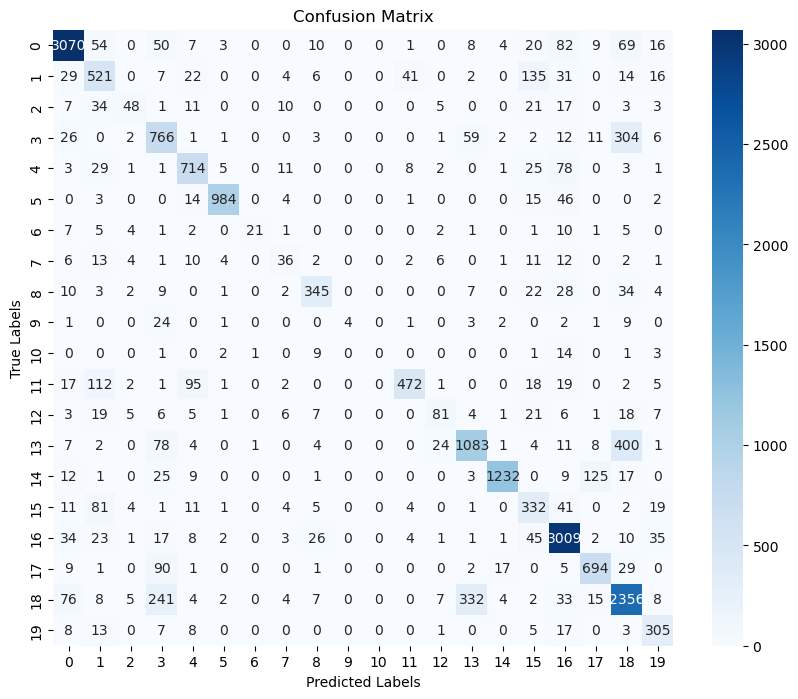

Epoch 14/50, Val Loss: 0.6126, Val Acc: 0.7911
Best model saved, Validation Accuracy: 0.7911
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_14.pth


Epoch 15/50, Train Loss: 0.5515, Train Acc: 0.8131
Epoch 15/50, Starting Validation...


F1 Score (Macro): 0.6333
F1 Score (Weighted): 0.7770
              precision    recall  f1-score   support

           0       0.94      0.85      0.89      3403
           1       0.58      0.66      0.62       828
           2       0.29      0.51      0.37       160
           3       0.44      0.74      0.55      1196
           4       0.75      0.87      0.81       882
           5       0.95      0.95      0.95      1069
           6       0.67      0.51      0.58        61
           7       0.56      0.23      0.32       111
           8       0.88      0.70      0.78       467
           9       0.06      0.08      0.07        48
          10       0.67      0.12      0.21        32
          11       0.85      0.73      0.79       747
          12       0.69      0.38      0.49       191
          13       0.62      0.81      0.70      1628
          14       0.97      0.80      0.87      1434
          15       0.48      0.53      0.51       517
          16       0.94     

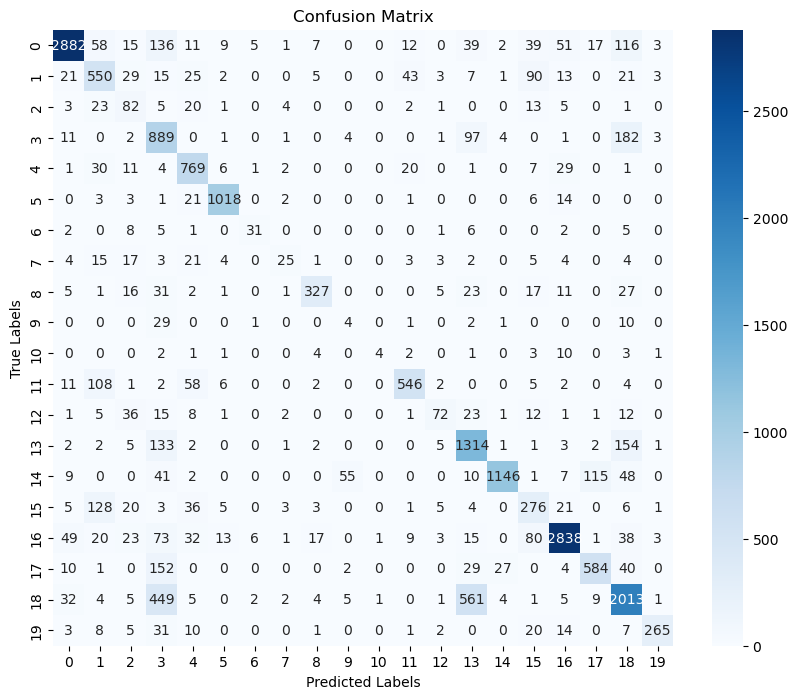

Epoch 15/50, Val Loss: 0.6749, Val Acc: 0.7696
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_15.pth


Epoch 16/50, Train Loss: 0.5289, Train Acc: 0.8193
Epoch 16/50, Starting Validation...


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.6393
F1 Score (Weighted): 0.7937
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      3403
           1       0.59      0.57      0.58       828
           2       0.62      0.29      0.39       160
           3       0.74      0.54      0.62      1196
           4       0.91      0.64      0.75       882
           5       0.90      0.97      0.94      1069
           6       0.56      0.67      0.61        61
           7       0.80      0.18      0.29       111
           8       0.74      0.80      0.77       467
           9       0.33      0.08      0.13        48
          10       0.00      0.00      0.00        32
          11       0.95      0.54      0.69       747
          12       0.65      0.57      0.61       191
          13       0.65      0.82      0.73      1628
          14       0.90      0.94      0.92      1434
          15       0.47      0.63      0.54       517
          16       0.82     

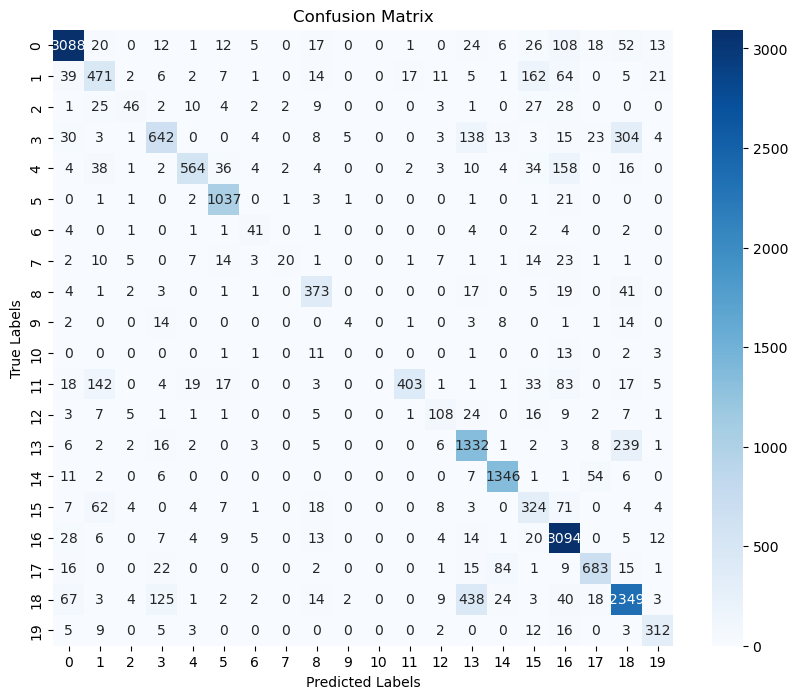

Epoch 16/50, Val Loss: 0.5929, Val Acc: 0.7992
Best model saved, Validation Accuracy: 0.7992
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_16.pth


Epoch 17/50, Train Loss: 0.5043, Train Acc: 0.8263
Epoch 17/50, Starting Validation...


F1 Score (Macro): 0.6726
F1 Score (Weighted): 0.7999
              precision    recall  f1-score   support

           0       0.97      0.88      0.92      3403
           1       0.67      0.52      0.59       828
           2       0.53      0.41      0.46       160
           3       0.65      0.65      0.65      1196
           4       0.88      0.81      0.84       882
           5       0.96      0.96      0.96      1069
           6       0.60      0.57      0.59        61
           7       0.77      0.15      0.26       111
           8       0.83      0.78      0.80       467
           9       0.83      0.21      0.33        48
          10       0.32      0.38      0.34        32
          11       0.75      0.87      0.81       747
          12       0.86      0.34      0.49       191
          13       0.86      0.46      0.60      1628
          14       0.94      0.91      0.93      1434
          15       0.58      0.54      0.56       517
          16       0.87     

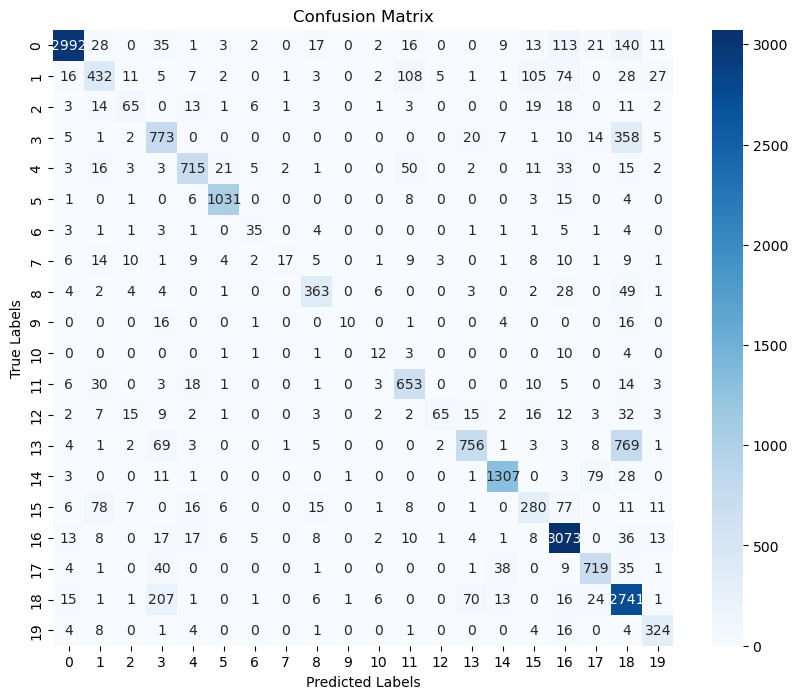

Epoch 17/50, Val Loss: 0.5681, Val Acc: 0.8054
Best model saved, Validation Accuracy: 0.8054
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_17.pth


Epoch 18/50, Train Loss: 0.4739, Train Acc: 0.8380
Epoch 18/50, Starting Validation...


F1 Score (Macro): 0.6813
F1 Score (Weighted): 0.8050
              precision    recall  f1-score   support

           0       0.95      0.90      0.93      3403
           1       0.73      0.42      0.53       828
           2       0.51      0.41      0.45       160
           3       0.71      0.51      0.60      1196
           4       0.89      0.74      0.81       882
           5       0.85      0.98      0.91      1069
           6       0.86      0.51      0.64        61
           7       0.47      0.28      0.35       111
           8       0.87      0.77      0.82       467
           9       0.35      0.15      0.21        48
          10       0.69      0.34      0.46        32
          11       0.79      0.87      0.83       747
          12       0.64      0.61      0.63       191
          13       0.69      0.81      0.74      1628
          14       0.88      0.93      0.91      1434
          15       0.48      0.68      0.56       517
          16       0.86     

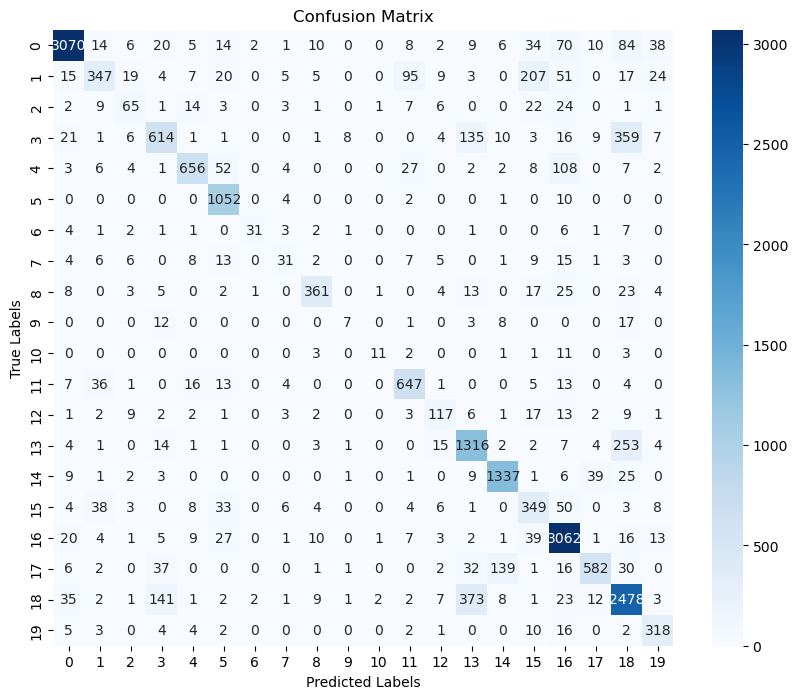

Epoch 18/50, Val Loss: 0.5527, Val Acc: 0.8098
Best model saved, Validation Accuracy: 0.8098
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_18.pth


Epoch 19/50, Train Loss: 0.4564, Train Acc: 0.8448
Epoch 19/50, Starting Validation...


F1 Score (Macro): 0.7116
F1 Score (Weighted): 0.8220
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      3403
           1       0.68      0.56      0.62       828
           2       0.69      0.44      0.54       160
           3       0.67      0.67      0.67      1196
           4       0.87      0.87      0.87       882
           5       0.93      0.97      0.95      1069
           6       0.50      0.75      0.60        61
           7       0.67      0.37      0.48       111
           8       0.71      0.88      0.79       467
           9       0.56      0.29      0.38        48
          10       0.69      0.34      0.46        32
          11       0.89      0.79      0.84       747
          12       0.53      0.66      0.59       191
          13       0.75      0.76      0.75      1628
          14       0.92      0.92      0.92      1434
          15       0.54      0.64      0.59       517
          16       0.93     

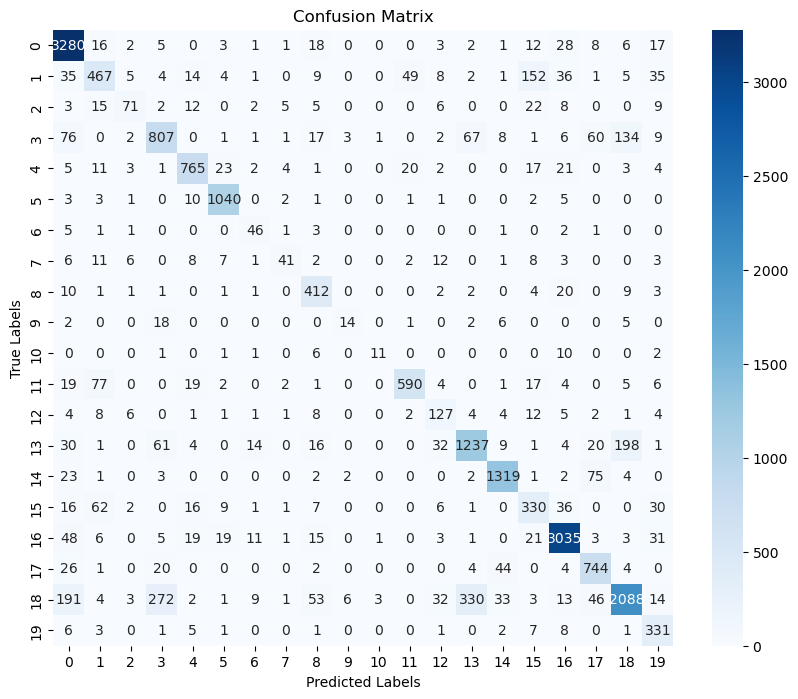

Epoch 19/50, Val Loss: 0.5150, Val Acc: 0.8247
Best model saved, Validation Accuracy: 0.8247
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_19.pth


Epoch 20/50, Train Loss: 0.4323, Train Acc: 0.8529
Epoch 20/50, Starting Validation...


F1 Score (Macro): 0.6826
F1 Score (Weighted): 0.8169
              precision    recall  f1-score   support

           0       0.86      0.95      0.91      3403
           1       0.67      0.67      0.67       828
           2       0.61      0.47      0.53       160
           3       0.72      0.54      0.62      1196
           4       0.86      0.86      0.86       882
           5       0.96      0.96      0.96      1069
           6       0.38      0.87      0.53        61
           7       0.53      0.17      0.26       111
           8       0.92      0.71      0.80       467
           9       0.79      0.23      0.35        48
          10       0.50      0.06      0.11        32
          11       0.88      0.80      0.84       747
          12       0.82      0.50      0.62       191
          13       0.68      0.86      0.76      1628
          14       0.96      0.93      0.94      1434
          15       0.63      0.56      0.60       517
          16       0.87     

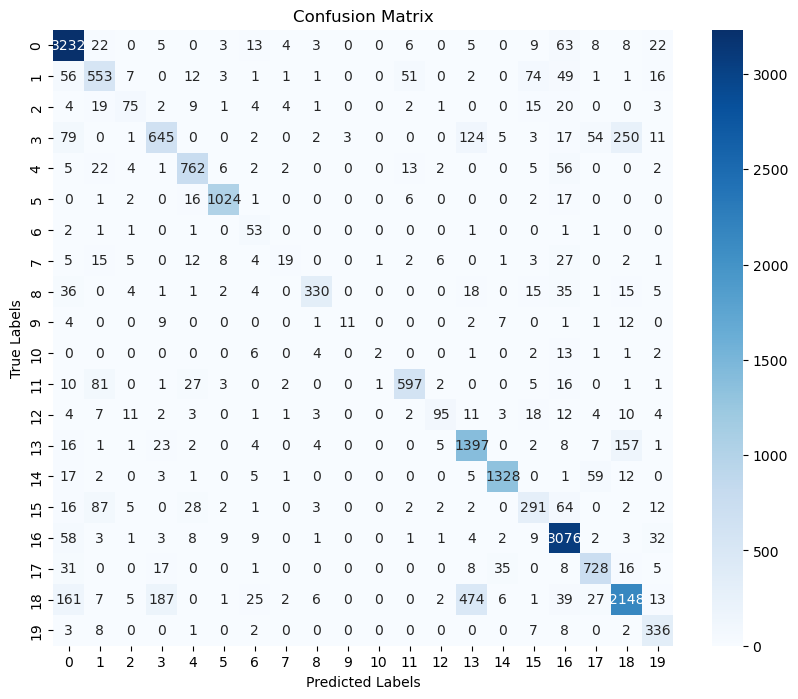

Epoch 20/50, Val Loss: 0.5271, Val Acc: 0.8221
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_20.pth


Epoch 21/50, Train Loss: 0.4091, Train Acc: 0.8593
Epoch 21/50, Starting Validation...


F1 Score (Macro): 0.7250
F1 Score (Weighted): 0.8368
              precision    recall  f1-score   support

           0       0.92      0.94      0.93      3403
           1       0.70      0.66      0.68       828
           2       0.71      0.42      0.53       160
           3       0.72      0.67      0.69      1196
           4       0.91      0.84      0.87       882
           5       0.91      0.99      0.94      1069
           6       0.44      0.79      0.56        61
           7       0.61      0.20      0.30       111
           8       0.84      0.84      0.84       467
           9       0.83      0.31      0.45        48
          10       0.56      0.44      0.49        32
          11       0.87      0.79      0.83       747
          12       0.62      0.69      0.65       191
          13       0.71      0.84      0.77      1628
          14       0.96      0.93      0.94      1434
          15       0.62      0.64      0.63       517
          16       0.92     

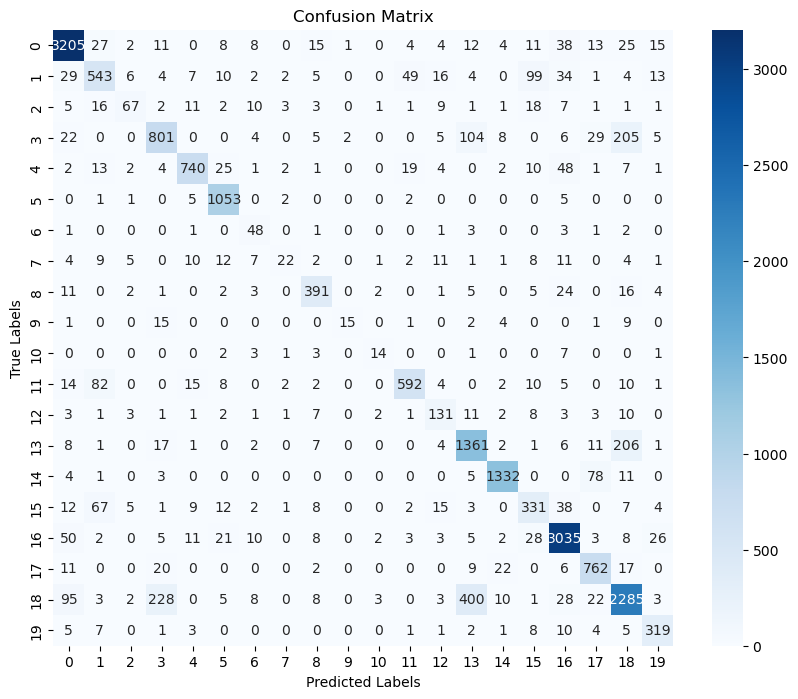

Epoch 21/50, Val Loss: 0.4673, Val Acc: 0.8391
Best model saved, Validation Accuracy: 0.8391
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_21.pth


Epoch 22/50, Train Loss: 0.3883, Train Acc: 0.8662
Epoch 22/50, Starting Validation...


F1 Score (Macro): 0.7393
F1 Score (Weighted): 0.8540
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3403
           1       0.67      0.77      0.72       828
           2       0.76      0.29      0.42       160
           3       0.74      0.69      0.71      1196
           4       0.91      0.87      0.89       882
           5       0.96      0.97      0.97      1069
           6       0.80      0.64      0.71        61
           7       0.57      0.30      0.39       111
           8       0.83      0.80      0.81       467
           9       0.88      0.15      0.25        48
          10       0.68      0.47      0.56        32
          11       0.86      0.81      0.84       747
          12       0.80      0.63      0.70       191
          13       0.78      0.77      0.78      1628
          14       0.96      0.92      0.94      1434
          15       0.61      0.70      0.65       517
          16       0.94     

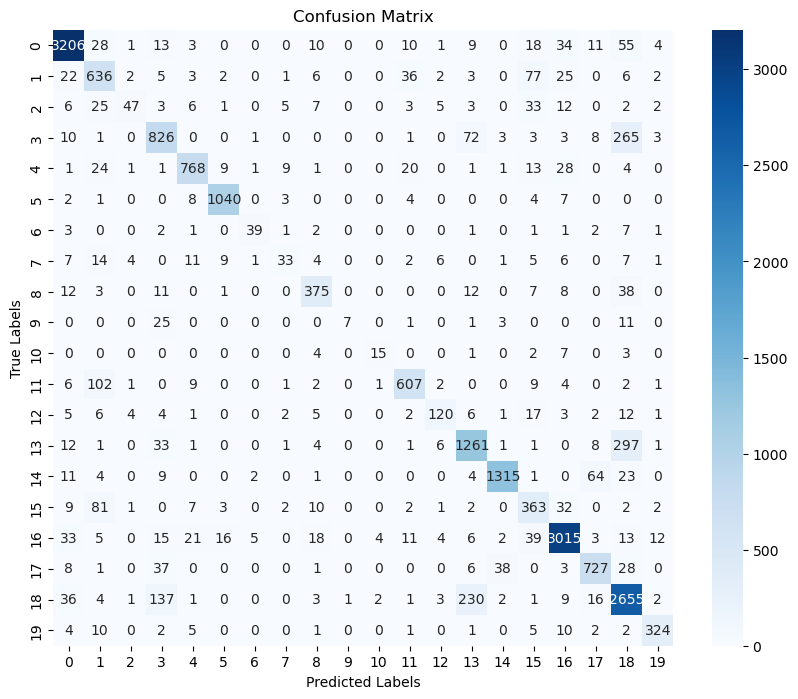

Epoch 22/50, Val Loss: 0.4345, Val Acc: 0.8554
Best model saved, Validation Accuracy: 0.8554
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_22.pth


Epoch 23/50, Train Loss: 0.3672, Train Acc: 0.8734
Epoch 23/50, Starting Validation...


F1 Score (Macro): 0.7567
F1 Score (Weighted): 0.8582
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      3403
           1       0.64      0.78      0.71       828
           2       0.76      0.38      0.51       160
           3       0.70      0.74      0.72      1196
           4       0.85      0.90      0.87       882
           5       0.98      0.96      0.97      1069
           6       0.77      0.75      0.76        61
           7       0.66      0.38      0.48       111
           8       0.92      0.81      0.86       467
           9       0.92      0.23      0.37        48
          10       0.56      0.44      0.49        32
          11       0.88      0.79      0.83       747
          12       0.77      0.70      0.74       191
          13       0.82      0.77      0.79      1628
          14       0.96      0.95      0.95      1434
          15       0.72      0.56      0.63       517
          16       0.94     

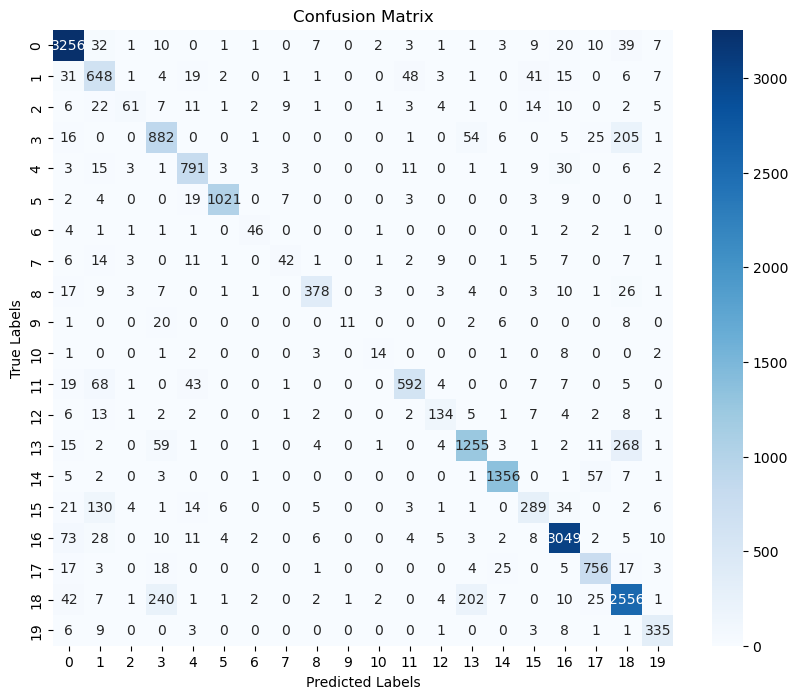

Epoch 23/50, Val Loss: 0.4245, Val Acc: 0.8600
Best model saved, Validation Accuracy: 0.8600
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_23.pth


Epoch 24/50, Train Loss: 0.3538, Train Acc: 0.8771
Epoch 24/50, Starting Validation...


F1 Score (Macro): 0.7699
F1 Score (Weighted): 0.8597
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      3403
           1       0.76      0.68      0.72       828
           2       0.60      0.44      0.51       160
           3       0.71      0.73      0.72      1196
           4       0.88      0.89      0.89       882
           5       0.96      0.98      0.97      1069
           6       0.84      0.59      0.69        61
           7       0.63      0.40      0.49       111
           8       0.75      0.92      0.83       467
           9       0.88      0.31      0.46        48
          10       0.83      0.59      0.69        32
          11       0.80      0.92      0.86       747
          12       0.83      0.68      0.75       191
          13       0.85      0.69      0.76      1628
          14       0.97      0.94      0.96      1434
          15       0.67      0.65      0.66       517
          16       0.93     

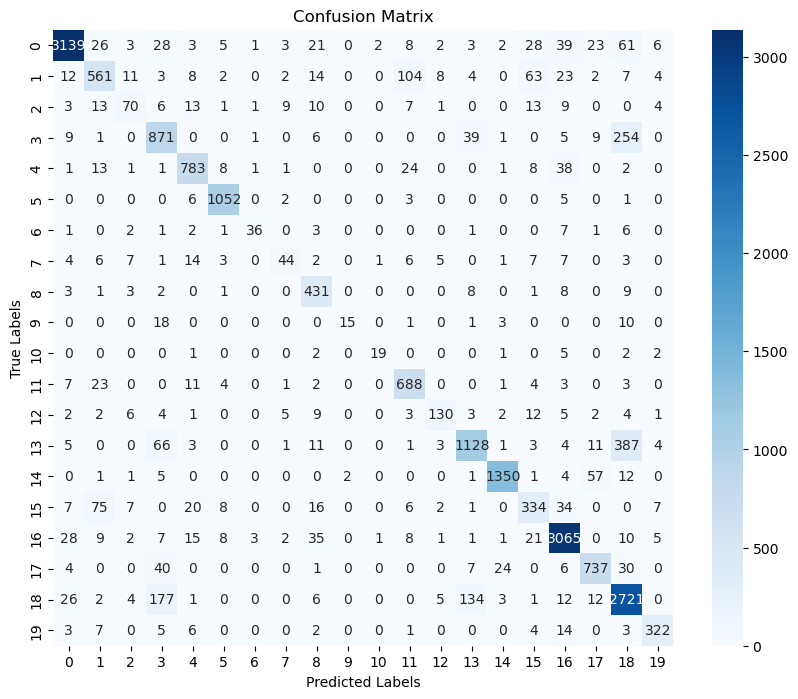

Epoch 24/50, Val Loss: 0.4149, Val Acc: 0.8612
Best model saved, Validation Accuracy: 0.8612
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_24.pth


Epoch 25/50, Train Loss: 0.3284, Train Acc: 0.8869
Epoch 25/50, Starting Validation...


F1 Score (Macro): 0.7698
F1 Score (Weighted): 0.8649
              precision    recall  f1-score   support

           0       0.93      0.96      0.95      3403
           1       0.70      0.75      0.72       828
           2       0.80      0.41      0.55       160
           3       0.82      0.67      0.73      1196
           4       0.90      0.92      0.91       882
           5       0.97      0.97      0.97      1069
           6       0.89      0.56      0.69        61
           7       0.71      0.36      0.48       111
           8       0.86      0.88      0.87       467
           9       1.00      0.27      0.43        48
          10       0.88      0.44      0.58        32
          11       0.89      0.81      0.85       747
          12       0.84      0.72      0.78       191
          13       0.85      0.68      0.75      1628
          14       0.97      0.95      0.96      1434
          15       0.61      0.71      0.66       517
          16       0.95     

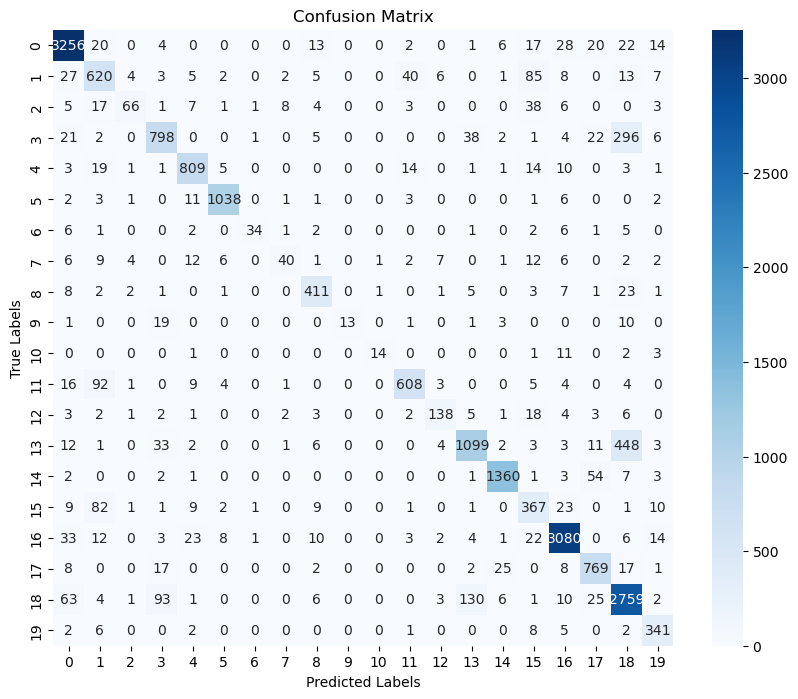

Epoch 25/50, Val Loss: 0.3960, Val Acc: 0.8673
Best model saved, Validation Accuracy: 0.8673
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_25.pth


Epoch 26/50, Train Loss: 0.3136, Train Acc: 0.8917
Epoch 26/50, Starting Validation...


F1 Score (Macro): 0.7676
F1 Score (Weighted): 0.8672
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      3403
           1       0.67      0.84      0.75       828
           2       0.89      0.39      0.54       160
           3       0.67      0.78      0.72      1196
           4       0.90      0.91      0.90       882
           5       0.98      0.98      0.98      1069
           6       0.73      0.74      0.73        61
           7       0.89      0.28      0.42       111
           8       0.90      0.87      0.88       467
           9       0.81      0.27      0.41        48
          10       0.76      0.41      0.53        32
          11       0.87      0.85      0.86       747
          12       0.68      0.76      0.72       191
          13       0.75      0.85      0.79      1628
          14       0.98      0.95      0.96      1434
          15       0.69      0.62      0.66       517
          16       0.94     

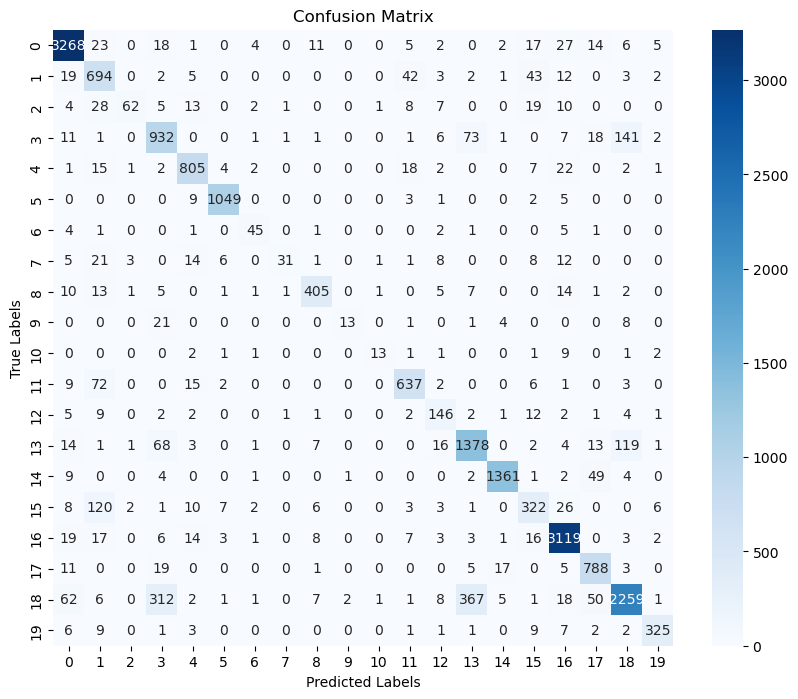

Epoch 26/50, Val Loss: 0.3943, Val Acc: 0.8689
Best model saved, Validation Accuracy: 0.8689
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_26.pth


Epoch 27/50, Train Loss: 0.2909, Train Acc: 0.8990
Epoch 27/50, Starting Validation...


F1 Score (Macro): 0.7815
F1 Score (Weighted): 0.8743
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      3403
           1       0.65      0.81      0.72       828
           2       0.74      0.49      0.59       160
           3       0.84      0.68      0.75      1196
           4       0.83      0.96      0.89       882
           5       0.95      0.98      0.97      1069
           6       0.81      0.70      0.75        61
           7       0.69      0.39      0.50       111
           8       0.87      0.88      0.87       467
           9       0.54      0.40      0.46        48
          10       0.67      0.56      0.61        32
          11       0.90      0.81      0.86       747
          12       0.65      0.79      0.71       191
          13       0.82      0.80      0.81      1628
          14       0.95      0.96      0.96      1434
          15       0.65      0.67      0.66       517
          16       0.96     

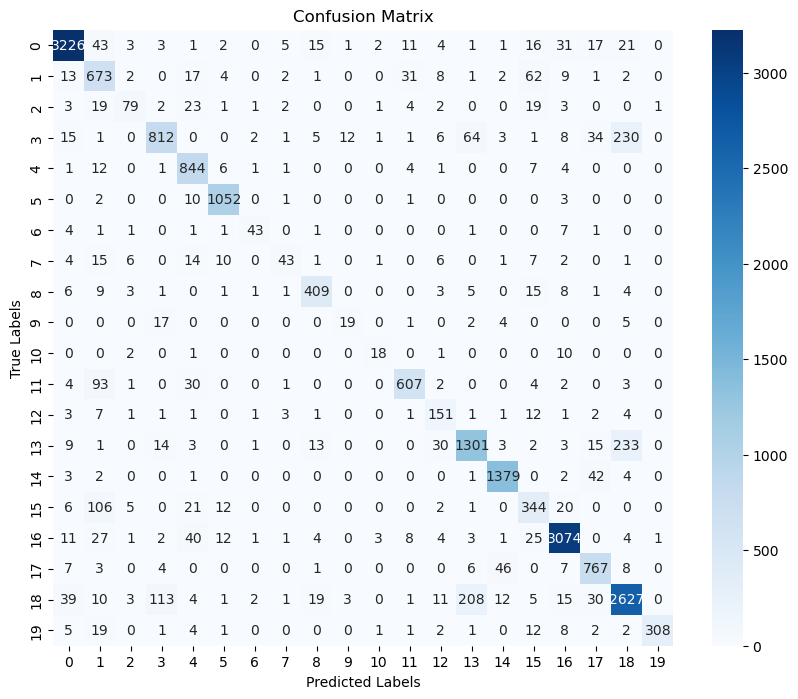

Epoch 27/50, Val Loss: 0.3869, Val Acc: 0.8750
Best model saved, Validation Accuracy: 0.8750
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_27.pth


Epoch 28/50, Train Loss: 0.2762, Train Acc: 0.9037
Epoch 28/50, Starting Validation...


F1 Score (Macro): 0.7892
F1 Score (Weighted): 0.8754
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3403
           1       0.83      0.65      0.73       828
           2       0.67      0.52      0.58       160
           3       0.78      0.71      0.74      1196
           4       0.91      0.91      0.91       882
           5       0.97      0.98      0.98      1069
           6       0.67      0.75      0.71        61
           7       0.60      0.46      0.52       111
           8       0.87      0.90      0.89       467
           9       0.51      0.50      0.51        48
          10       0.56      0.75      0.64        32
          11       0.82      0.95      0.88       747
          12       0.72      0.76      0.74       191
          13       0.86      0.73      0.79      1628
          14       0.97      0.94      0.95      1434
          15       0.69      0.65      0.67       517
          16       0.96     

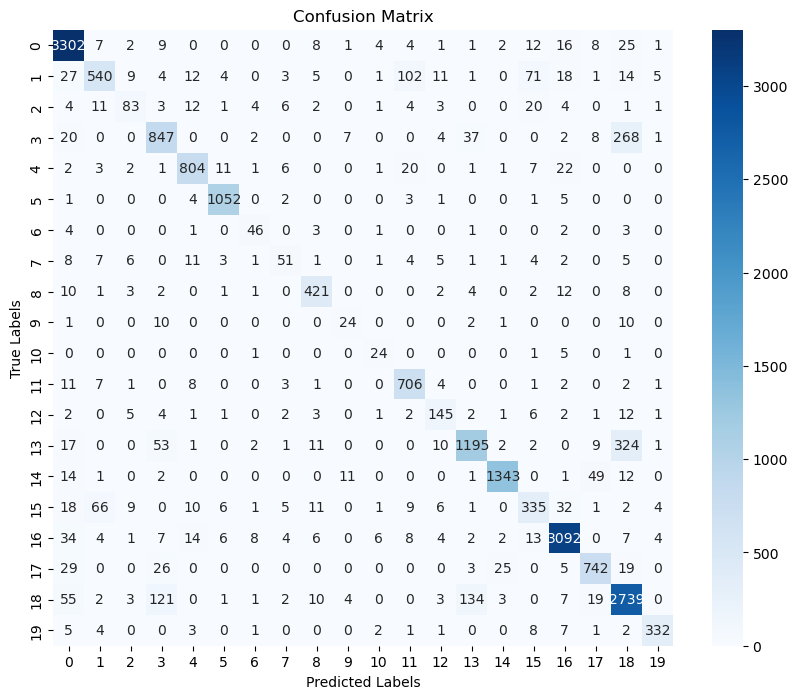

Epoch 28/50, Val Loss: 0.3672, Val Acc: 0.8773
Best model saved, Validation Accuracy: 0.8773
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_28.pth


Epoch 29/50, Train Loss: 0.2585, Train Acc: 0.9111
Epoch 29/50, Starting Validation...


F1 Score (Macro): 0.8041
F1 Score (Weighted): 0.8848
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3403
           1       0.71      0.79      0.75       828
           2       0.70      0.63      0.66       160
           3       0.80      0.71      0.75      1196
           4       0.91      0.92      0.92       882
           5       0.98      0.98      0.98      1069
           6       0.81      0.75      0.78        61
           7       0.72      0.38      0.50       111
           8       0.91      0.90      0.91       467
           9       0.76      0.46      0.57        48
          10       0.62      0.56      0.59        32
          11       0.91      0.85      0.88       747
          12       0.84      0.73      0.78       191
          13       0.81      0.81      0.81      1628
          14       0.97      0.95      0.96      1434
          15       0.68      0.67      0.67       517
          16       0.94     

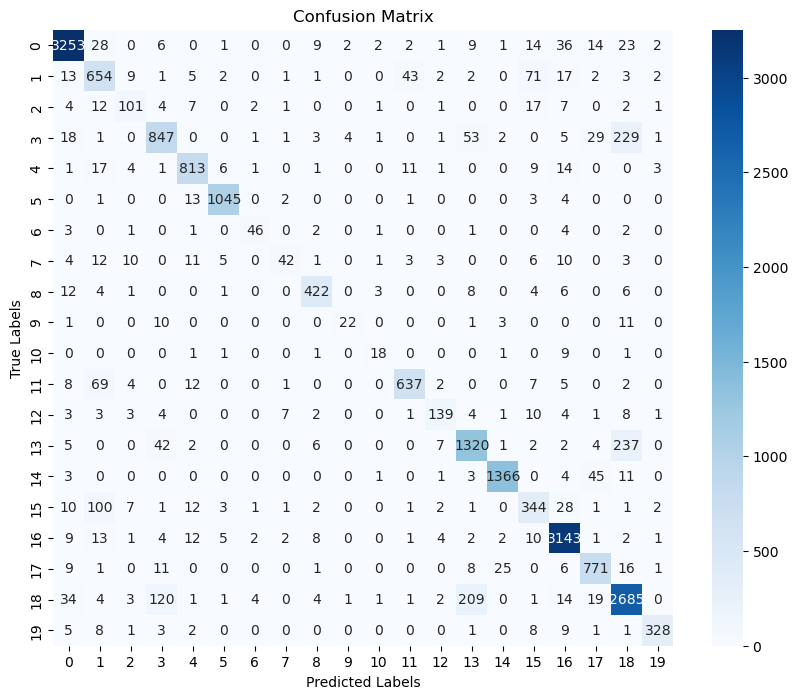

Epoch 29/50, Val Loss: 0.3545, Val Acc: 0.8858
Best model saved, Validation Accuracy: 0.8858
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_29.pth


Epoch 30/50, Train Loss: 0.2399, Train Acc: 0.9175
Epoch 30/50, Starting Validation...


F1 Score (Macro): 0.8089
F1 Score (Weighted): 0.8860
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      3403
           1       0.78      0.68      0.73       828
           2       0.70      0.51      0.59       160
           3       0.75      0.79      0.77      1196
           4       0.92      0.91      0.92       882
           5       0.96      0.98      0.97      1069
           6       0.79      0.75      0.77        61
           7       0.62      0.58      0.60       111
           8       0.89      0.93      0.91       467
           9       1.00      0.35      0.52        48
          10       0.84      0.66      0.74        32
          11       0.86      0.89      0.88       747
          12       0.67      0.80      0.73       191
          13       0.81      0.83      0.82      1628
          14       0.97      0.96      0.96      1434
          15       0.64      0.73      0.68       517
          16       0.97     

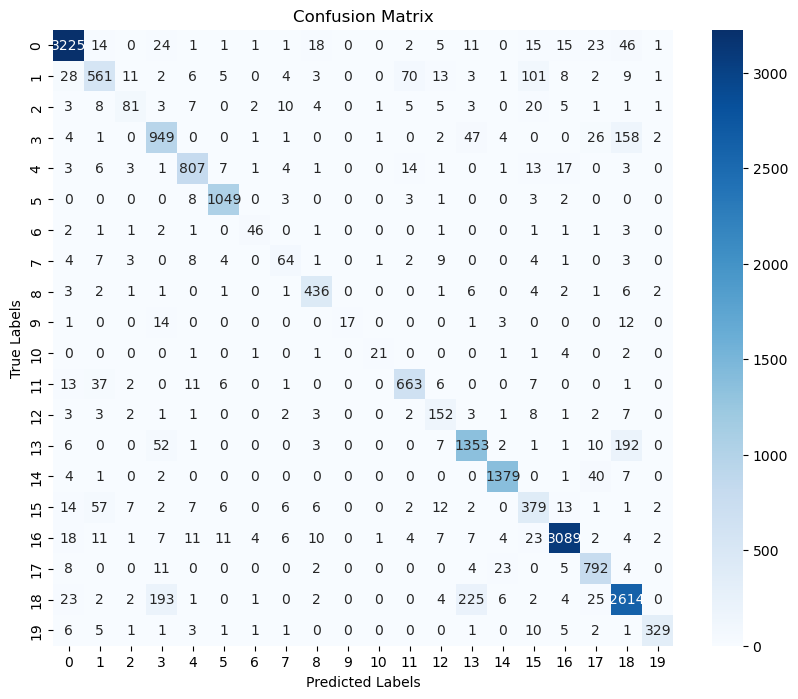

Epoch 30/50, Val Loss: 0.3603, Val Acc: 0.8863
Best model saved, Validation Accuracy: 0.8863
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_30.pth


Epoch 31/50, Train Loss: 0.2254, Train Acc: 0.9214
Epoch 31/50, Starting Validation...


F1 Score (Macro): 0.7928
F1 Score (Weighted): 0.8828
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3403
           1       0.65      0.83      0.73       828
           2       0.67      0.49      0.57       160
           3       0.77      0.76      0.77      1196
           4       0.93      0.92      0.92       882
           5       0.95      0.99      0.97      1069
           6       0.84      0.69      0.76        61
           7       0.53      0.54      0.54       111
           8       0.91      0.90      0.90       467
           9       0.73      0.46      0.56        48
          10       0.86      0.38      0.52        32
          11       0.91      0.82      0.86       747
          12       0.93      0.64      0.76       191
          13       0.80      0.86      0.83      1628
          14       0.95      0.97      0.96      1434
          15       0.74      0.59      0.66       517
          16       0.97     

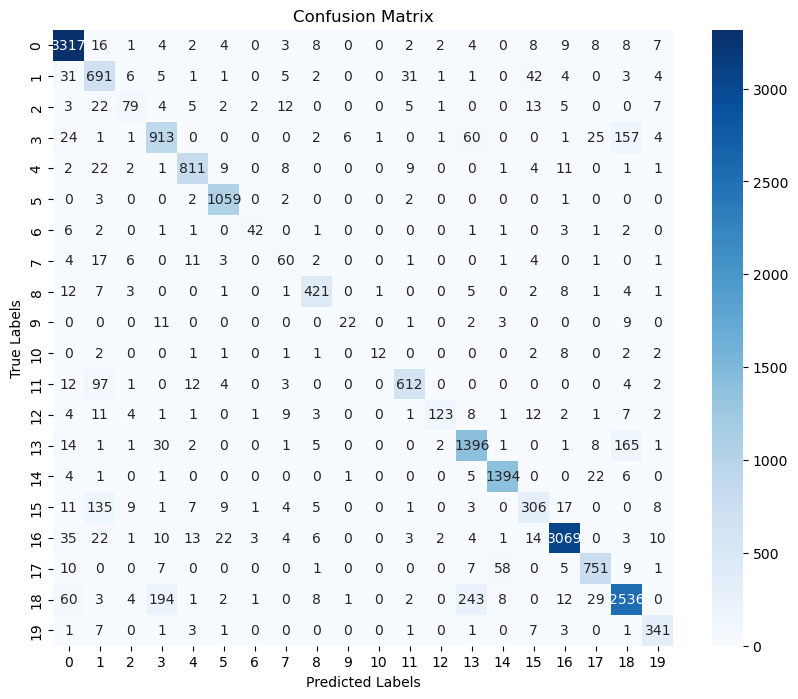

Epoch 31/50, Val Loss: 0.3601, Val Acc: 0.8838
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_31.pth


Epoch 32/50, Train Loss: 0.2104, Train Acc: 0.9266
Epoch 32/50, Starting Validation...


F1 Score (Macro): 0.8063
F1 Score (Weighted): 0.8847
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      3403
           1       0.74      0.69      0.71       828
           2       0.62      0.49      0.55       160
           3       0.80      0.71      0.76      1196
           4       0.92      0.91      0.92       882
           5       0.96      0.99      0.97      1069
           6       0.82      0.77      0.80        61
           7       0.84      0.46      0.59       111
           8       0.92      0.90      0.91       467
           9       0.66      0.44      0.53        48
          10       0.83      0.62      0.71        32
          11       0.86      0.90      0.88       747
          12       0.76      0.77      0.77       191
          13       0.84      0.82      0.83      1628
          14       0.98      0.95      0.97      1434
          15       0.62      0.76      0.68       517
          16       0.95     

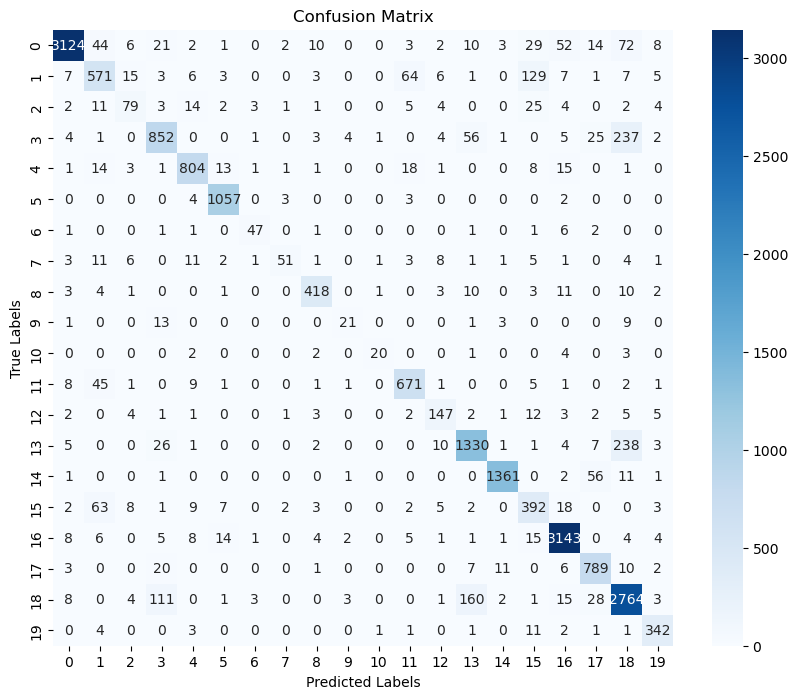

Epoch 32/50, Val Loss: 0.3683, Val Acc: 0.8852
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_32.pth


Epoch 33/50, Train Loss: 0.1941, Train Acc: 0.9321
Epoch 33/50, Starting Validation...


F1 Score (Macro): 0.8085
F1 Score (Weighted): 0.8926
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3403
           1       0.72      0.78      0.75       828
           2       0.54      0.62      0.58       160
           3       0.78      0.78      0.78      1196
           4       0.96      0.88      0.92       882
           5       0.99      0.97      0.98      1069
           6       0.90      0.72      0.80        61
           7       0.71      0.54      0.61       111
           8       0.84      0.93      0.88       467
           9       0.64      0.44      0.52        48
          10       0.63      0.59      0.61        32
          11       0.85      0.90      0.87       747
          12       0.84      0.70      0.77       191
          13       0.85      0.82      0.84      1628
          14       0.96      0.97      0.97      1434
          15       0.69      0.67      0.68       517
          16       0.97     

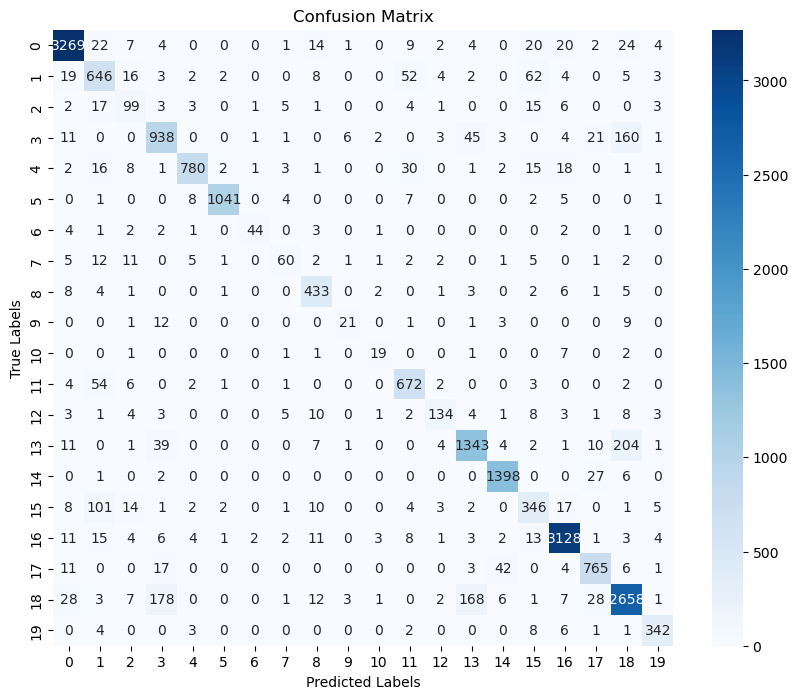

Epoch 33/50, Val Loss: 0.3397, Val Acc: 0.8927
Best model saved, Validation Accuracy: 0.8927
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_33.pth


Epoch 34/50, Train Loss: 0.1761, Train Acc: 0.9390
Epoch 34/50, Starting Validation...


F1 Score (Macro): 0.8226
F1 Score (Weighted): 0.8942
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3403
           1       0.72      0.82      0.77       828
           2       0.72      0.49      0.58       160
           3       0.76      0.79      0.78      1196
           4       0.93      0.93      0.93       882
           5       0.96      0.99      0.98      1069
           6       0.84      0.79      0.81        61
           7       0.65      0.61      0.63       111
           8       0.92      0.89      0.91       467
           9       0.75      0.50      0.60        48
          10       0.81      0.66      0.72        32
          11       0.94      0.81      0.87       747
          12       0.74      0.76      0.75       191
          13       0.81      0.87      0.84      1628
          14       0.97      0.96      0.97      1434
          15       0.68      0.71      0.69       517
          16       0.97     

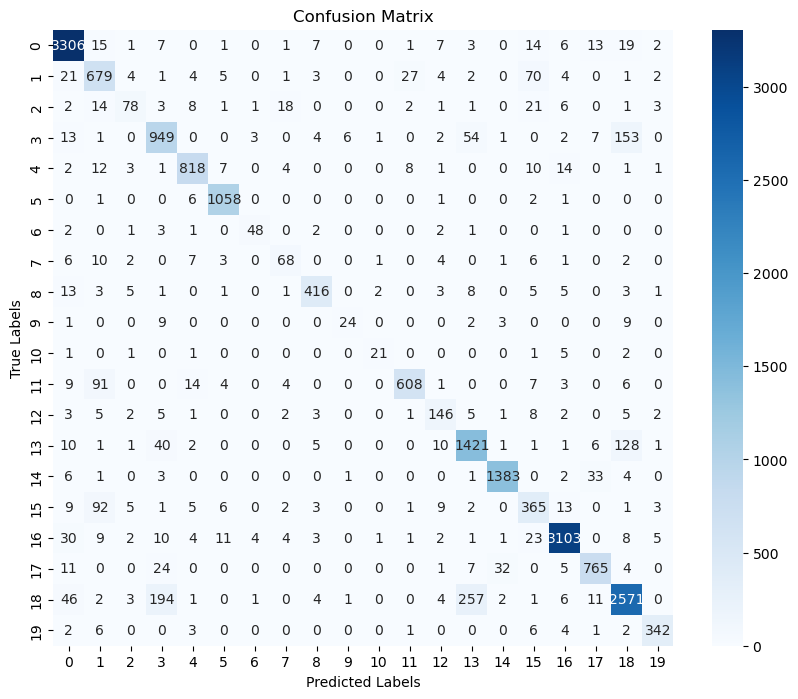

Epoch 34/50, Val Loss: 0.3373, Val Acc: 0.8943
Best model saved, Validation Accuracy: 0.8943
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_34.pth


Epoch 35/50, Train Loss: 0.1630, Train Acc: 0.9427
Epoch 35/50, Starting Validation...


F1 Score (Macro): 0.8158
F1 Score (Weighted): 0.8940
              precision    recall  f1-score   support

           0       0.95      0.96      0.96      3403
           1       0.78      0.69      0.73       828
           2       0.63      0.61      0.62       160
           3       0.79      0.77      0.78      1196
           4       0.91      0.94      0.93       882
           5       0.98      0.98      0.98      1069
           6       0.92      0.77      0.84        61
           7       0.86      0.46      0.60       111
           8       0.89      0.93      0.91       467
           9       0.45      0.52      0.48        48
          10       0.68      0.66      0.67        32
          11       0.89      0.87      0.88       747
          12       0.83      0.74      0.78       191
          13       0.80      0.88      0.84      1628
          14       0.97      0.97      0.97      1434
          15       0.64      0.73      0.68       517
          16       0.96     

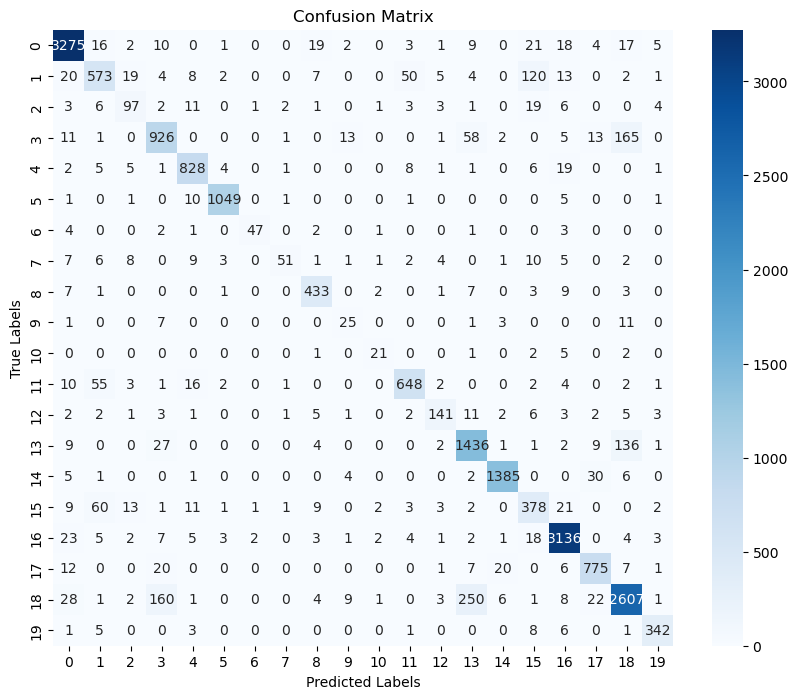

Epoch 35/50, Val Loss: 0.3392, Val Acc: 0.8945
Best model saved, Validation Accuracy: 0.8945
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_35.pth


Epoch 36/50, Train Loss: 0.1514, Train Acc: 0.9472
Epoch 36/50, Starting Validation...


F1 Score (Macro): 0.8217
F1 Score (Weighted): 0.8982
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.78      0.72      0.75       828
           2       0.77      0.50      0.61       160
           3       0.77      0.79      0.78      1196
           4       0.91      0.95      0.93       882
           5       0.98      0.98      0.98      1069
           6       0.78      0.82      0.80        61
           7       0.72      0.50      0.59       111
           8       0.93      0.90      0.91       467
           9       0.81      0.44      0.57        48
          10       0.83      0.62      0.71        32
          11       0.89      0.89      0.89       747
          12       0.75      0.80      0.77       191
          13       0.81      0.89      0.85      1628
          14       0.97      0.97      0.97      1434
          15       0.66      0.74      0.70       517
          16       0.97     

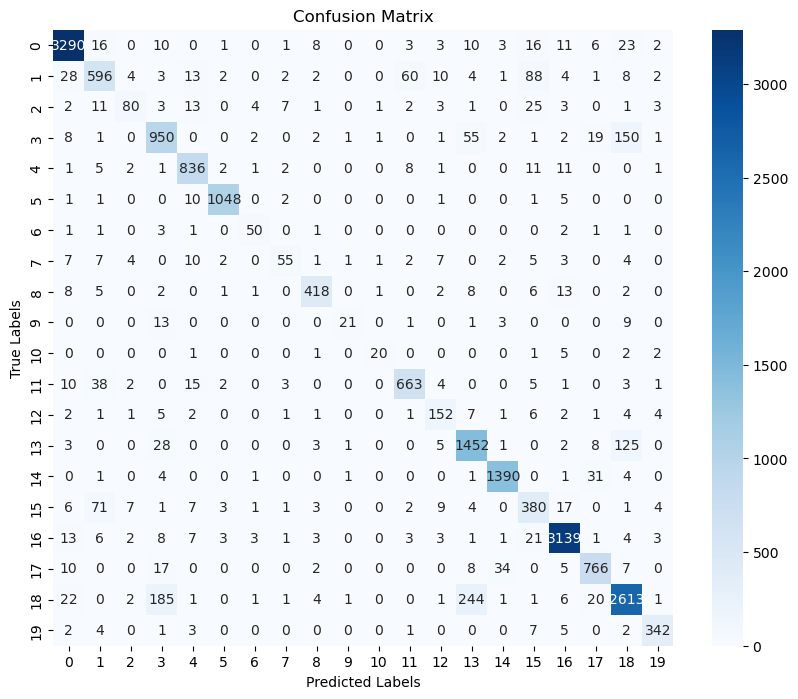

Epoch 36/50, Val Loss: 0.3382, Val Acc: 0.8988
Best model saved, Validation Accuracy: 0.8988
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_36.pth


Epoch 37/50, Train Loss: 0.1377, Train Acc: 0.9517
Epoch 37/50, Starting Validation...


F1 Score (Macro): 0.8301
F1 Score (Weighted): 0.8994
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3403
           1       0.76      0.77      0.77       828
           2       0.66      0.62      0.64       160
           3       0.78      0.80      0.79      1196
           4       0.93      0.93      0.93       882
           5       0.99      0.98      0.98      1069
           6       0.89      0.82      0.85        61
           7       0.74      0.58      0.65       111
           8       0.90      0.91      0.90       467
           9       0.75      0.44      0.55        48
          10       0.76      0.69      0.72        32
          11       0.89      0.88      0.88       747
          12       0.82      0.79      0.80       191
          13       0.82      0.87      0.85      1628
          14       0.96      0.97      0.97      1434
          15       0.72      0.71      0.71       517
          16       0.97     

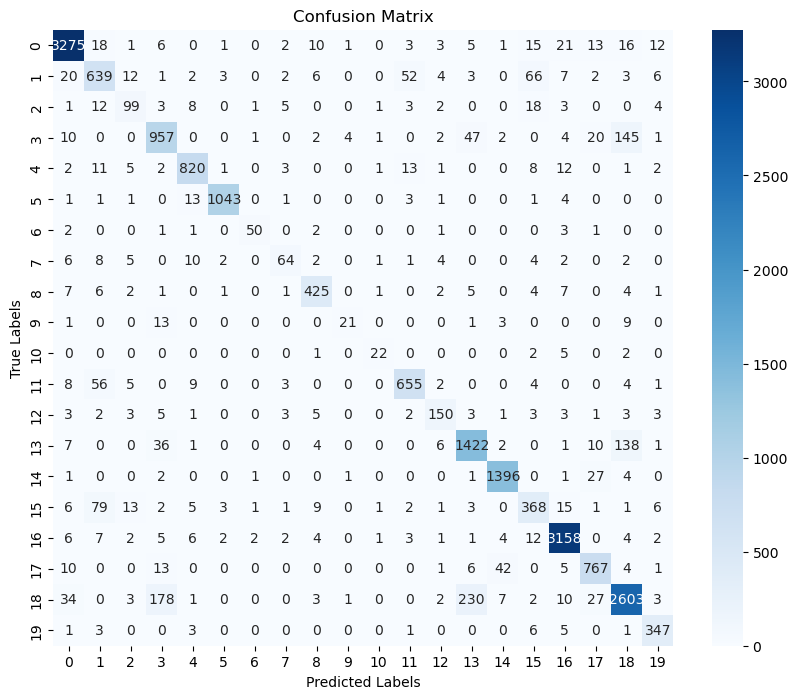

Epoch 37/50, Val Loss: 0.3444, Val Acc: 0.8998
Best model saved, Validation Accuracy: 0.8998
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_37.pth


Epoch 38/50, Train Loss: 0.1288, Train Acc: 0.9559
Epoch 38/50, Starting Validation...


F1 Score (Macro): 0.8265
F1 Score (Weighted): 0.9006
              precision    recall  f1-score   support

           0       0.95      0.98      0.96      3403
           1       0.76      0.76      0.76       828
           2       0.69      0.56      0.62       160
           3       0.80      0.79      0.80      1196
           4       0.94      0.93      0.93       882
           5       0.97      0.99      0.98      1069
           6       0.85      0.77      0.81        61
           7       0.65      0.58      0.61       111
           8       0.91      0.90      0.91       467
           9       0.68      0.48      0.56        48
          10       0.71      0.69      0.70        32
          11       0.90      0.88      0.89       747
          12       0.87      0.74      0.80       191
          13       0.83      0.86      0.85      1628
          14       0.96      0.97      0.96      1434
          15       0.72      0.69      0.71       517
          16       0.96     

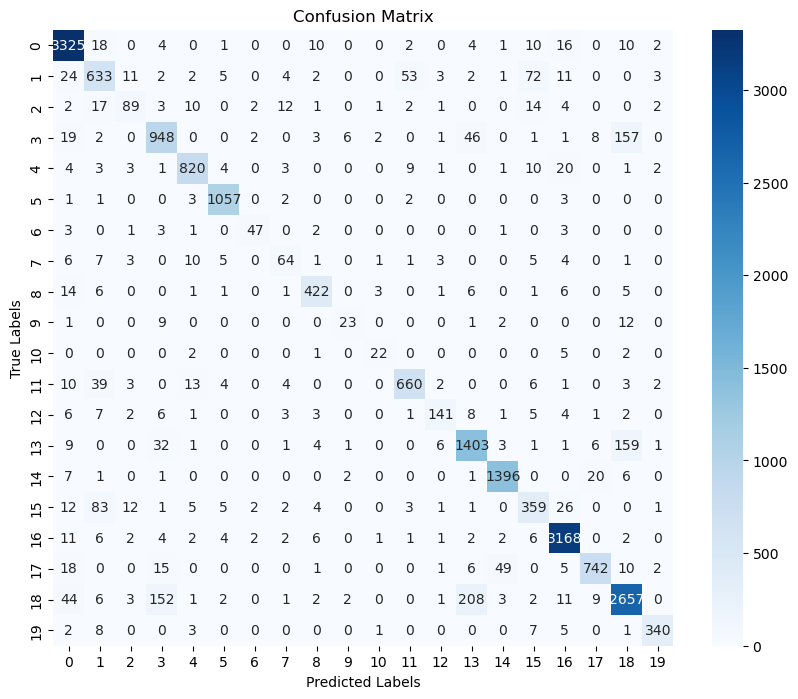

Epoch 38/50, Val Loss: 0.3396, Val Acc: 0.9016
Best model saved, Validation Accuracy: 0.9016
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_38.pth


Epoch 39/50, Train Loss: 0.1176, Train Acc: 0.9593
Epoch 39/50, Starting Validation...


F1 Score (Macro): 0.8316
F1 Score (Weighted): 0.9040
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.77      0.76      0.77       828
           2       0.74      0.56      0.64       160
           3       0.79      0.80      0.79      1196
           4       0.94      0.94      0.94       882
           5       0.98      0.98      0.98      1069
           6       0.85      0.77      0.81        61
           7       0.73      0.59      0.65       111
           8       0.92      0.92      0.92       467
           9       0.70      0.40      0.51        48
          10       0.79      0.69      0.73        32
          11       0.90      0.88      0.89       747
          12       0.86      0.75      0.80       191
          13       0.82      0.87      0.84      1628
          14       0.97      0.97      0.97      1434
          15       0.71      0.74      0.72       517
          16       0.97     

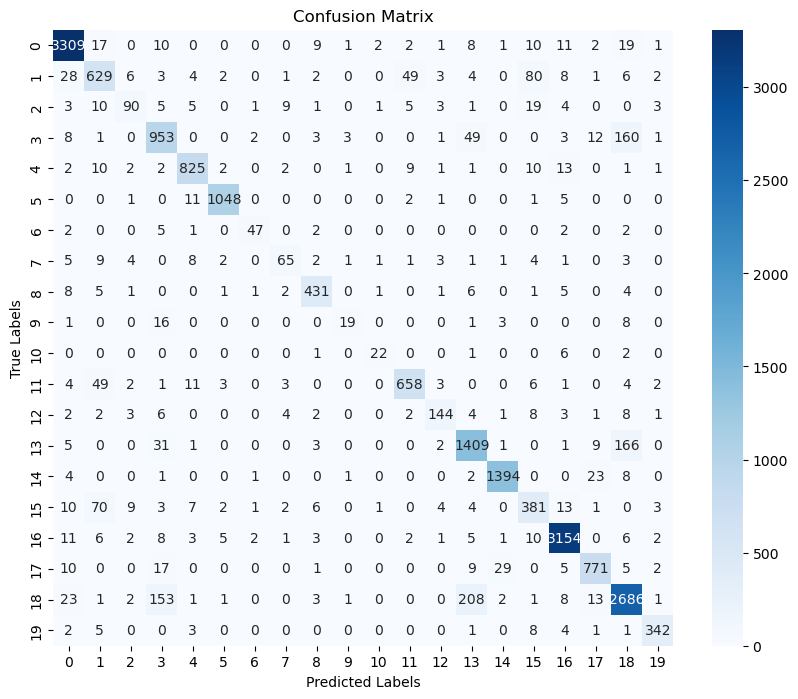

Epoch 39/50, Val Loss: 0.3346, Val Acc: 0.9046
Best model saved, Validation Accuracy: 0.9046
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_39.pth


Epoch 40/50, Train Loss: 0.1066, Train Acc: 0.9626
Epoch 40/50, Starting Validation...


F1 Score (Macro): 0.8335
F1 Score (Weighted): 0.9029
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3403
           1       0.76      0.79      0.78       828
           2       0.66      0.61      0.63       160
           3       0.78      0.79      0.79      1196
           4       0.94      0.94      0.94       882
           5       0.98      0.99      0.99      1069
           6       0.87      0.75      0.81        61
           7       0.75      0.59      0.66       111
           8       0.92      0.92      0.92       467
           9       0.72      0.48      0.57        48
          10       0.77      0.62      0.69        32
          11       0.91      0.87      0.89       747
          12       0.84      0.81      0.82       191
          13       0.88      0.80      0.84      1628
          14       0.97      0.97      0.97      1434
          15       0.70      0.74      0.72       517
          16       0.97     

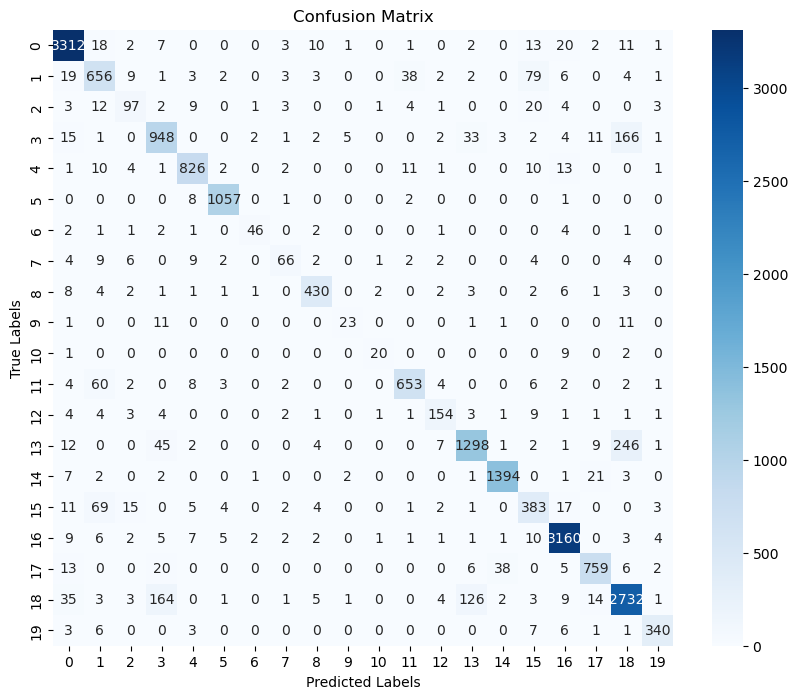

Epoch 40/50, Val Loss: 0.3411, Val Acc: 0.9034
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_40.pth


Epoch 41/50, Train Loss: 0.0982, Train Acc: 0.9658
Epoch 41/50, Starting Validation...


F1 Score (Macro): 0.8391
F1 Score (Weighted): 0.9069
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      3403
           1       0.78      0.79      0.78       828
           2       0.69      0.62      0.66       160
           3       0.80      0.79      0.79      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.99      0.99      1069
           6       0.88      0.74      0.80        61
           7       0.74      0.60      0.66       111
           8       0.93      0.93      0.93       467
           9       0.65      0.46      0.54        48
          10       0.80      0.75      0.77        32
          11       0.91      0.89      0.90       747
          12       0.87      0.76      0.81       191
          13       0.84      0.85      0.85      1628
          14       0.96      0.98      0.97      1434
          15       0.74      0.71      0.73       517
          16       0.97     

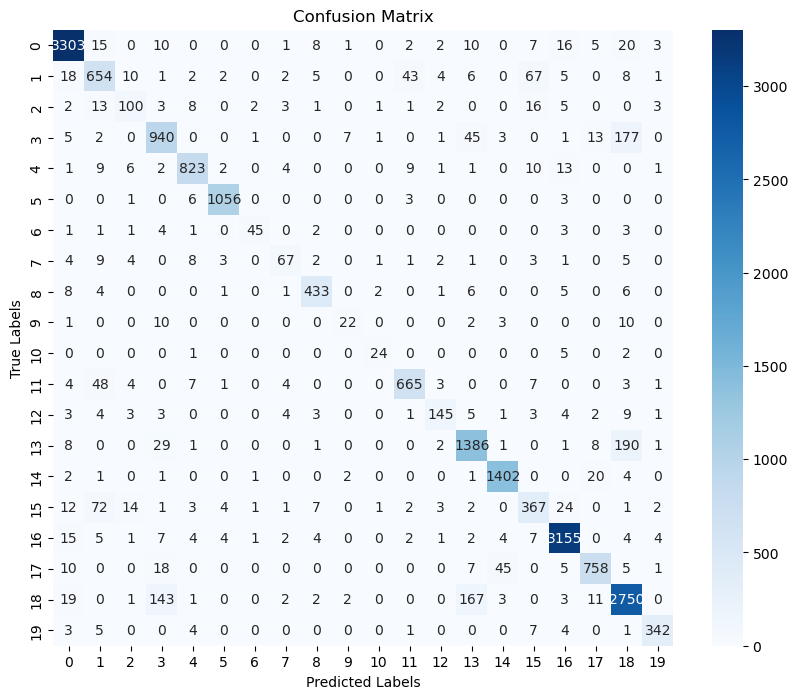

Epoch 41/50, Val Loss: 0.3378, Val Acc: 0.9075
Best model saved, Validation Accuracy: 0.9075
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_41.pth


Epoch 42/50, Train Loss: 0.0908, Train Acc: 0.9692
Epoch 42/50, Starting Validation...


F1 Score (Macro): 0.8391
F1 Score (Weighted): 0.9071
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      3403
           1       0.76      0.80      0.78       828
           2       0.72      0.61      0.66       160
           3       0.81      0.79      0.80      1196
           4       0.94      0.92      0.93       882
           5       0.98      0.99      0.98      1069
           6       0.88      0.74      0.80        61
           7       0.76      0.59      0.67       111
           8       0.91      0.92      0.91       467
           9       0.78      0.44      0.56        48
          10       0.80      0.75      0.77        32
          11       0.91      0.88      0.90       747
          12       0.81      0.81      0.81       191
          13       0.81      0.89      0.85      1628
          14       0.98      0.96      0.97      1434
          15       0.73      0.68      0.70       517
          16       0.97     

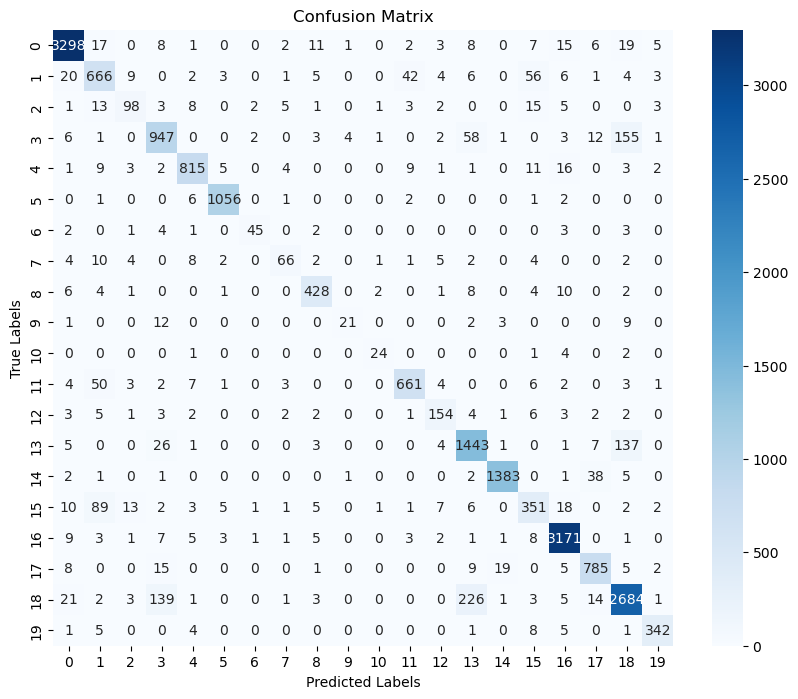

Epoch 42/50, Val Loss: 0.3450, Val Acc: 0.9076
Best model saved, Validation Accuracy: 0.9076
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_42.pth


Epoch 43/50, Train Loss: 0.0827, Train Acc: 0.9720
Epoch 43/50, Starting Validation...


F1 Score (Macro): 0.8393
F1 Score (Weighted): 0.9065
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      3403
           1       0.76      0.81      0.79       828
           2       0.70      0.56      0.62       160
           3       0.80      0.80      0.80      1196
           4       0.96      0.92      0.94       882
           5       0.98      0.99      0.98      1069
           6       0.85      0.75      0.80        61
           7       0.73      0.59      0.65       111
           8       0.93      0.93      0.93       467
           9       0.79      0.48      0.60        48
          10       0.82      0.72      0.77        32
          11       0.92      0.87      0.89       747
          12       0.86      0.80      0.83       191
          13       0.87      0.82      0.85      1628
          14       0.98      0.96      0.97      1434
          15       0.70      0.73      0.71       517
          16       0.97     

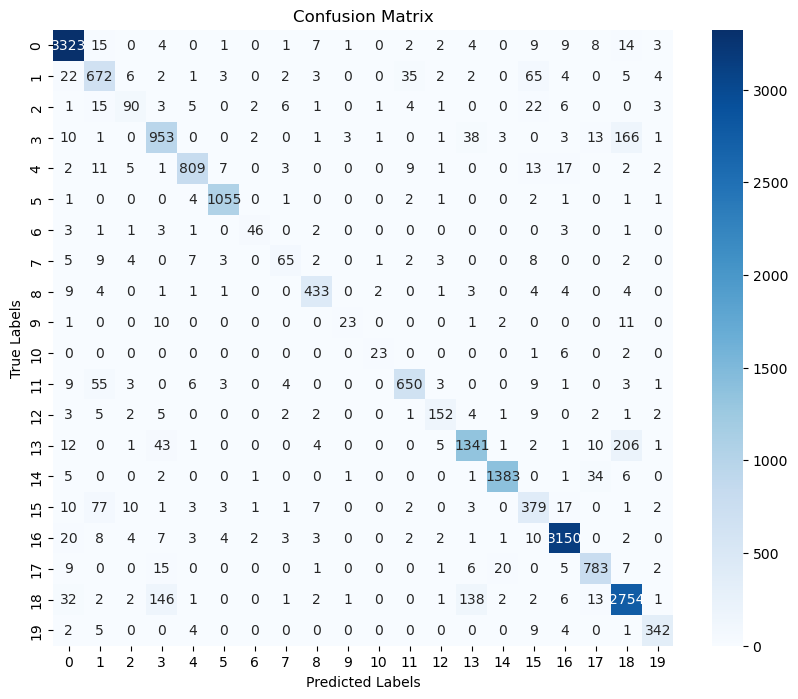

Epoch 43/50, Val Loss: 0.3495, Val Acc: 0.9070
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_43.pth


Epoch 44/50, Train Loss: 0.0794, Train Acc: 0.9725
Epoch 44/50, Starting Validation...


F1 Score (Macro): 0.8400
F1 Score (Weighted): 0.9057
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.75      0.82      0.79       828
           2       0.73      0.57      0.64       160
           3       0.80      0.80      0.80      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.99      0.98      1069
           6       0.83      0.79      0.81        61
           7       0.75      0.63      0.69       111
           8       0.91      0.93      0.92       467
           9       0.79      0.48      0.60        48
          10       0.74      0.78      0.76        32
          11       0.92      0.86      0.89       747
          12       0.84      0.78      0.81       191
          13       0.86      0.83      0.84      1628
          14       0.98      0.97      0.97      1434
          15       0.71      0.71      0.71       517
          16       0.98     

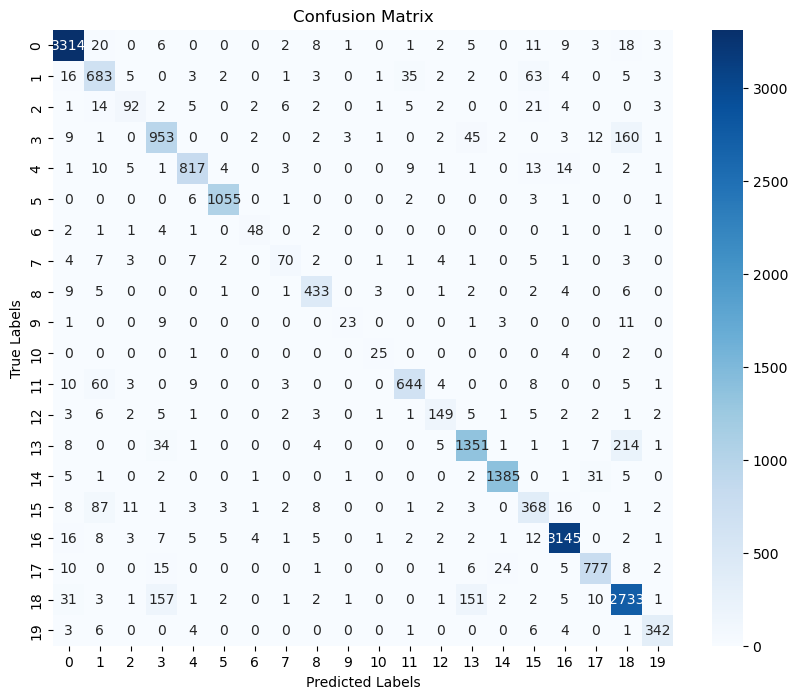

Epoch 44/50, Val Loss: 0.3527, Val Acc: 0.9060
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_44.pth


Epoch 45/50, Train Loss: 0.0742, Train Acc: 0.9746
Epoch 45/50, Starting Validation...


F1 Score (Macro): 0.8420
F1 Score (Weighted): 0.9082
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.77      0.81      0.79       828
           2       0.74      0.56      0.64       160
           3       0.79      0.81      0.80      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.99      0.99      1069
           6       0.89      0.79      0.83        61
           7       0.71      0.63      0.67       111
           8       0.92      0.93      0.92       467
           9       0.73      0.50      0.59        48
          10       0.71      0.78      0.75        32
          11       0.91      0.90      0.90       747
          12       0.84      0.77      0.80       191
          13       0.85      0.86      0.85      1628
          14       0.97      0.97      0.97      1434
          15       0.72      0.72      0.72       517
          16       0.97     

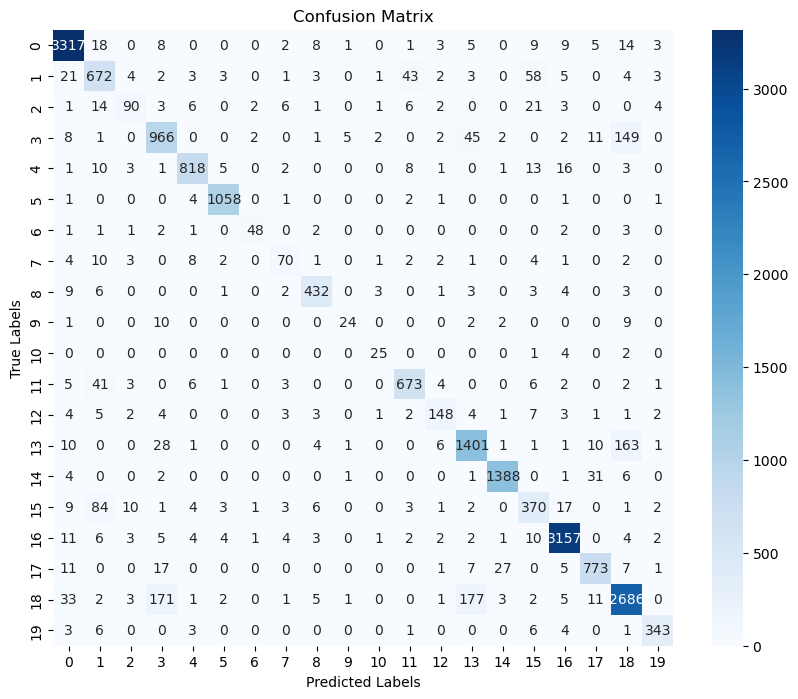

Epoch 45/50, Val Loss: 0.3453, Val Acc: 0.9086
Best model saved, Validation Accuracy: 0.9086
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_45.pth


Epoch 46/50, Train Loss: 0.0715, Train Acc: 0.9759
Epoch 46/50, Starting Validation...


F1 Score (Macro): 0.8454
F1 Score (Weighted): 0.9089
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.78      0.79      0.78       828
           2       0.71      0.61      0.65       160
           3       0.80      0.80      0.80      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.98      0.98      1069
           6       0.87      0.79      0.83        61
           7       0.84      0.63      0.72       111
           8       0.91      0.93      0.92       467
           9       0.73      0.46      0.56        48
          10       0.78      0.78      0.78        32
          11       0.92      0.89      0.90       747
          12       0.82      0.80      0.81       191
          13       0.85      0.87      0.86      1628
          14       0.98      0.97      0.97      1434
          15       0.70      0.74      0.72       517
          16       0.97     

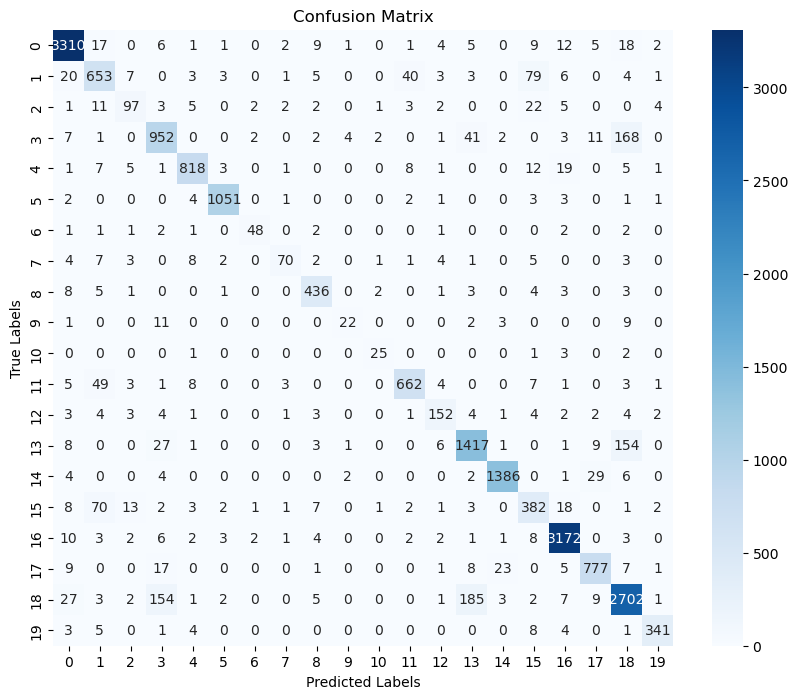

Epoch 46/50, Val Loss: 0.3478, Val Acc: 0.9093
Best model saved, Validation Accuracy: 0.9093
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_46.pth


Epoch 47/50, Train Loss: 0.0664, Train Acc: 0.9776
Epoch 47/50, Starting Validation...


F1 Score (Macro): 0.8393
F1 Score (Weighted): 0.9074
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.78      0.80      0.79       828
           2       0.71      0.60      0.65       160
           3       0.78      0.81      0.79      1196
           4       0.95      0.92      0.94       882
           5       0.98      0.98      0.98      1069
           6       0.87      0.75      0.81        61
           7       0.82      0.57      0.67       111
           8       0.91      0.91      0.91       467
           9       0.73      0.46      0.56        48
          10       0.74      0.78      0.76        32
          11       0.91      0.89      0.90       747
          12       0.83      0.78      0.80       191
          13       0.86      0.85      0.86      1628
          14       0.97      0.97      0.97      1434
          15       0.71      0.74      0.72       517
          16       0.97     

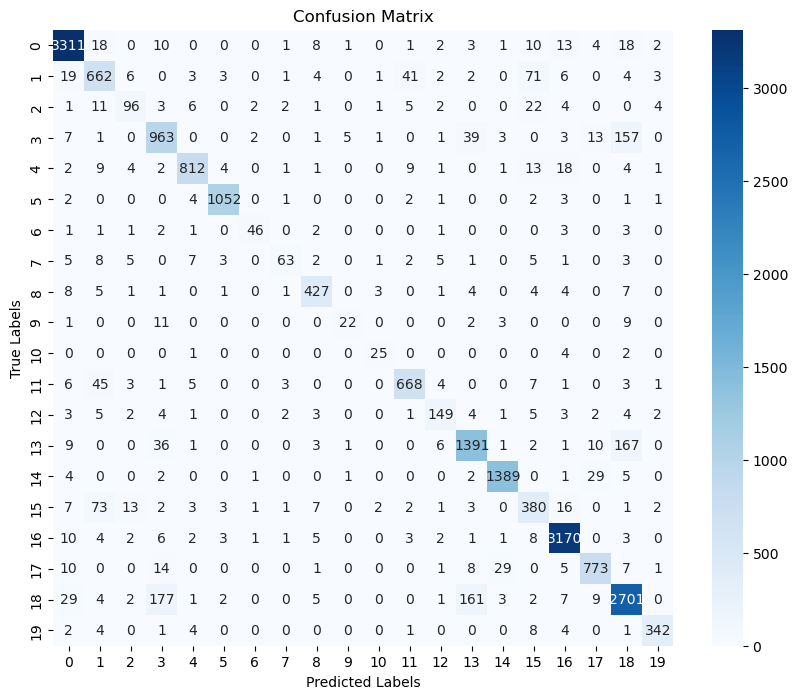

Epoch 47/50, Val Loss: 0.3532, Val Acc: 0.9078
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_47.pth


Epoch 48/50, Train Loss: 0.0654, Train Acc: 0.9783
Epoch 48/50, Starting Validation...


F1 Score (Macro): 0.8437
F1 Score (Weighted): 0.9080
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.78      0.80      0.79       828
           2       0.70      0.59      0.64       160
           3       0.79      0.80      0.80      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.99      0.98      1069
           6       0.89      0.79      0.83        61
           7       0.83      0.61      0.70       111
           8       0.91      0.93      0.92       467
           9       0.71      0.46      0.56        48
          10       0.78      0.78      0.78        32
          11       0.91      0.90      0.90       747
          12       0.85      0.77      0.81       191
          13       0.84      0.87      0.86      1628
          14       0.97      0.97      0.97      1434
          15       0.71      0.71      0.71       517
          16       0.97     

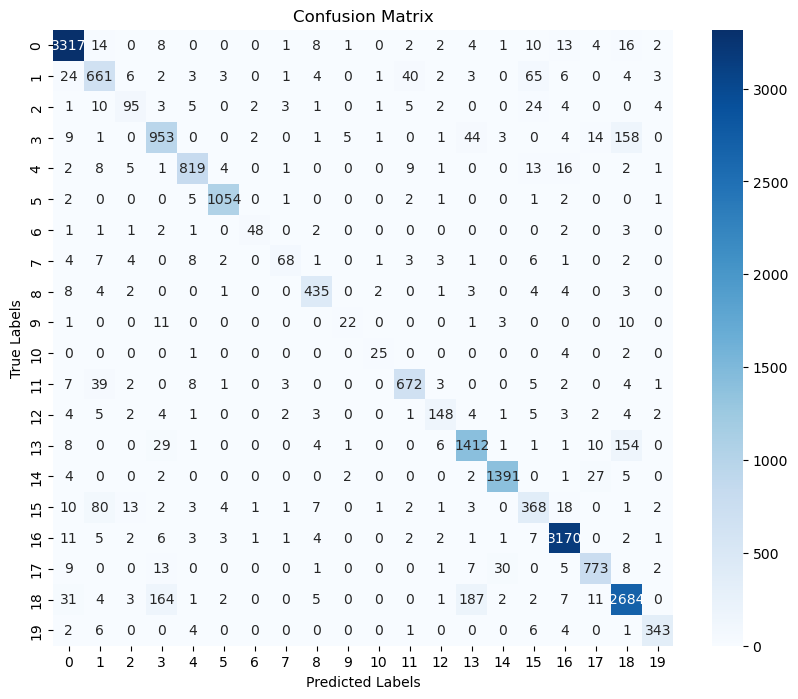

Epoch 48/50, Val Loss: 0.3526, Val Acc: 0.9085
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_48.pth


Epoch 49/50, Train Loss: 0.0623, Train Acc: 0.9790
Epoch 49/50, Starting Validation...


F1 Score (Macro): 0.8421
F1 Score (Weighted): 0.9074
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.77      0.80      0.78       828
           2       0.71      0.59      0.65       160
           3       0.79      0.80      0.79      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.99      0.98      1069
           6       0.89      0.77      0.82        61
           7       0.82      0.62      0.71       111
           8       0.92      0.93      0.92       467
           9       0.76      0.46      0.57        48
          10       0.74      0.78      0.76        32
          11       0.91      0.89      0.90       747
          12       0.84      0.77      0.80       191
          13       0.85      0.86      0.86      1628
          14       0.97      0.97      0.97      1434
          15       0.70      0.73      0.71       517
          16       0.97     

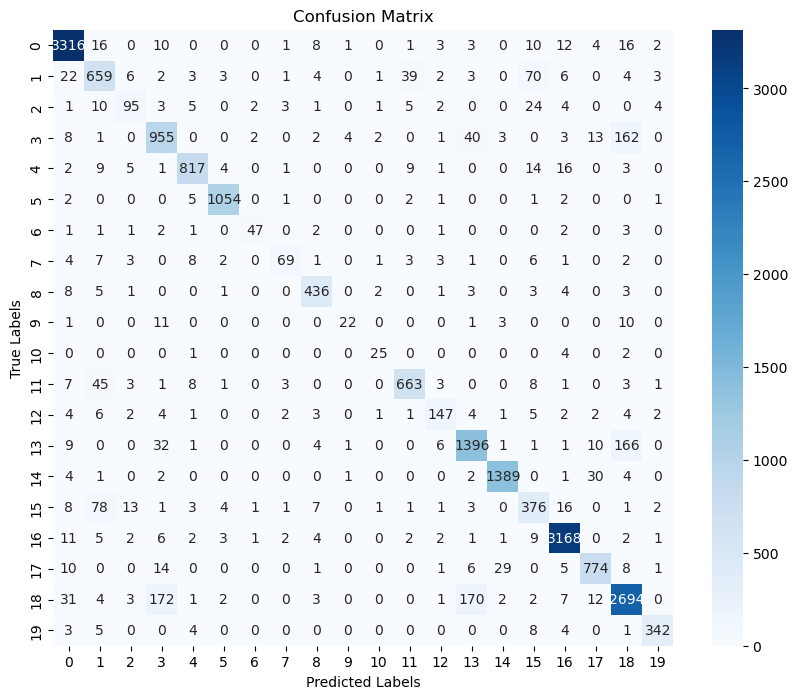

Epoch 49/50, Val Loss: 0.3531, Val Acc: 0.9079
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_49.pth


Epoch 50/50, Train Loss: 0.0640, Train Acc: 0.9786
Epoch 50/50, Starting Validation...


F1 Score (Macro): 0.8427
F1 Score (Weighted): 0.9082
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      3403
           1       0.78      0.79      0.79       828
           2       0.71      0.59      0.65       160
           3       0.78      0.80      0.79      1196
           4       0.95      0.93      0.94       882
           5       0.98      0.99      0.98      1069
           6       0.89      0.77      0.82        61
           7       0.82      0.62      0.71       111
           8       0.92      0.93      0.92       467
           9       0.76      0.46      0.57        48
          10       0.74      0.78      0.76        32
          11       0.91      0.89      0.90       747
          12       0.83      0.77      0.80       191
          13       0.85      0.86      0.86      1628
          14       0.97      0.97      0.97      1434
          15       0.70      0.73      0.71       517
          16       0.97     

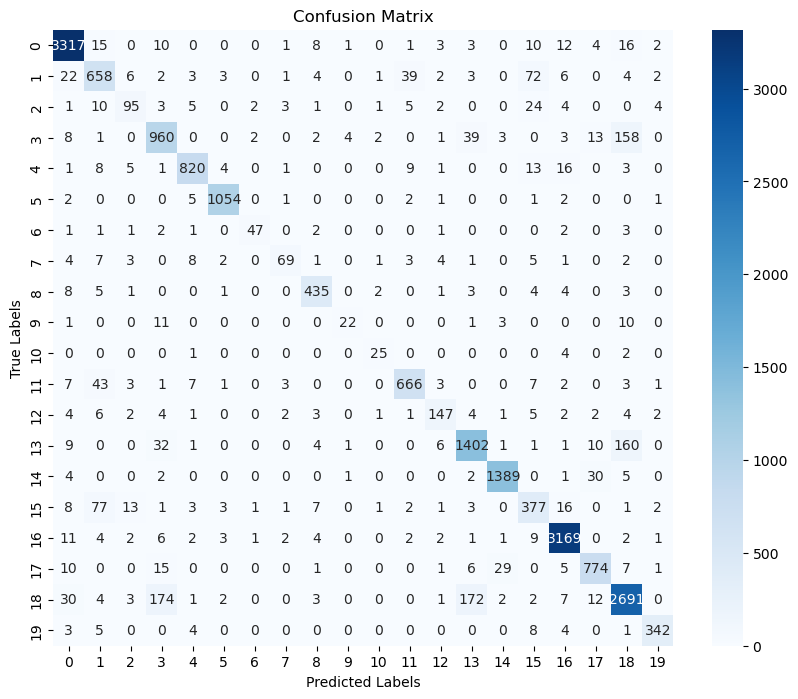

Epoch 50/50, Val Loss: 0.3528, Val Acc: 0.9086
Checkpoint saved at /content/drive/MyDrive/comp9444/vit_flloss\checkpoint_epoch_50.pth
Training completed!
Evaluating on Test Set...


F1 Score (Macro): 0.8233
F1 Score (Weighted): 0.9037
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      4254
           1       0.77      0.77      0.77      1035
           2       0.65      0.56      0.60       200
           3       0.78      0.78      0.78      1496
           4       0.95      0.94      0.94      1102
           5       0.98      0.98      0.98      1337
           6       0.74      0.64      0.68        78
           7       0.72      0.60      0.66       139
           8       0.90      0.93      0.92       583
           9       0.70      0.47      0.56        60
          10       0.74      0.61      0.67        41
          11       0.92      0.86      0.89       932
          12       0.83      0.80      0.81       237
          13       0.86      0.87      0.86      2034
          14       0.96      0.97      0.96      1791
          15       0.71      0.76      0.73       646
          16       0.97     

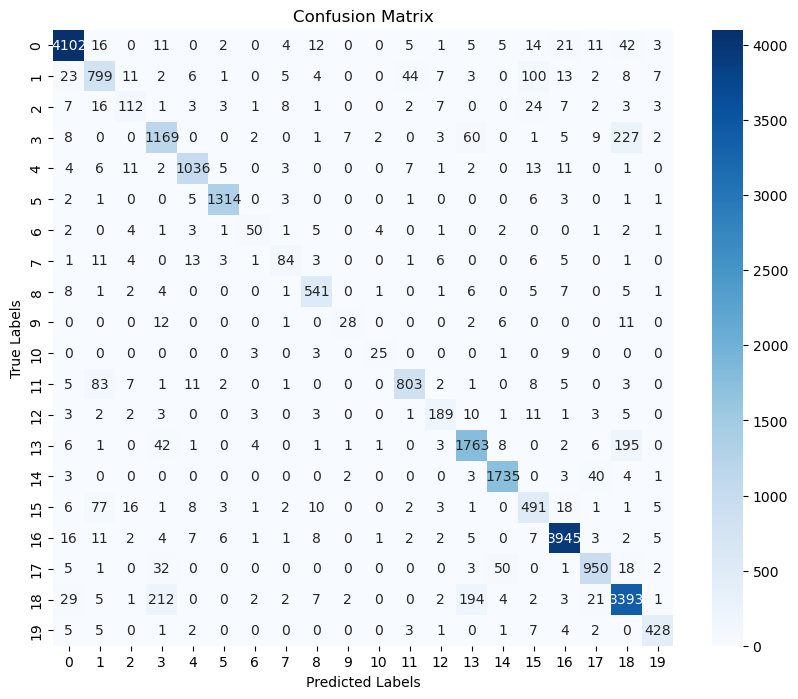

Test Results - Loss: 0.3620, Acc: 0.9040


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import warnings
import os
from pytorch_toolbelt.losses import CrossEntropyFocalLoss  # Import the focal loss

# Define the importance of classes


# 1. Ignore specific warnings (optional)
warnings.filterwarnings("ignore", message="The parameter 'pretrained' is deprecated")
warnings.filterwarnings("ignore", message="Torch was not compiled with flash attention")

# 2. Define the ViT model
def get_vit_model(num_classes=20):
    model = models.vit_b_16(weights=None)  # weights=None means random initialization
    num_features = model.heads.head.in_features
    model.heads.head = nn.Linear(num_features, num_classes)
    return model

# 3. Initialize the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# 4. Data preprocessing
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# 5. Load the dataset
data_dir = 'data_val'  # Ensure this is the directory containing train, val, and test folders
train_dir = os.path.join(data_dir, 'train')
val_dir = os.path.join(data_dir, 'val')
test_dir = os.path.join(data_dir, 'test')

# Create datasets
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform_train)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform_val_test)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform_val_test)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=200, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

print("Data loading completed!")
print(f"Class indices: {train_dataset.class_to_idx}")

# 6. Initialize the model, loss function, optimizer, and learning rate scheduler
num_classes = len(train_dataset.classes)  # Dynamically retrieve the number of classes
model = get_vit_model(num_classes=num_classes).to(device)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# Initialize mixed precision training
scaler = GradScaler()

# 7. Set checkpoint saving path
checkpoint_dir = '/content/drive/MyDrive/comp9444/vit_flloss'
os.makedirs(checkpoint_dir, exist_ok=True)
best_model_path = os.path.join(checkpoint_dir, 'best_vit_model.pth')

# 8. Define training parameters
num_epochs = 50
start_epoch = 0
best_val_acc = 0.0  # Used to save the best model based on the validation set

# 9. Define the function to load checkpoints
def load_checkpoint(epoch_num):
    checkpoint_file = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch_num}.pth')
    if os.path.exists(checkpoint_file):
        print(f"Loading checkpoint from epoch {epoch_num}...")
        checkpoint = torch.load(checkpoint_file, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        scaler.load_state_dict(checkpoint['scaler_state_dict'])
        global start_epoch, best_val_acc
        start_epoch = checkpoint['epoch'] + 1
        best_val_acc = checkpoint['best_val_acc']
        print(f"Resumed training from epoch {start_epoch}")
    else:
        print(f"No checkpoint found for epoch {epoch_num}.")

# 10. Check for existing checkpoints to resume training
initial_checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint_epoch_1.pth')
if os.path.exists(initial_checkpoint_path):
    print("Main checkpoint found, resuming training...")
    load_checkpoint(start_epoch)
else:
    print("No main checkpoint found, starting new training")

# 11. Define the evaluation function (unchanged)
from sklearn.metrics import f1_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    all_labels = []
    all_preds = []

    test_bar = tqdm(dataloader, desc="Evaluation", leave=False)

    with torch.no_grad():
        for images, labels in test_bar:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            with autocast():  # Use mixed precision for consistency with training
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data).item()

            # Collect all labels and predictions for F1 score and confusion matrix
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

            # Calculate accuracy for the current batch
            batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

            # Update tqdm description
            test_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    avg_loss = running_loss / len(dataloader.dataset)
    avg_acc = running_corrects / len(dataloader.dataset)

    # Compute F1 scores (macro and weighted averages)
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    print(f"F1 Score (Macro): {f1_macro:.4f}")
    print(f"F1 Score (Weighted): {f1_weighted:.4f}")

    # Print classification report
    print(classification_report(all_labels, all_preds))

    # Generate and plot confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

    return avg_loss, avg_acc

# 12. Training loop
for epoch in range(start_epoch, num_epochs):
    ######################
    # Training phase
    ######################
    model.train()
    running_loss = 0.0
    running_corrects = 0

    # Use tqdm to display training progress
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]", leave=False)

    for images, labels in train_bar:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data).item()

        # Calculate accuracy for the current batch
        batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

        # Update tqdm description
        train_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects / len(train_loader.dataset)

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}')

    ######################
    # Validation phase
    ######################
    print(f"Epoch {epoch+1}/{num_epochs}, Starting Validation...")
    val_loss, val_acc = evaluate(model, val_loader, criterion, device)
    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')

    # Save the best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best


Evaluating on Test Set...


F1 Score (Macro): 0.8233
F1 Score (Weighted): 0.9037
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      4254
           1       0.77      0.77      0.77      1035
           2       0.65      0.56      0.60       200
           3       0.78      0.78      0.78      1496
           4       0.95      0.94      0.94      1102
           5       0.98      0.98      0.98      1337
           6       0.74      0.64      0.68        78
           7       0.72      0.60      0.66       139
           8       0.90      0.93      0.92       583
           9       0.70      0.47      0.56        60
          10       0.74      0.61      0.67        41
          11       0.92      0.86      0.89       932
          12       0.83      0.80      0.81       237
          13       0.86      0.87      0.86      2034
          14       0.96      0.97      0.96      1791
          15       0.71      0.76      0.73       646
          16       0.97     

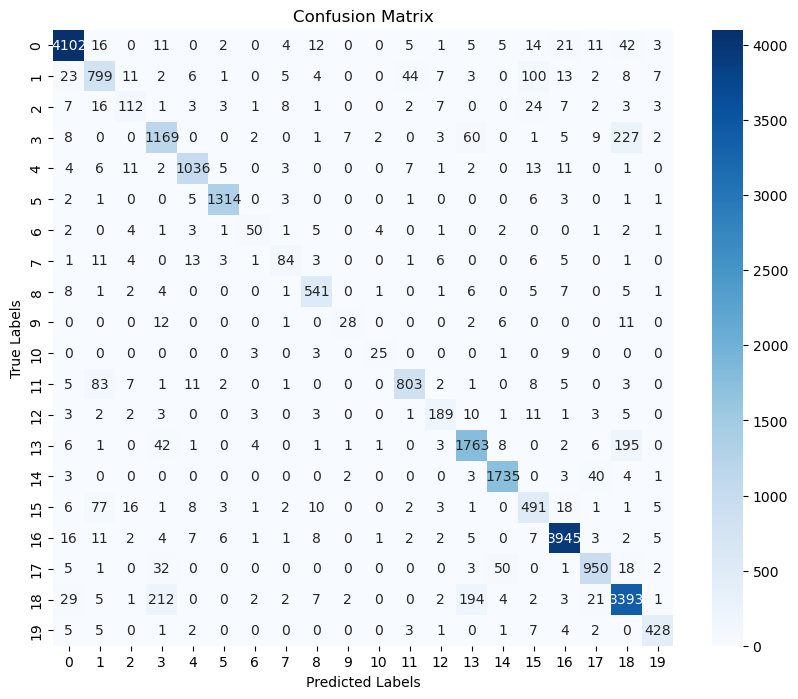

Test Results - Loss: 0.3620, Acc: 0.9040


In [2]:
model.load_state_dict(torch.load(best_model_path))
model.to(device)
model.eval()


criterion = nn.CrossEntropyLoss()

print("Evaluating on Test Set...")
test_loss, test_acc = evaluate(model, test_loader, criterion, device)
print(f'Test Results - Loss: {test_loss:.4f}, Acc: {test_acc:.4f}')



### Alpha 1
Here we try a different alpha (class weight), which is defined below as the threshold based on the number of class\
Notice: If you directly use pytorch_toolbelt like (pip install pytorch toolbelt). You can only install pytorch_toolbelt==0.6.3 because the newest version pytorch_toolbelt 0.7.0 are not supported. So you need to compiled it by yourself. If you do not install 0.7.0, you can not use the alpha(class_weights)parameter.

I modeled a version with alpha parameters by referring to the 0.7.0 version.
https://github.com/BloodAxe/pytorch-toolbelt.git

In [29]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader, random_split
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import warnings
import os
from pytorch_toolbelt.losses import CrossEntropyFocalLoss  # Import the focal loss

#define importance of classes
alpha = [
    0.5,  # bag
    0.5,  # bracelet
    0.5,  # brooch
    0.5,  # dress
    0.5,  # earrings
    2,  # eyewear
    2,  # gloves
    2,  # hairwear
    0.5,  # hats
    2,  # jumpsuit
    2,  # legwear
    0.5,  # necklace
    0.5,  # neckwear
    0.5,  # outwear
    0.5,  # pants
    0.5,  # rings
    0.5,  # shoes
    0.5,  # skirt
    0.5,  # top
    0.5   # watches
]
alpha = [value * 30 for value in alpha]


# 2. Define the ViT model
def get_vit_model(num_classes=20):
    model = models.vit_b_16(weights=None)  # weights=None means random initialization
    num_features = model.heads.head.in_features
    model.heads.head = nn.Linear(num_features, num_classes)
    return model

# 3. Initialize the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# 4. Data preprocessing
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# 5. Initialize model, loss function, optimizer, and scheduler
num_classes = 20  # Adjust the number of classes based on your task
model = get_vit_model(num_classes=num_classes).to(device)



alpha_tensor = torch.tensor(alpha).to(device)

criterion_Focal = CrossEntropyFocalLoss(gamma=2.0, reduction='mean', class_weights=alpha_tensor)



optimizer = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# Mixed precision training initialization
scaler = GradScaler()

# 6. Set checkpoint save path in /vit_flloss
checkpoint_dir = 'vit_flloss'
os.makedirs(checkpoint_dir, exist_ok=True)
best_model_path = os.path.join(checkpoint_dir, 'best_vit_model.pth')

# 7. Define training parameters
num_epochs = 10
start_epoch = 0
best_train_acc = 0.0  # To save the best model (based on training accuracy)

# Function to load checkpoint from a specific epoch
def load_checkpoint(epoch_num):
    checkpoint_file = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch_num}.pth')
    if os.path.exists(checkpoint_file):
        print(f"Loading checkpoint from epoch {epoch_num}...")
        checkpoint = torch.load(checkpoint_file, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        scaler.load_state_dict(checkpoint['scaler_state_dict'])
        global start_epoch, best_train_acc
        start_epoch = checkpoint['epoch'] + 1
        best_train_acc = checkpoint['best_train_acc']
        print(f"Resumed training from epoch {start_epoch}")
    else:
        print(f"No checkpoint found for epoch {epoch_num}.")

# 8. Check for saved checkpoint to resume training
checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint_epoch_1.pth')
if os.path.exists(checkpoint_path):
    print("Main checkpoint found, resuming training...")
    load_checkpoint(start_epoch)
else:
    print("No main checkpoint found, starting new training")




Using device: cuda
Main checkpoint found, resuming training...
No checkpoint found for epoch 0.


### Alpha 2
Here we try a different alpha (class weights), which is defined below as being linearly inversely proportional to the number of classes per class

In [ ]:
### fo alpha attemp 1

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader, random_split
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import warnings
import os
from pytorch_toolbelt.losses import CrossEntropyFocalLoss  # Import the focal loss

#define importance of classes
alpha = [
    0.28,   # bag
    1.15,   # bracelet
    6.0,    # brooch
    0.8,    # dress
    1.08,   # earrings
    0.89,   # eyewear
    11.55,  # gloves
    8.63,   # hairwear
    2.05,   # hats
    20.23,  # jumpsuit
    29.65,  # legwear
    1.28,   # necklace
    5.01,   # neckwear
    0.59,   # outwear
    0.67,   # pants
    1.85,   # rings
    0.3,    # shoes
    1.12,   # skirt
    0.31,   # top
    2.61    # watches
]




# 2. Define the ViT model
def get_vit_model(num_classes=20):
    model = models.vit_b_16(weights=None)  # weights=None means random initialization
    num_features = model.heads.head.in_features
    model.heads.head = nn.Linear(num_features, num_classes)
    return model

# 3. Initialize the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# 4. Data preprocessing
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# 5. Initialize model, loss function, optimizer, and scheduler
num_classes = 20  # Adjust the number of classes based on your task
model = get_vit_model(num_classes=num_classes).to(device)



alpha_tensor = torch.tensor(alpha).to(device)

criterion_Focal = CrossEntropyFocalLoss(gamma=2.0, reduction='mean', class_weights=alpha_tensor)



optimizer = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# Mixed precision training initialization
scaler = GradScaler()

# 6. Set checkpoint save path in /vit_flloss
checkpoint_dir = 'vit_flloss'
os.makedirs(checkpoint_dir, exist_ok=True)
best_model_path = os.path.join(checkpoint_dir, 'best_vit_model.pth')

# 7. Define training parameters
num_epochs = 10
start_epoch = 0
best_train_acc = 0.0  # To save the best model (based on training accuracy)

# Function to load checkpoint from a specific epoch
def load_checkpoint(epoch_num):
    checkpoint_file = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch_num}.pth')
    if os.path.exists(checkpoint_file):
        print(f"Loading checkpoint from epoch {epoch_num}...")
        checkpoint = torch.load(checkpoint_file, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        scaler.load_state_dict(checkpoint['scaler_state_dict'])
        global start_epoch, best_train_acc
        start_epoch = checkpoint['epoch'] + 1
        best_train_acc = checkpoint['best_train_acc']
        print(f"Resumed training from epoch {start_epoch}")
    else:
        print(f"No checkpoint found for epoch {epoch_num}.")

# 8. Check for saved checkpoint to resume training
checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint_epoch_1.pth')
if os.path.exists(checkpoint_path):
    print("Main checkpoint found, resuming training...")
    load_checkpoint(start_epoch)
else:
    print("No main checkpoint found, starting new training")




In [27]:
# 9. Training loop
for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0
    running_corrects = 0

    # Display training progress with tqdm
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]", leave=False)
    
    for images, labels in train_bar:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with autocast():
            outputs = model(images)
            loss = criterion_Focal(outputs, labels)  # Use focal loss for training

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data).item()

        # Calculate the accuracy of the current batch
        batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

        # Update the description in tqdm
        train_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects / len(train_loader.dataset)

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}')

    # Save the best model
    if epoch_acc > best_train_acc:
        best_train_acc = epoch_acc
        torch.save(model.state_dict(), best_model_path)
        print(f'Best model saved, Training Accuracy: {best_train_acc:.4f}')

    # Save checkpoint for the current epoch in /vit_flloss
    epoch_checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pth')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'best_train_acc': best_train_acc,
    }, epoch_checkpoint_path)
    print(f'Checkpoint saved for epoch {epoch+1} at {epoch_checkpoint_path}')

    # Adjust learning rate
    scheduler.step()

print("Training completed!")

Epoch 1/10, Train Loss: 0.7851, Train Acc: 0.2156
Best model saved, Training Accuracy: 0.2156
Checkpoint saved for epoch 1 at vit_flloss\checkpoint_epoch_1.pth


Epoch 2/10, Train Loss: 0.6570, Train Acc: 0.2585
Best model saved, Training Accuracy: 0.2585
Checkpoint saved for epoch 2 at vit_flloss\checkpoint_epoch_2.pth


Epoch 3/10, Train Loss: 0.6486, Train Acc: 0.2788
Best model saved, Training Accuracy: 0.2788
Checkpoint saved for epoch 3 at vit_flloss\checkpoint_epoch_3.pth


Epoch 4/10, Train Loss: 0.6363, Train Acc: 0.2964
Best model saved, Training Accuracy: 0.2964
Checkpoint saved for epoch 4 at vit_flloss\checkpoint_epoch_4.pth


Epoch 5/10, Train Loss: 0.6246, Train Acc: 0.3140
Best model saved, Training Accuracy: 0.3140
Checkpoint saved for epoch 5 at vit_flloss\checkpoint_epoch_5.pth


Epoch 6/10, Train Loss: 0.6243, Train Acc: 0.3175
Best model saved, Training Accuracy: 0.3175
Checkpoint saved for epoch 6 at vit_flloss\checkpoint_epoch_6.pth


Epoch 7/10, Train Loss: 0.6148, Train Acc: 0.3258
Best model saved, Training Accuracy: 0.3258
Checkpoint saved for epoch 7 at vit_flloss\checkpoint_epoch_7.pth


Epoch 8/10, Train Loss: 0.6186, Train Acc: 0.3110
Checkpoint saved for epoch 8 at vit_flloss\checkpoint_epoch_8.pth


Epoch 9/10, Train Loss: 0.6238, Train Acc: 0.3058
Checkpoint saved for epoch 9 at vit_flloss\checkpoint_epoch_9.pth


Epoch 10/10, Train Loss: 0.6178, Train Acc: 0.3214
Checkpoint saved for epoch 10 at vit_flloss\checkpoint_epoch_10.pth
Training completed!


C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.0864
F1 Score (Weighted): 0.2250
              precision    recall  f1-score   support

           0       0.71      0.27      0.39      4254
           1       0.00      0.00      0.00      1035
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00      1496
           4       0.00      0.00      0.00      1102
           5       1.00      0.00      0.01      1337
           6       0.00      0.00      0.00        78
           7       0.00      0.00      0.00       139
           8       0.00      0.00      0.00       583
           9       0.00      0.00      0.00        60
          10       0.00      0.00      0.00        41
          11       0.00      0.00      0.00       932
          12       0.00      0.00      0.00       237
          13       0.00      0.00      0.00      2034
          14       0.91      0.39      0.55      1791
          15       0.00      0.00      0.00       646
          16       0.22     

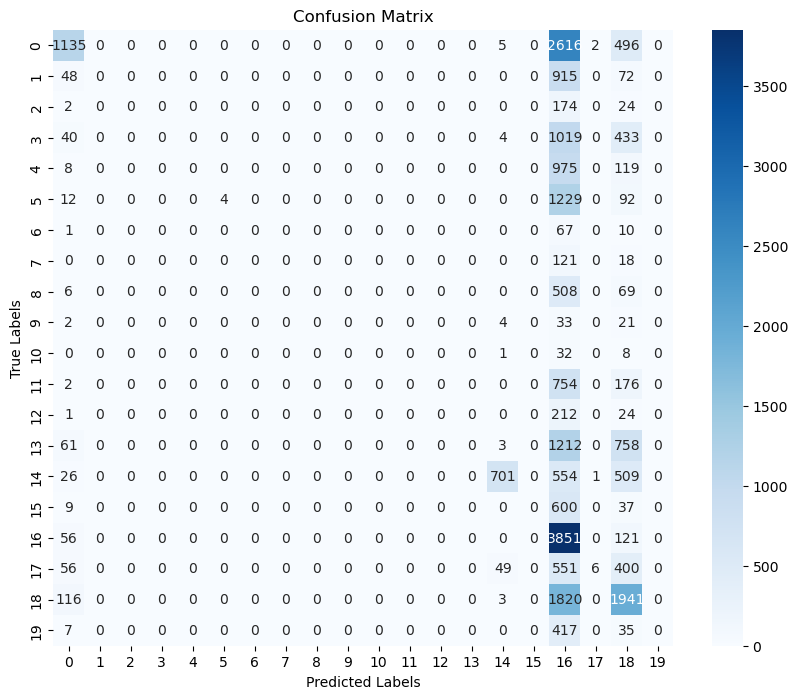

test result - Loss: 0.6313, Acc: 0.3008


In [32]:
### vit_flloss model eval
model.load_state_dict(torch.load('vit_flloss/best_vit_model.pth'))
model.to(device)
model.eval()

def evaluate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    all_labels = []
    all_preds = []

    test_bar = tqdm(dataloader, desc="test", leave=False)

    with torch.no_grad():
        for images, labels in test_bar:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            with torch.cuda.amp.autocast():  # Assuming autocast is used with mixed precision
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data).item()

            # Collect all labels and predictions for F1 score and confusion matrix
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

            # Display per-batch accuracy in the progress bar
            batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)
            test_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    avg_loss = running_loss / len(dataloader.dataset)
    avg_acc = running_corrects / len(dataloader.dataset)

    # Calculate F1 Score (macro and weighted)
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    print(f"F1 Score (Macro): {f1_macro:.4f}")
    print(f"F1 Score (Weighted): {f1_weighted:.4f}")

    # Print classification report
    print(classification_report(all_labels, all_preds))

    # Generate and plot confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

    return avg_loss, avg_acc

# eval
test_loss, test_acc = evaluate(model, test_loader, criterion_Focal, device)
print(f'test result - Loss: {test_loss:.4f}, Acc: {test_acc:.4f}')


### Alpha 3
Here we try a different alpha (class weights), which is defined below as exacerbating the effects of one category

In [41]:
### fo alpha attemp 2 training

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader, random_split
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import warnings
import os
from pytorch_toolbelt.losses import CrossEntropyFocalLoss  # Import the focal loss

#define importance of classes
alpha2 = [
    1,  # bag
    1,  # bracelet
    1,  # brooch
    1,  # dress
    1,  # earrings
    1,  # eyewear
    2,  # gloves
    1,  # hairwear
    1,  # hats
    1,  # jumpsuit
    1,  # legwear
    1,  # necklace
    1,  # neckwear
    1,  # outwear
    1,  # pants
    1,  # rings
    1,  # shoes
    1,  # skirt
    1,  # top
    1   # watches
]



alpha2_tensor = torch.tensor(alpha).to(device)

criterion_Focal = CrossEntropyFocalLoss(gamma=2.0, reduction='mean', class_weights=alpha2_tensor)



optimizer = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# 6. Set checkpoint save path in /vit_flloss2
checkpoint_dir = 'vit_flloss2'
os.makedirs(checkpoint_dir, exist_ok=True)
best_model_path = os.path.join(checkpoint_dir, 'best_vit_model.pth')

# 7. Define training parameters
num_epochs = 2
start_epoch = 0
best_train_acc = 0.0  # To save the best model (based on training accuracy)

# Function to load checkpoint from a specific epoch

# 8. Check for saved checkpoint to resume training
checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint_epoch_1.pth')
if os.path.exists(checkpoint_path):
    print("Main checkpoint found, resuming training...")
    load_checkpoint(start_epoch)
else:
    print("No main checkpoint found, starting new training")



# 9. Training loop
for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0
    running_corrects = 0

    # Display training progress with tqdm
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]", leave=False)
    
    for images, labels in train_bar:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with autocast():
            outputs = model(images)
            loss = criterion_Focal(outputs, labels)  # Use focal loss for training

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data).item()

        # Calculate the accuracy of the current batch
        batch_acc = torch.sum(preds == labels.data).item() / labels.size(0)

        # Update the description in tqdm
        train_bar.set_postfix({'Loss': f"{loss.item():.4f}", 'Acc': f"{batch_acc:.4f}"})

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects / len(train_loader.dataset)

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}')

    # Save the best model
    if epoch_acc > best_train_acc:
        best_train_acc = epoch_acc
        torch.save(model.state_dict(), best_model_path)
        print(f'Best model saved, Training Accuracy: {best_train_acc:.4f}')

    # Save checkpoint for the current epoch in /vit_flloss
    epoch_checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pth')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'best_train_acc': best_train_acc,
    }, epoch_checkpoint_path)
    print(f'Checkpoint saved for epoch {epoch+1} at {epoch_checkpoint_path}')

    # Adjust learning rate
    scheduler.step()

print("Training completed!")









TypeError: cannot assign 'list' object to buffer 'class_weights' (torch Tensor or None required)

C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\59698\.conda\envs\pytorch190\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


F1 Score (Macro): 0.1263
F1 Score (Weighted): 0.3035
              precision    recall  f1-score   support

           0       0.44      0.76      0.56      4254
           1       0.00      0.00      0.00      1035
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00      1496
           4       0.00      0.00      0.00      1102
           5       1.00      0.00      0.00      1337
           6       0.00      0.00      0.00        78
           7       0.00      0.00      0.00       139
           8       0.00      0.00      0.00       583
           9       0.00      0.00      0.00        60
          10       0.00      0.00      0.00        41
          11       1.00      0.00      0.00       932
          12       0.00      0.00      0.00       237
          13       0.85      0.01      0.02      2034
          14       0.89      0.53      0.66      1791
          15       0.00      0.00      0.00       646
          16       0.34     

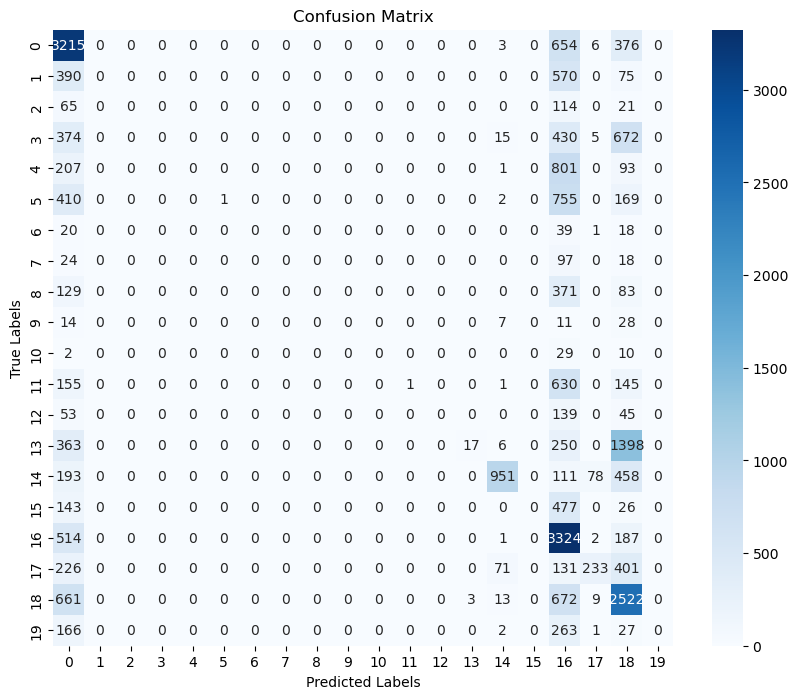

test result - Loss: 0.5736, Acc: 0.4042


In [39]:
### vit_flloss2 model eval
model.load_state_dict(torch.load('vit_flloss2/best_vit_model.pth'))
model.to(device)
model.eval()

# eval
test_loss, test_acc = evaluate(model, test_loader, criterion_Focal, device)
print(f'test result - Loss: {test_loss:.4f}, Acc: {test_acc:.4f}')
